In [1]:
# DL-Clip
# lyapunov 函数直接用神经网络学习，设置 V>0, V_dot<0, V(0)=0 为损失函数
# 对象为 Pendulum

import torch
from torch import nn
from torch.nn import functional as F
import numpy as np
import matplotlib.pyplot as plt
import cvxpy as cp
import pickle
from datetime import datetime
from systems_and_functions.control_affine_system import ControlAffineSystem
from systems_and_functions.cart_pole_system import CartPole
from systems_and_functions.inverted_pendulum_system import InvertedPendulum

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [2]:
class PolicyNet(nn.Module):
    def __init__(
        self, 
        n_states: int = 4, 
        n_hiddens: int = 16,
        n_actions: int = 2, 
        action_bound: float = 5.0
        # n_states, 
        # n_hiddens,
        # n_actions, 
        # action_bound
    ):
        super(PolicyNet, self).__init__()
        # 环境可以接受的动作最大值
        self.action_bound = action_bound
        self.n_actions = n_actions
        # 只包含一个隐含层
        self.fc1 = nn.Linear(n_states, n_hiddens)
        self.fc2 = nn.Linear(n_hiddens, n_actions + 1)

    # 前向传播
    def forward(self, x):
        x = x.t()
        x = self.fc1(x)  # [b,n_states]-->[b,n_hiddens]
        x = F.relu(x)
        x = self.fc2(x)  # [b,n_hiddens]-->[b,n_actions]
        # x = F.relu(x)
        # x = torch.tanh(x)  # 将数值调整到 [-1,1]
        # u = x * self.action_bound  # 缩放到 [-action_bound, action_bound]
        return x
    
    def Controller(self, x):
        # x = x.t()
        u = self.forward(x).t()[:self.n_actions]
        # u = u * self.action_bound  # 缩放到 [-action_bound, action_bound]
        return u

class LyapunovNet(nn.Module):
    def __init__(
        self,
        n_states:int = 4, 
        n_hiddens:int = 128
    ):
        super(LyapunovNet, self).__init__()
        self.fc1 = nn.Linear(n_states, n_hiddens)
        self.fc2 = nn.Linear(n_hiddens, n_hiddens)
        self.fc3 = nn.Linear(n_hiddens, 2)

    def forward(self, x):
        # x = x.clone().detach().requires_grad_(True)
        s = self.fc1(x)  # -->[b, n_hiddens]
        # s = F.relu(s)
        s = torch.tanh(s)
        s = self.fc2(s)  # -->[b, n_hiddens]
        # s = F.relu(s)
        s = torch.tanh(s)
        V = self.fc3(s)  # -->[b, 1]
        # V = 0.5 * torch.pow(V,2) # semi-positive definite
        return V
    
    def V(self, x):
        return self.forward(x)[:,0]

    def V_with_JV(self, x):
        x = x.clone().detach().requires_grad_(True)
        V = self.forward(x)
        JV = torch.autograd.grad(V, x)
        return V, JV

class DFunctionNet(nn.Module):
    def __init__(
        self,
        n_states:int = 4, 
        n_hiddens: int = 128, 
        n_actions: int = 2
    ):
        super(DFunctionNet, self).__init__()
        self.fc1 = nn.Linear(n_states + n_actions, n_hiddens)
        self.fc2 = nn.Linear(n_hiddens, n_hiddens)
        self.fc3 = nn.Linear(n_hiddens, 2)

    # 前向传播
    def forward(self, x, a):
        # 拼接状态和动作
        cat = torch.cat([x, a], dim=1)  # [b, n_states + n_actions]
        x = self.fc1(cat)  # -->[b, n_hiddens]
        x = F.relu(x)
        x = self.fc2(x)  # -->[b, n_hiddens]
        x = F.relu(x)
        x = self.fc3(x)  # -->[b, 1]
        return x

    def D(self, x, a):
        return self.forward(x, a)[:,0]

In [3]:
# D learning 类，包含了D learning中的各种功能函数 
# TODO: 类暂未完成
class DlearningProcess:
    def __init__(
        self, 
        system: ControlAffineSystem,
        actor_bound: float = 5.0,
        n_hiddens_policy: int = 16,
        n_hiddens_lyapunov: int = 128,
        n_hiddens_dfunction: int = 128,
        actor_lr: float = 0.01,
        lyapunov_lr: float = 0.01,
        dfunction_lr: float = 0.01,
        sigma: float = 0.5,
        tau: float = 0.1,
        device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu'),
    ):
        # 属性分配
        self.system = system # 动力学系统
        self.sigma = sigma # 噪声标准差
        self.tau = tau # 软更新权重
        self.n_states = self.system.state_dims()
        self.n_actions = self.system.control_dims()
        self.device = device
        # 训练网络
        self.actor = PolicyNet(self.system.state_dims(), n_hiddens_policy, self.system.control_dims(), actor_bound).to(device)
        self.lyapunov = LyapunovNet(self.system.state_dims(), n_hiddens_lyapunov).to(device)
        self.dfunction = DFunctionNet(self.system.state_dims(), n_hiddens_dfunction, self.system.control_dims()).to(device)
        # 训练网络的优化器
        self.actor_optimizer = torch.optim.Adam(self.actor.parameters(), lr=actor_lr)
        self.lyapunov_optimizer = torch.optim.Adam(self.lyapunov.parameters(), lr=lyapunov_lr)
        self.dfunction_optimizer = torch.optim.Adam(self.dfunction.parameters(), lr=dfunction_lr)

        # DONE: 初始化神经网络控制器


    def initialize_policy_net(
            self,
            x_train_lim: int = 10,
            x_test_lim: int = 13,
            sample_num: int = 1000,
            iteration: int = 2*10**4,
            lr: float = 1e-4
    ):
        """
        用神经网络拟合专家策略（线性静态状态反馈）
        """
        print('---------------------Initializing Policy------------------------')

        # x = torch.linspace(-x_train_lim, x_train_lim, sample_num, dtype=torch.float)
        # train_data = torch.stack([x] * self.system.state_dims(), dim = 1).to(self.device)

        random_data = [-x_train_lim + torch.rand(400)*2*x_train_lim for _ in range(self.system.state_dims())]
        train_data = torch.stack(random_data, dim=1).to(self.device)
        K = torch.tensor(-self.system.K)
        zero_column = torch.zeros(1, 2)
        K_extended = torch.vstack((K, zero_column)).t().to(self.device)
        labels = train_data @ K_extended
        loss_fn = nn.MSELoss()
        optimizer = torch.optim.SGD(self.actor.parameters(), lr = lr)
        for i in range(iteration):
            optimizer.zero_grad()
            y_train = self.actor(train_data.t())
            loss = loss_fn(y_train, labels)
            # if i % 10000 == 0:
            #     print(f'times {i} - lr {lr} -  loss: {loss.item()}')
            if (i + 1) % 1000 == 0:
                print ('Epoch [{}/{}], Loss: {:.10f}'.format(i + 1, iteration, loss.item()))
            loss.backward()
            optimizer.step()
        # test部分
        # x_ = torch.linspace(-x_test_lim, x_test_lim, sample_num, dtype=torch.float)
        # test_data = torch.stack([x_] * self.system.state_dims(), dim=1).to(self.device)
        # labels = test_data @ K.t().to(self.device)
        # y_test = self.actor.Controller(test_data.t())
        # plt.plot(x.cpu().detach().numpy(), labels.cpu().detach().numpy(), c='red', label='True')
        # plt.plot(x.cpu().detach().numpy(), y_test.t().cpu().detach().numpy(), c='blue', label='Pred')
        # plt.legend(loc='best')
        # plt.show()
    
    
    def sample_training_data(
        #  沿轨迹采样 + 均匀分布采样 
        self,
        sample_trajectory_number: int = 10,
        sample_number_per_trajectory: int = 500,
        sample_radius: int = 15,
        sample_number_in_radius: int = 0,
        invariant_sample: bool = True,
        sample_plot: bool = True,
        the_controller = None, # 指定控制器，默认为ControlAffineSystem自带控制器
        title = "Samples"
    )->torch.Tensor:
        print('---------------------Sampling Training Data---------------------')
        """
        sample training data
        data content: x_i, x_dot_i, controller_params
        sample strategy: data set is composed of two parts: 
            samples from trajectory;
            samples from random state;
            (if invariant_sample is true, random state point is Unchanging) 
        """
        # initialize system: use LQR as 
        # self.system.compute_LQR_controller()
        # self.system.use_LQR_controller()

        # sample initialize ([100, 2, 2, 1])
        # dim1: sample index
        # dim2: x  x'
        # dim3: x1 x2
        # dim4: value
        sample_from_trajectory = torch.zeros(sample_trajectory_number*sample_number_per_trajectory,2,2,1).to(self.device)
        sample_from_radius = torch.zeros(sample_number_in_radius,2,2,1).to(self.device)
        theta = np.linspace(0, 2*np.pi, sample_trajectory_number + 1)
        
        # sample in trajectory
        for i in range(0, sample_trajectory_number):
            x_0_traj = torch.tensor([[sample_radius*np.cos(theta[i])],[sample_radius*np.sin(theta[i])]],dtype=torch.float).to(self.device)
            simulate_rk4 = self.system.simulate_rk4(x_0_traj,sample_number_per_trajectory,1,the_controller)
            x = simulate_rk4[:,0].unsqueeze(1)
            x_dot = simulate_rk4[:,1].unsqueeze(1)
            sample_from_trajectory[i*sample_number_per_trajectory:(i+1)*sample_number_per_trajectory] = torch.cat((x, x + x_dot*self.system.dt), dim=1)

        # sample randomly in radius
        if invariant_sample == True:
            np.random.seed(42)
        theta_ = np.random.uniform(0, 2*np.pi, sample_number_in_radius)
        r_ = np.sqrt(np.random.uniform(0, sample_radius**2, sample_number_in_radius))
        combined_data = zip(theta_, r_)
        i = 0
        for data in combined_data:
            theta__, r__ = data
            x_0_radius = torch.tensor([[r__ * np.cos(theta__)],[r__ * np.sin(theta__)]]).to(self.device)
            one_step_euler = self.system.one_step_euler(x_0_radius,1,the_controller)[1].to(self.device)
            x = one_step_euler[0].unsqueeze(0)
            x_dot = one_step_euler[1].unsqueeze(0)
            sample_from_radius[i] = torch.cat((x, x + x_dot*self.system.dt), dim=0)
            i = i + 1

        if sample_plot == True:
            x1_trajectory = sample_from_trajectory[:,0,0,:].cpu().detach().numpy()
            x2_trajectory = sample_from_trajectory[:,0,1,:].cpu().detach().numpy()
            plt.scatter(x1_trajectory, x2_trajectory, s=10, alpha=0.5, c='c', label='sample_from_trajectory')

            x1_radius = sample_from_radius[:,0,0,:].cpu().detach().numpy()
            x2_radius = sample_from_radius[:,0,1,:].cpu().detach().numpy()
            plt.scatter(x1_radius, x2_radius, s=10, alpha=0.5, c='g', label='sample_from_radius')
            ax = plt.gca()
            ax.set_aspect(1)
            plt.xlabel('x1')
            plt.ylabel('x2')
            plt.title(title)
            plt.legend()
            plt.grid(True)
            plt.show()

        sample_data = torch.cat((sample_from_trajectory,sample_from_radius),dim=0).to(self.device)
        return sample_data


    def learn_V_LQF(
        self,
        sample_data,
        plot_lyapuonv: bool = True
    ):
        """
        learn a V(x) by constraining V(x)>=0, V_dot(x)<=0
        """
        print('--------------------------Learning V--------------------------')
        sample_data = sample_data.cpu().detach().numpy()
        P = cp.Variable((self.system.state_dims(), self.system.state_dims()))
        eta = cp.Variable()
        
        constraints = [P.T == P, eta>=0]
        for i in range(sample_data.shape[0]):
            xi = sample_data[i][0]
            xi_dot = (sample_data[i][1]-sample_data[i][0])/self.system.dt
            constraints.append(xi.T@P@xi>=0)
            constraints.append(xi.T@P@xi_dot+xi_dot.T@P@xi<=-eta*np.linalg.norm(xi)**2)

        objective = cp.Minimize(-eta)
        problem = cp.Problem(objective, constraints)
        # 求解优化问题
        problem.solve()
        print("status:",problem.status)
        # print("optimal value",problem.value)
        # 输出解
        print("var eta (eta should be positive):", eta.value)
        print("var P:", P.value)
        self.P = torch.tensor(P.value).float()

        if plot_lyapuonv:
            xlim = 5
            ylim = 5
            print('-----------------------Plotting Lyapunov-----------------------')
            x = np.linspace(-xlim, xlim, 100)
            y = np.linspace(-ylim, ylim, 100)
            X, Y = np.meshgrid(x, y)
            grid = np.stack([X, Y], axis=-1)
            P = self.P
            Z = np.einsum('...i,ij,...j->...', grid, P, grid)

            plt.figure(figsize=(8, 6))
            plt.contourf(X, Y, Z, levels=25, cmap='RdBu')
            plt.colorbar(label='Lyapunov Function')
            plt.xlabel(r"$\mathregular{x_{1}}$")
            plt.ylabel(r"$\mathregular{x_{2}}$")
            plt.title('Lyapunov Function Contour Plot')
            plt.show()


    def V_value_P_batch(self, x: torch.Tensor):
        """
        x:[sample num, value, n dims]
        return [sumple num, value]
        """
        P = self.P.to(self.device)
        xP = torch.matmul(x, P)
        quadratic_form = torch.sum(xP * x, dim=1, keepdim=True)

        return quadratic_form


    def initialize_lyapunov_net(
            self,
            x_train_lim: int = 15,
            x_test_lim: int = 13,
            sample_num: int = 1000,
            iteration: int = 5*10**4,
            lr: float = 1e-3,
            plot_loss: bool = True,
            plot_lyapuonv: bool = True
    ):
        """
        用lyapunov_net拟合二次型lyapunov作为初始化
        """
        print('--------------------Initializing Lyapunov---------------------')
        random_data = [-x_train_lim + torch.rand(sample_num) * 2 * x_train_lim for _ in range(self.system.state_dims())]
        training_data = torch.stack(random_data, dim=1).to(self.device)
        V_value_P = self.V_value_P_batch(training_data)
        labels = torch.cat([V_value_P, torch.zeros(V_value_P.shape[0],1).to(self.device)], dim=1).to(self.device)

        loss_fn = nn.MSELoss()
        # optimizer = self.lyapunov_optimizer
        # optimizer = torch.optim.Adam(self.lyapunov.parameters(), lr = lr)
        optimizer = torch.optim.Adam(self.lyapunov.parameters(), lr=lr, betas=(0.9, 0.999), eps=1e-8, weight_decay=0)
        loss_values = []
        for i in range(iteration):
            optimizer.zero_grad()
            y_train = self.lyapunov(training_data)
            param_squares = [p ** 2 for p in self.lyapunov.parameters()]
            param_sum_square = sum(torch.sum(p) for p in param_squares)
            loss = loss_fn(y_train, labels) + 0.01 * param_sum_square
            # if i % 10000 == 0:
            #     print(f'times {i} - lr {lr} -  loss: {loss.item()}')
            loss_values.append(loss.item())
            if (i + 1) % 1000 == 0:
                print ('Epoch [{}/{}], Loss: {:.10f}'.format(i + 1, iteration, loss.item()))
            loss.backward()
            optimizer.step()
        
        if plot_loss:
            plt.figure(figsize=(10, 5))
            plt.plot(loss_values, label='Loss')
            plt.xlabel('Iteration')
            plt.ylabel('Loss')
            plt.title('Initializing V Loss')
            plt.legend() 
            plt.show()

        if plot_lyapuonv:
            self.plot_contour(5, 5, 'Lyapunov')

    # DONE: learn a NN Lyapunov Candidate using discrete data
    def learn_V_LNN(
        self,
        sample_data,
        iteration: int = 3*10**3,
        plot_loss: bool = True,
        plot_lyapuonv: bool = True,
        lr: float = 1e-4
    ):
        dt = self.system.dt
        print('--------------------------Learning V--------------------------')
        sample_data = sample_data.detach().clone()
        sample_data = sample_data.to(self.device)
        # DONE: using sample_data = sample_data.detach().clone()
        # RuntimeError: Trying to backward through the graph a second time 
        # (or directly access saved tensors after they have already been freed).
        # Saved intermediate values of the graph are freed when you call 
        # .backward() or autograd.grad(). Specify retain_graph=True 
        # if you need to backward through the graph a second time or 
        # if you need to access saved tensors after calling backward

        # sample initialize ([100, 2, 2, 1])
        # dim1: sample index
        # dim2: x  x'
        # dim3: x1 x2
        # dim4: value
        print('---------------')
        N = sample_data.shape[0]
        s = sample_data[:,0].permute(0, 2, 1).squeeze(1)
        s_ = sample_data[:,1].permute(0, 2, 1).squeeze(1)
        s0 = torch.tensor([[0.],[0.]]).t().to(self.device)
 
        self.lyapunov.to(self.device)  # 确保模型在GPU上
        optimizer = torch.optim.Adam(self.lyapunov.parameters(), lr=lr, betas=(0.9, 0.999), eps=1e-8, weight_decay=0)
        # self.lyapunov_optimizer
        loss_values = []

        
        # 扩大 ROA
        # Circle_Tuning = Tune(sample_data[:,0]).squeeze()
        data = sample_data[:,0]
        result = []
        for j in range(data.shape[0]):
            row_sum = torch.sum(data[j,:]**2)
            f = torch.sqrt(row_sum)
            result.append(f.item())  # 将结果添加到列表中，使用item()获取标量值
        Circle_Tuning = torch.tensor(result)
        Circle_Tuning = Circle_Tuning.to(self.device).squeeze()
        for i in range(iteration):
            # loss = self.lyapunov(s0)**2 + (sum(F.relu(-self.lyapunov(s.permute(0,2,1)))) + sum(F.relu((self.lyapunov(s_.permute(0,2,1))-self.lyapunov(s.permute(0,2,1)))/dt)))/N
            L0 = self.lyapunov.V(s0)
            Ls = self.lyapunov.V(s)
            Ls_ = self.lyapunov.V(s_)
            dL = (Ls_ - Ls) / dt
            SND = torch.sum(F.relu(dL+0.5))
            PD = torch.sum(F.relu(-Ls))

            # param_squares = [p ** 2 for p in self.lyapunov.parameters()]
            # param_sum_square = sum(torch.sum(p) for p in param_squares)
            # loss = L0**2 + (PD + SND) + 0.01 * param_sum_square

            Ls_squeezed = Ls.squeeze()
            loss = (PD + 1.5 * SND)/N + 1.2* L0.pow(2) + 2.2*((Circle_Tuning-6*Ls_squeezed).pow(2)).mean()
        
            loss.backward(retain_graph = True)  # 计算损失的梯度
            with torch.no_grad(): 
                optimizer.step()                # 根据梯度更新模型参数
                optimizer.zero_grad()           # 清除梯度，准备下一个迭代
            loss_values.append(loss.item())
            if (i + 1) % 1000 == 0:
                print ('Epoch [{}/{}], Loss: {:.10f}'.format(i + 1, iteration, loss.item()))

        if plot_loss:
            plt.figure(figsize=(10, 5))
            plt.plot(loss_values, label='Loss')
            plt.xlabel('Iteration')
            plt.ylabel('Loss')
            plt.title('Training V Loss')
            plt.legend() 
            plt.show()
        
        if plot_lyapuonv:
            self.plot_contour()
        print('L0:{}, PD:{}, torch.sum(F.relu(dL)):{}'.format(L0, PD, torch.sum(F.relu(dL)) ))
    
    def plot_contour(
        self,
        xlim = 5,
        ylim = 5,
        select = 'Lyapunov'
    ):
        print('-----------------------Plotting Lyapunov-----------------------')
        x = np.linspace(-xlim, xlim, 100)
        y = np.linspace(-ylim, ylim, 100)
        X, Y = np.meshgrid(x, y)
        Z = np.zeros(X.shape)
        for i in range(X.shape[0]):
            for j in range(X.shape[1]):
            # 将X和Y的值合并成一个二维列向量
                xy = torch.tensor([[X[i, j], Y[i, j]]], dtype=torch.float32).to(device)
                # 计算Lyapunov函数值
                if select == 'Dfunction':
                    Z[i, j] = self.dfunction.D(xy,self.actor.Controller(xy.t())).item()
                else:
                    Z[i, j] = self.lyapunov.V(xy).item()

        plt.figure(figsize=(8, 6))
        plt.contourf(X, Y, Z, levels=25, cmap='RdBu')
        plt.colorbar(label='Function Value')
        plt.xlabel(r"$\mathregular{x_{1}}$")
        plt.ylabel(r"$\mathregular{x_{2}}$")
        plt.title(select +' Function Contour Plot')
        plt.show()

    def learn_D_DNN(
        self,
        sample_data,
        iteration: int = 10**4,
        plot_loss: bool = True,
        plot_dfunction: bool = True,
        lr: float = 1e-4
    ):
        dt = self.system.dt
        print('--------------------------Learning D--------------------------')
        sample_data = sample_data.detach().clone()
        N = sample_data.shape[0]
        s = sample_data[:,0].permute(0, 2, 1)
        s_ = sample_data[:,1].permute(0, 2, 1)
        s0 = torch.tensor([[0.],[0.]]).to(device)
        a0 = self.actor.Controller(s0)
        Ls = self.lyapunov(s)
        Ls_ = self.lyapunov(s_)
        dL = ((Ls_ - Ls) / dt).squeeze(1)
        print(dL.shape)
        a = self.actor.Controller(s.squeeze(1).t()).t()
        # optimizer = self.dfunction_optimizer
        optimizer = torch.optim.Adam(self.dfunction.parameters(), lr=lr, betas=(0.9, 0.999), eps=1e-8, weight_decay=0)
        loss_values = []
        loss_fn = nn.MSELoss()
        for i in range(iteration):
            D0 = self.dfunction.D(s0.t(), a0)
            DV_ext = self.dfunction(s.squeeze(1),a)
            DV = self.dfunction.D(s.squeeze(1),a)
            param_squares = [p ** 2 for p in self.dfunction.parameters()]
            param_sum_square = sum(torch.sum(p) for p in param_squares)
            loss = torch.sum(loss_fn(dL, DV_ext)) + torch.sum(F.relu(DV)) + D0**2 + 0.01 * param_sum_square
            loss.backward(retain_graph = True)
            with torch.no_grad(): 
                optimizer.step()
                optimizer.zero_grad()
            loss_values.append(loss.item())
            if (i + 1) % 1000 == 0:
                print ('Epoch [{}/{}], Loss: {:.10f}'.format(i + 1, iteration, loss.item()))
        
        if plot_loss:
            plt.figure(figsize=(10, 5))
            plt.plot(loss_values, label='Loss')
            plt.xlabel('Iteration')
            plt.ylabel('Loss')
            plt.title('Training D Loss')
            plt.legend()
            plt.show()
        
        if plot_dfunction:
            self.plot_contour(select='Dfunction')
        print('torch.sum(loss_fn(dL, DV_ext)):{}, torch.sum(F.relu(DV)):{}, D0:{}'.format(torch.sum(loss_fn(dL, DV_ext)),torch.sum(F.relu(DV)),D0))

    def upper_bound_loss(self, output, K0):
        positive_penalty = torch.sum(torch.relu(output + 0.1))
        control_effort_penalty = torch.sum(self.Learned_K**2)
        upper_bound = torch.max(output, dim=0).values
        control_deviation_penalty = torch.sum((self.Learned_K - K0)**2)
        # print('upper_bound:{}, positive_penalty:{}'.format(upper_bound, positive_penalty))
        return upper_bound + positive_penalty + control_effort_penalty*0 + control_deviation_penalty*0
    
    def mean_variance_loss(self,output):
        positive_penalty = torch.sum(torch.relu(output))
        mean = torch.mean(output)
        variance = torch.var(output)
        # print('Mean:{}, Variance:{}'.format(mean, variance))
        return mean + variance*0.1 + positive_penalty*1000

    def upper_bound_mean_variance_loss(self,output,temp):
        """
        """
        positive_penalty = torch.sum(torch.relu(output))
        # upper_bound = torch.max(output, dim=0).values
        upper_bound = torch.max(temp, dim=0).values
        mean = torch.mean(output)
        variance = torch.var(output)
        return upper_bound*100 + mean*10 + variance*0 + positive_penalty*1000


    def imitate_PPO(
        self,
        N,
        a_new,
        a_old    
    ):
        Epsilon = 0.2
        # Calculate ratio for each element
        ratio = torch.norm(a_new / a_old, dim=1)  # dim=1 to calculate norm along rows
        # Update a_new if ratio condition is met
        for i in range(N):
            if ratio[i] <= 1 - Epsilon:
                a_new[i] = a_old[i] * (1 - Epsilon)
            elif ratio[i] >= 1 + Epsilon:
                a_new[i] = a_old[i] * (1 + Epsilon)
            else:
                # No action needed if ratio is within bounds
                pass
        return a_new

            
    # TODO: 策略改进
    def policy_improvement_PPO(
        self,
        sample_data,
        iteration: int = 10**4,
        plot_loss: bool = True,
        lr: float = 1e-4,
    ):
        print('----------------------Improveing Policy-----------------------')
        sample_data = sample_data.detach().clone()
        N = sample_data.shape[0]
        s = sample_data[:,0].permute(0, 2, 1).squeeze(1)
        # a = self.actor.Controller(s.t()).t()
        # DV = self.dfunction.D(s,a)
        # optimizer = self.actor_optimizer
        optimizer = torch.optim.Adam(self.actor.parameters(), lr=lr, betas=(0.9, 0.999), eps=1e-8, weight_decay=0)
        loss_values = []
        
        a_old = self.actor.Controller(s.t()).t()

        for i in range(iteration):
  
            a_new = self.actor.Controller(s.t()).t()
            a = self.imitate_PPO(N,a_new,a_old)
     
            DV = self.dfunction.D(s.squeeze(1),a)
      
            s_squared = torch.pow(s, 2)
            s_sum = torch.sum(s_squared, dim=1, keepdim=True) 
            s_sum = s_sum.squeeze()

            # 检查s_sum中是否有元素为0
            zero_indices = (s_sum == 0)
            # 将为0的元素设置为10^-6
            s_sum[zero_indices] = 1e-6
            
            DV_s = DV / s_sum
        
            param_squares = [p ** 2 for p in self.actor.parameters()]
            param_sum_square = sum(torch.sum(p) for p in param_squares)
            loss = self.upper_bound_mean_variance_loss(DV,DV_s) + 0.01 * param_sum_square
            loss.backward(retain_graph = True)

            with torch.no_grad(): 
                optimizer.step()
                optimizer.zero_grad()
            loss_values.append(loss.item())

            # Update a_old for the next iteration
            a_old = a.detach().clone()

            if (i + 1) % 1000 == 0:
                print ('Epoch [{}/{}], Loss: {:.10f}'.format(i + 1, iteration, loss.item()))

        if plot_loss:
            plt.figure(figsize=(10, 5))
            plt.plot(loss_values, label='Loss')
            plt.xlabel('Iteration')
            plt.ylabel('Loss')
            plt.title('Policy Improvement Loss')
            plt.legend()
            plt.show()



Controller is involved.
-----------------It takes 238 steps to converge.------------------


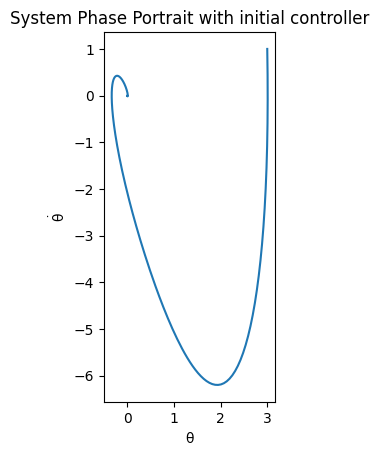

In [4]:
# 初始化动力学模型，准备收集数据
params={'m': 2,'L': 1, 'b': 0.1}
controller_params = {'K':np.array([[35, 8]])}

p1 = InvertedPendulum(system_params = params,
                      controller_params = controller_params,
                      dt = 0.01, 
                      controller_period = 0.01)

# p1.linearize_and_compute_LQR()

# Preview of ROLLOUT

x_initial = torch.tensor([[3],[1]]).to(device)
step_num = 4000
sim_data_ = p1.simulate_rk4(x_initial, step_num, 1,)
p1.convergence_judgment(sim_data_)
p1.plot_phase_portrait(data_sim = sim_data_,
                       arrow_on = False,
                       title = 'System Phase Portrait with initial controller')

d1 = DlearningProcess(system=p1,
                      actor_bound=5.0,
                      n_hiddens_policy=16,
                      n_hiddens_lyapunov=16,
                      n_hiddens_dfunction=32,
                      actor_lr=0.001,
                      lyapunov_lr=0.004,
                      dfunction_lr=0.001)


---------------------Sampling Training Data---------------------


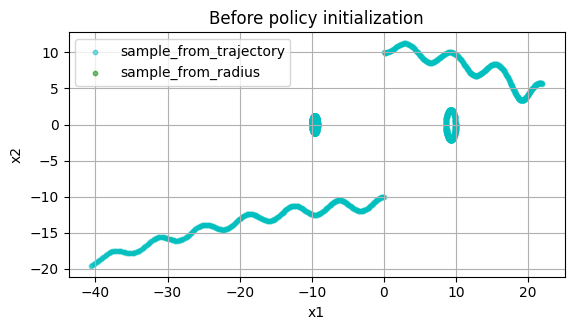

---------------------Initializing Policy------------------------
Epoch [1000/10000], Loss: 0.0271458887
Epoch [2000/10000], Loss: 0.0121964095
Epoch [3000/10000], Loss: 0.0068302536
Epoch [4000/10000], Loss: 0.0048160688
Epoch [5000/10000], Loss: 0.0037555587
Epoch [6000/10000], Loss: 0.0031800889
Epoch [7000/10000], Loss: 0.0028523637
Epoch [8000/10000], Loss: 0.0026235913
Epoch [9000/10000], Loss: 0.0024648288
Epoch [10000/10000], Loss: 0.0023360553
-----------------It takes 233 steps to converge.------------------


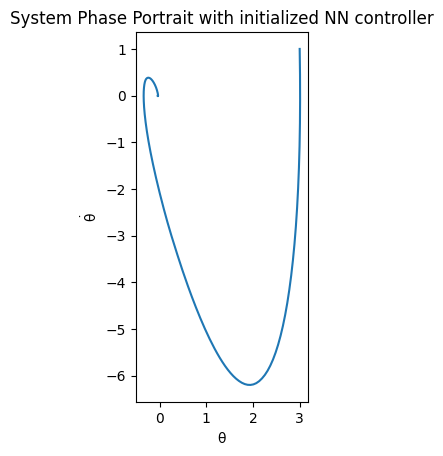

---------------------Sampling Training Data---------------------


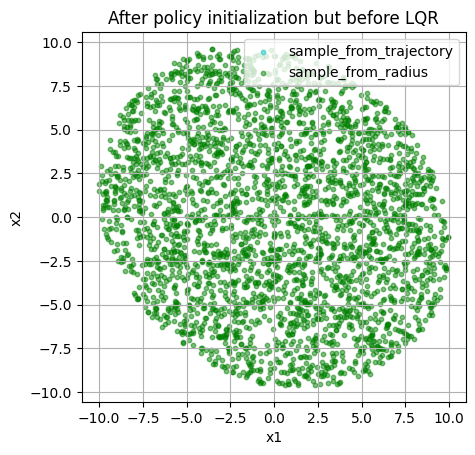

In [5]:
_ = d1.sample_training_data(sample_trajectory_number = 4,
                            sample_number_per_trajectory = 300,
                            sample_radius = 10,
                            sample_number_in_radius = 0,
                            invariant_sample = 1,
                            sample_plot = 1,
                            the_controller = d1.actor.Controller,
                            title='Before policy initialization')


d1.initialize_policy_net(x_train_lim = 10,
                         x_test_lim = 13,
                         sample_num = 1000,
                         iteration = 10**4,
                         lr = 1e-3)


x_initial = torch.tensor([[3],[1]]).to(device)
step_num = 4000
sim_data_ = p1.simulate_rk4(x_initial = x_initial, 
                           step_number = step_num,
                           use_controller = 1,
                           the_controller = d1.actor.Controller)
stepconverge_initial = p1.convergence_judgment(sim_data_)
p1.plot_phase_portrait(data_sim = sim_data_,
                       arrow_on = False,
                       title = 'System Phase Portrait with initialized NN controller')

# sim_data = d1.sample_training_data(32,400,1,0,1,1,None,'linear controller')
sim_data = d1.sample_training_data(sample_trajectory_number = 0,
                                   sample_number_per_trajectory = 0,
                                   sample_radius = 10,
                                   sample_number_in_radius = 3000,
                                   invariant_sample = 1,
                                   sample_plot = 1,
                                   the_controller = d1.actor.Controller,
                                   title = 'After policy initialization but before LQR')


第1次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 2.1841132641
Epoch [2000/10000], Loss: 2.0730178356
Epoch [3000/10000], Loss: 2.0442082882
Epoch [4000/10000], Loss: 2.0251374245
Epoch [5000/10000], Loss: 2.0075640678
Epoch [6000/10000], Loss: 1.9892352819
Epoch [7000/10000], Loss: 1.9746941328
Epoch [8000/10000], Loss: 1.9635643959
Epoch [9000/10000], Loss: 1.9549109936
Epoch [10000/10000], Loss: 1.9414130449


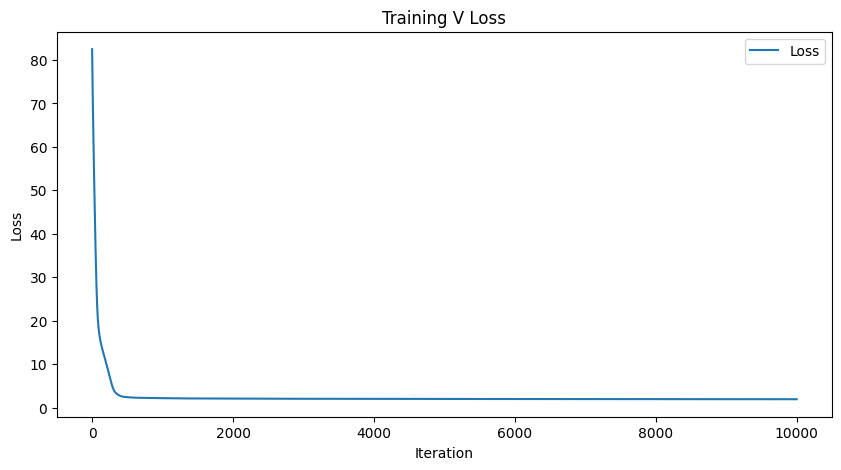

-----------------------Plotting Lyapunov-----------------------


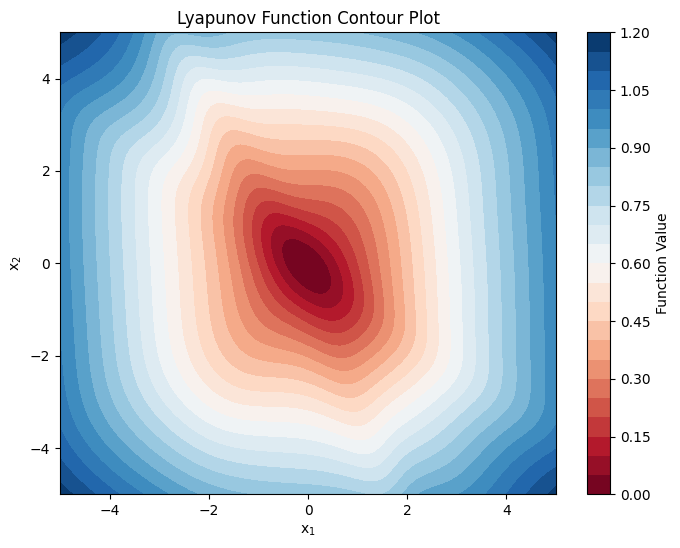

L0:tensor([0.0023], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):1985.407958984375
--------------------------Learning D--------------------------
torch.Size([3000, 2])
Epoch [1000/10000], Loss: 12.2190589905
Epoch [2000/10000], Loss: 9.9127111435
Epoch [3000/10000], Loss: 8.0069913864
Epoch [4000/10000], Loss: 7.0097007751
Epoch [5000/10000], Loss: 6.9715266228
Epoch [6000/10000], Loss: 6.0941781998
Epoch [7000/10000], Loss: 5.6901416779
Epoch [8000/10000], Loss: 5.4419450760
Epoch [9000/10000], Loss: 5.2528114319
Epoch [10000/10000], Loss: 4.8428249359


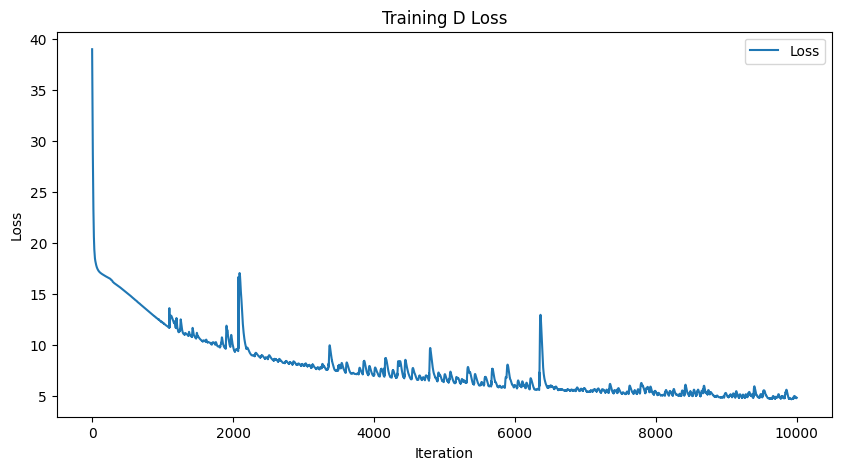

-----------------------Plotting Lyapunov-----------------------


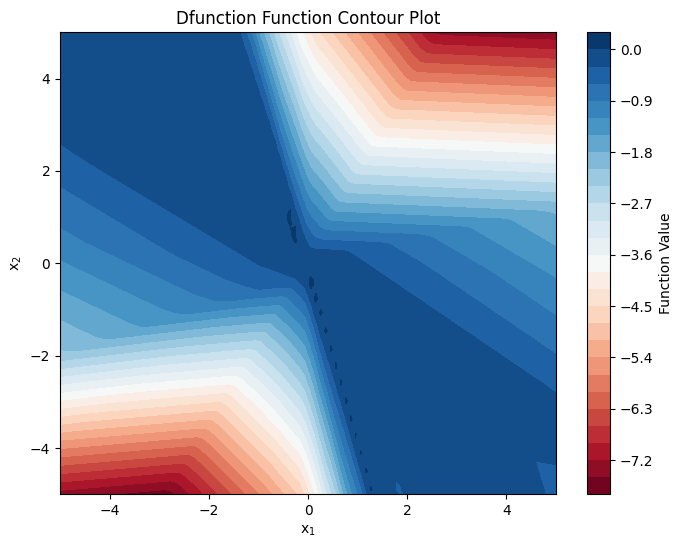

torch.sum(loss_fn(dL, DV_ext)):4.345388412475586, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0104], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


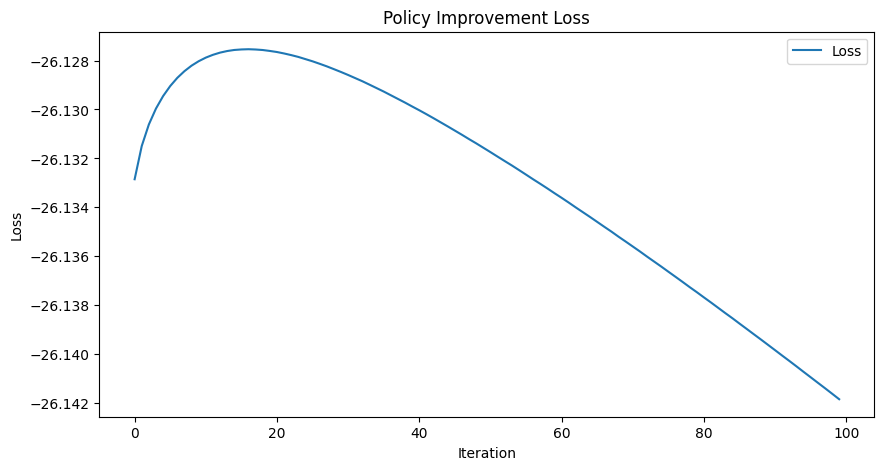

---------------------Sampling Training Data---------------------


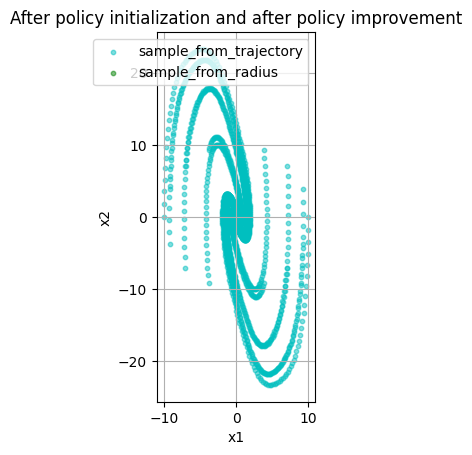

-----------------It takes 233 steps to converge.------------------


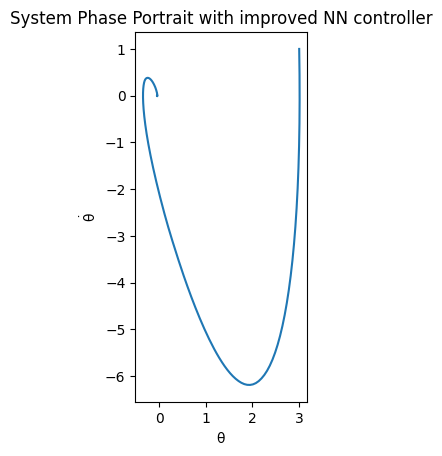

第2次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 28.0205783844
Epoch [2000/10000], Loss: 13.6083536148
Epoch [3000/10000], Loss: 7.7479476929
Epoch [4000/10000], Loss: 4.4762811661
Epoch [5000/10000], Loss: 2.7591109276
Epoch [6000/10000], Loss: 2.0260069370
Epoch [7000/10000], Loss: 1.7473620176
Epoch [8000/10000], Loss: 1.6162321568
Epoch [9000/10000], Loss: 1.5343637466
Epoch [10000/10000], Loss: 1.4795867205


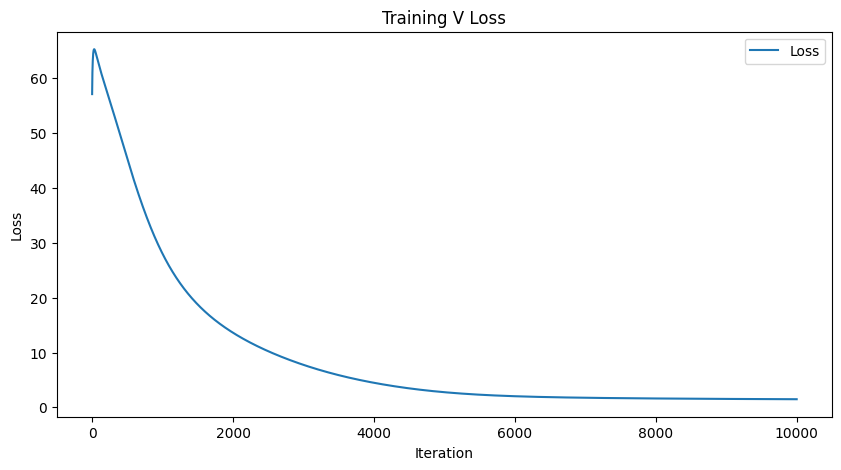

-----------------------Plotting Lyapunov-----------------------


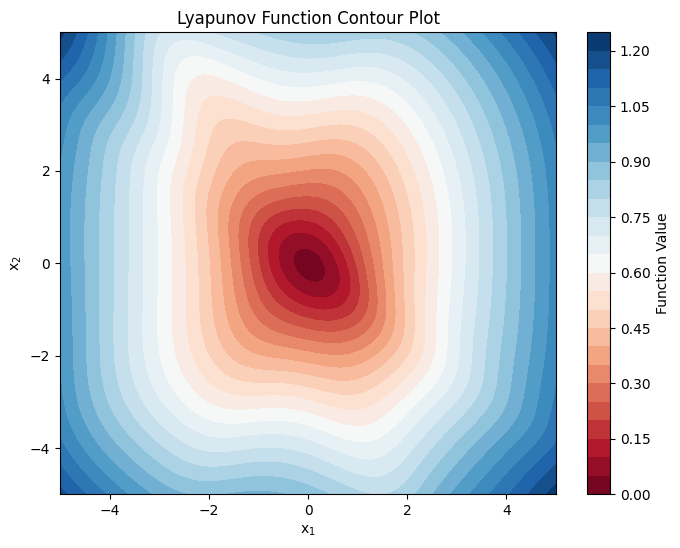

L0:tensor([0.0287], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):2065.19921875
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 4.1217122078
Epoch [2000/10000], Loss: 3.8616712093
Epoch [3000/10000], Loss: 3.7926459312
Epoch [4000/10000], Loss: 3.7582588196
Epoch [5000/10000], Loss: 4.3045887947
Epoch [6000/10000], Loss: 3.9413437843
Epoch [7000/10000], Loss: 4.0964722633
Epoch [8000/10000], Loss: 4.0951857567
Epoch [9000/10000], Loss: 3.6204798222
Epoch [10000/10000], Loss: 3.6917243004


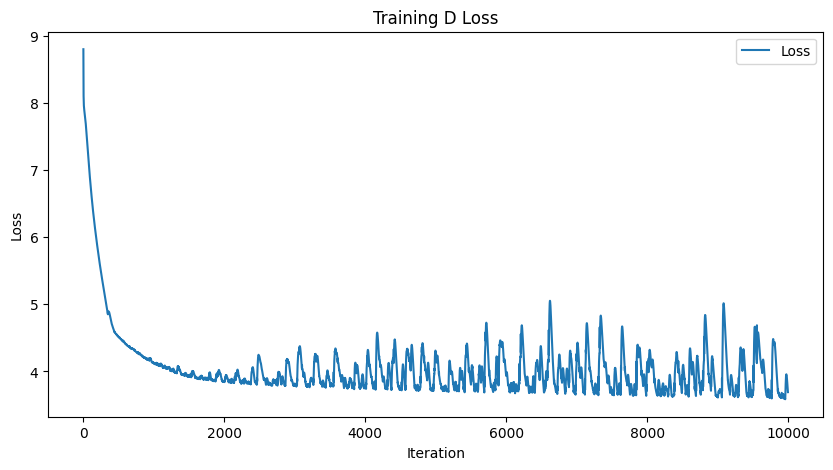

-----------------------Plotting Lyapunov-----------------------


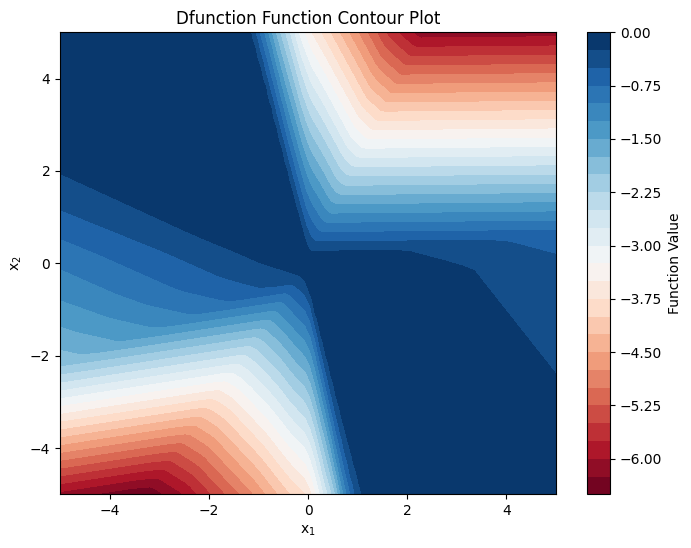

torch.sum(loss_fn(dL, DV_ext)):3.2426023483276367, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0105], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


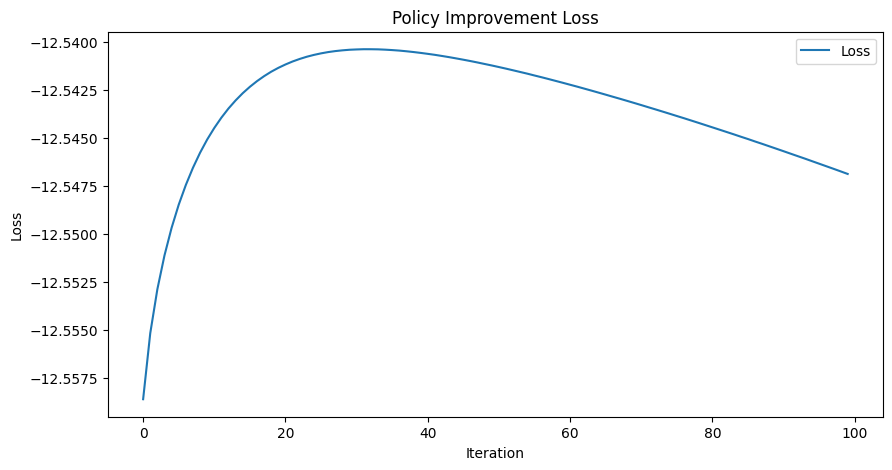

---------------------Sampling Training Data---------------------


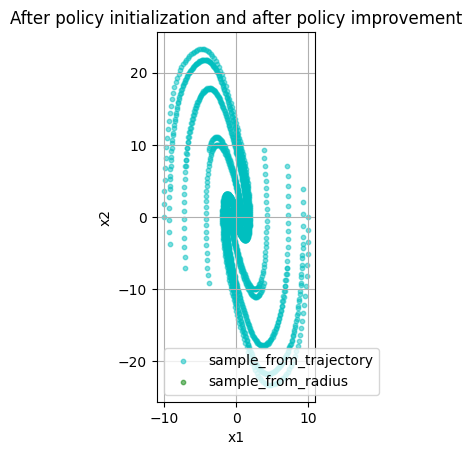

-----------------It takes 233 steps to converge.------------------


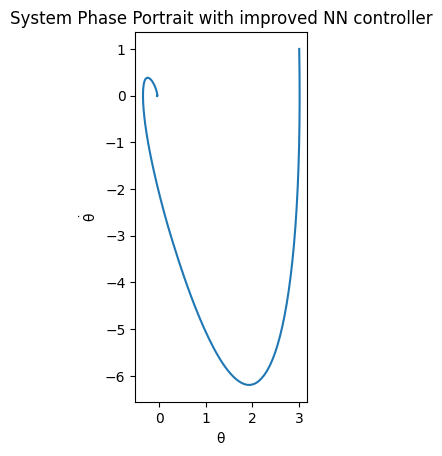

第3次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.7249031067
Epoch [2000/10000], Loss: 1.5535924435
Epoch [3000/10000], Loss: 1.4882634878
Epoch [4000/10000], Loss: 1.4644745588
Epoch [5000/10000], Loss: 1.4499521255
Epoch [6000/10000], Loss: 1.4344816208
Epoch [7000/10000], Loss: 1.4150117636
Epoch [8000/10000], Loss: 1.3931733370
Epoch [9000/10000], Loss: 1.3735134602
Epoch [10000/10000], Loss: 1.3592487574


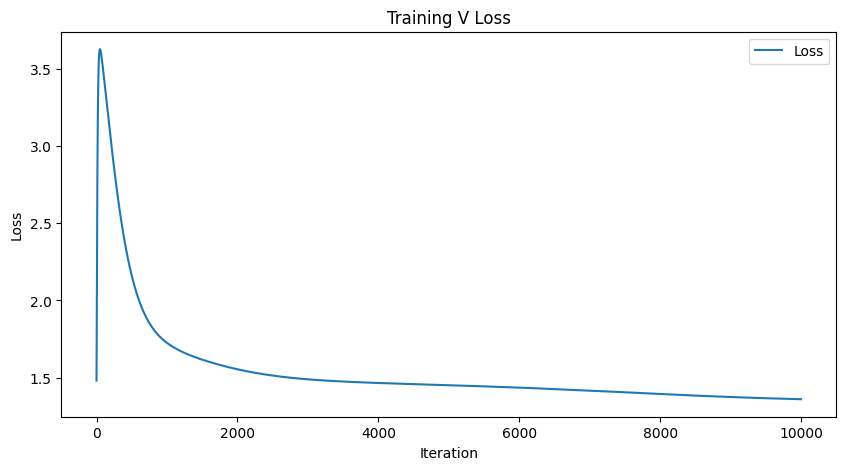

-----------------------Plotting Lyapunov-----------------------


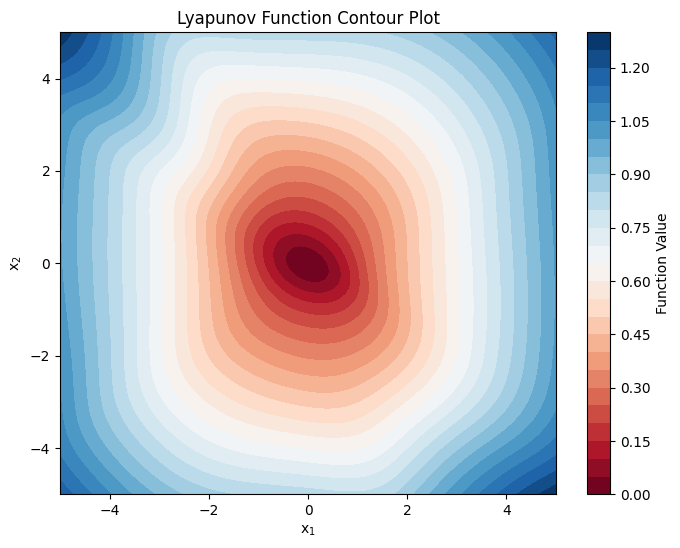

L0:tensor([0.0104], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):2055.474853515625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.9596769810
Epoch [2000/10000], Loss: 3.6424493790
Epoch [3000/10000], Loss: 3.3622937202
Epoch [4000/10000], Loss: 3.3914773464
Epoch [5000/10000], Loss: 3.4253766537
Epoch [6000/10000], Loss: 3.5028975010
Epoch [7000/10000], Loss: 4.3965735435
Epoch [8000/10000], Loss: 3.4469895363
Epoch [9000/10000], Loss: 3.5890007019
Epoch [10000/10000], Loss: 4.0298395157


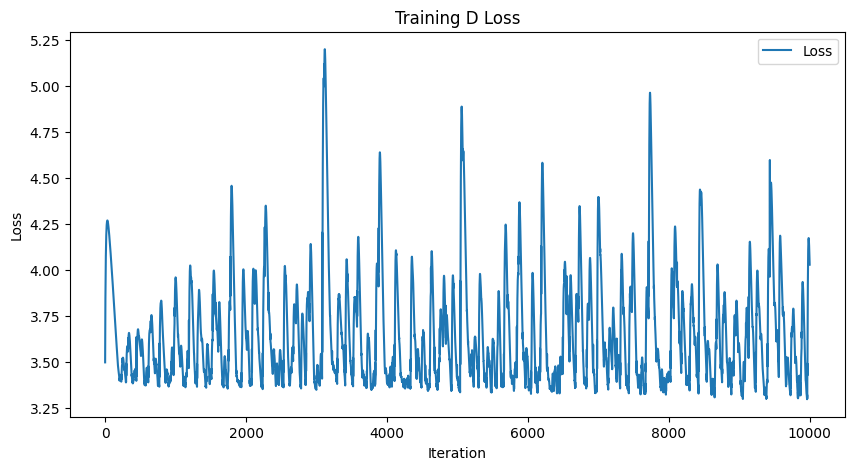

-----------------------Plotting Lyapunov-----------------------


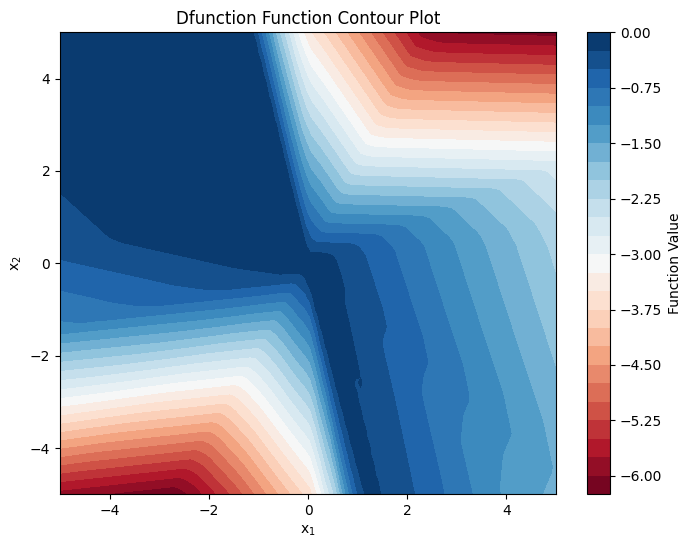

torch.sum(loss_fn(dL, DV_ext)):3.628812074661255, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0207], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


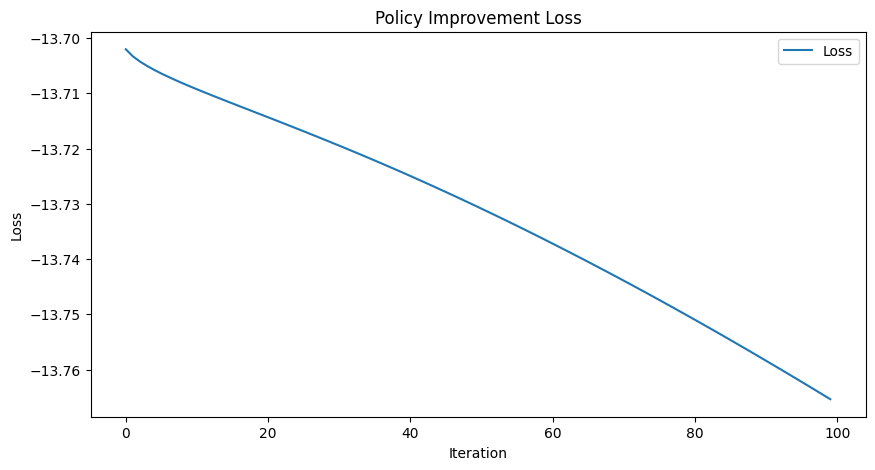

---------------------Sampling Training Data---------------------


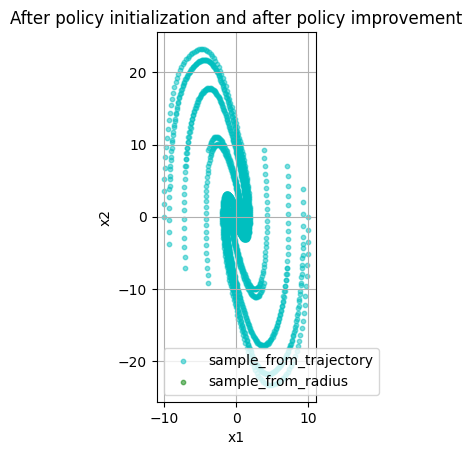

-----------------It takes 233 steps to converge.------------------


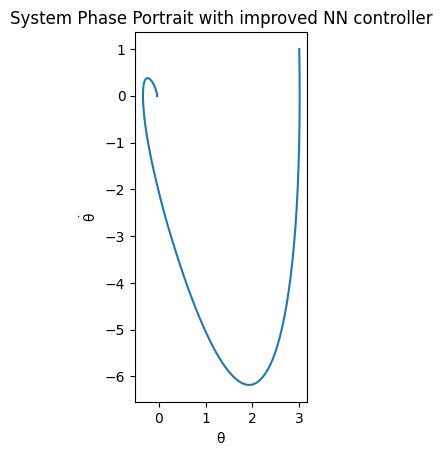

第4次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.6350380182
Epoch [2000/10000], Loss: 1.4465183020
Epoch [3000/10000], Loss: 1.3819034100
Epoch [4000/10000], Loss: 1.3627177477
Epoch [5000/10000], Loss: 1.3555718660
Epoch [6000/10000], Loss: 1.3529431820
Epoch [7000/10000], Loss: 1.3512176275
Epoch [8000/10000], Loss: 1.3492673635
Epoch [9000/10000], Loss: 1.3463665247
Epoch [10000/10000], Loss: 1.3418287039


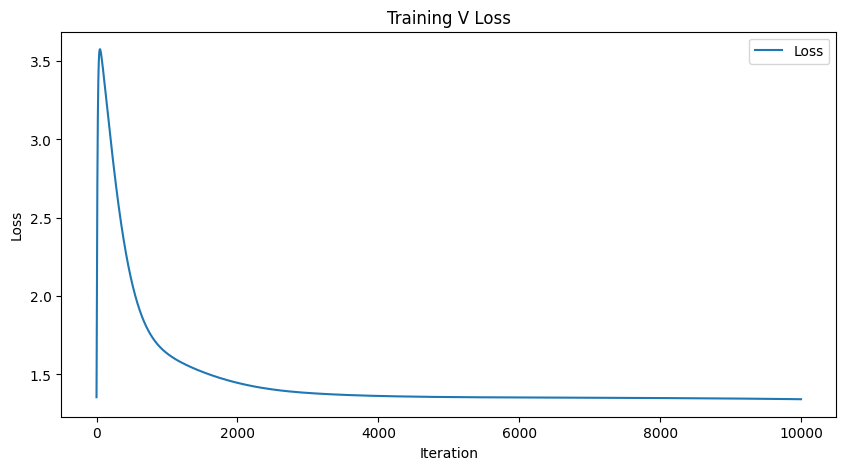

-----------------------Plotting Lyapunov-----------------------


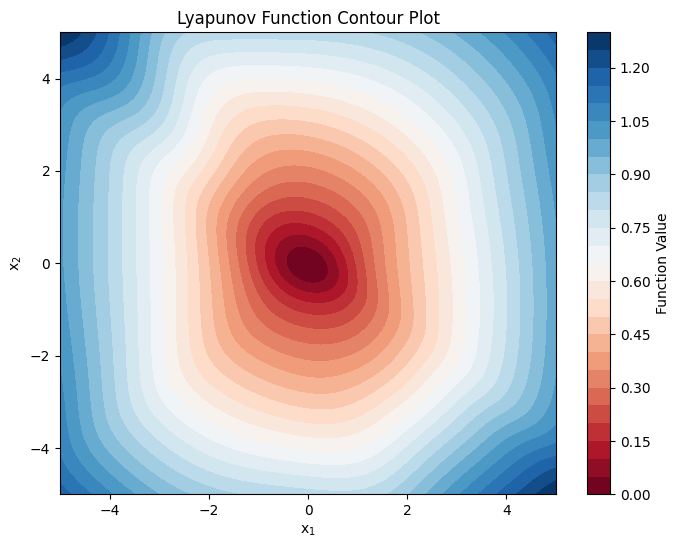

L0:tensor([0.0069], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):2037.03955078125
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.3775289059
Epoch [2000/10000], Loss: 3.7219815254
Epoch [3000/10000], Loss: 3.4817626476
Epoch [4000/10000], Loss: 3.6171009541
Epoch [5000/10000], Loss: 3.3798358440
Epoch [6000/10000], Loss: 3.8072736263
Epoch [7000/10000], Loss: 3.4051196575
Epoch [8000/10000], Loss: 4.0053386688
Epoch [9000/10000], Loss: 4.0112113953
Epoch [10000/10000], Loss: 4.0085940361


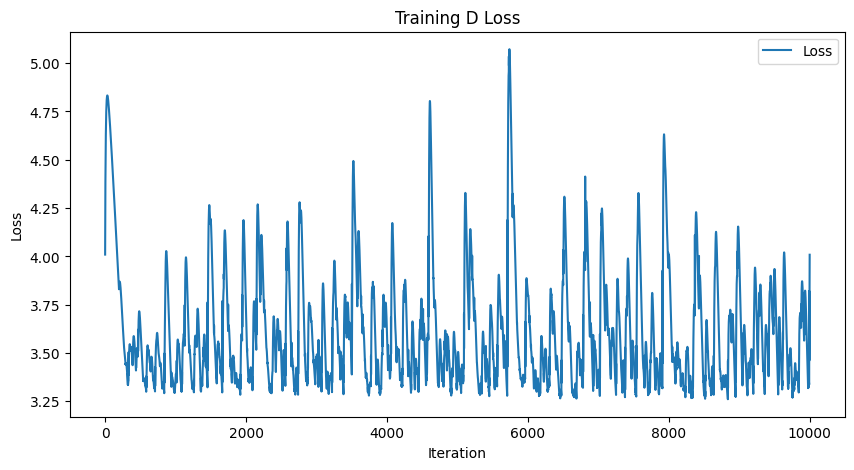

-----------------------Plotting Lyapunov-----------------------


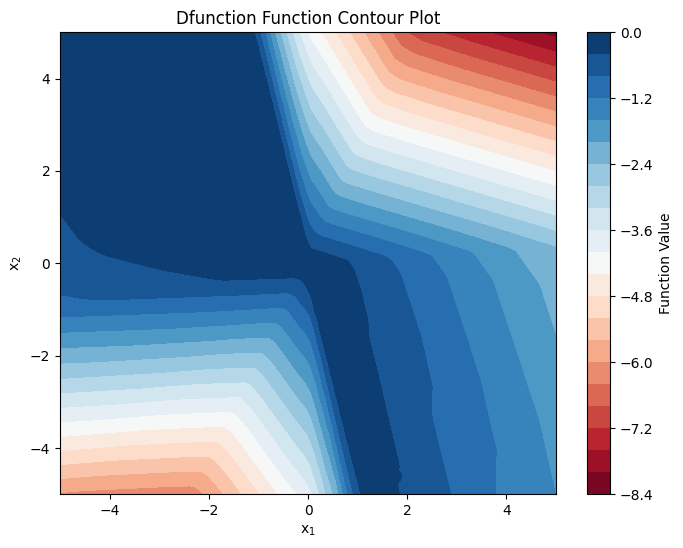

torch.sum(loss_fn(dL, DV_ext)):3.6425797939300537, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0164], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


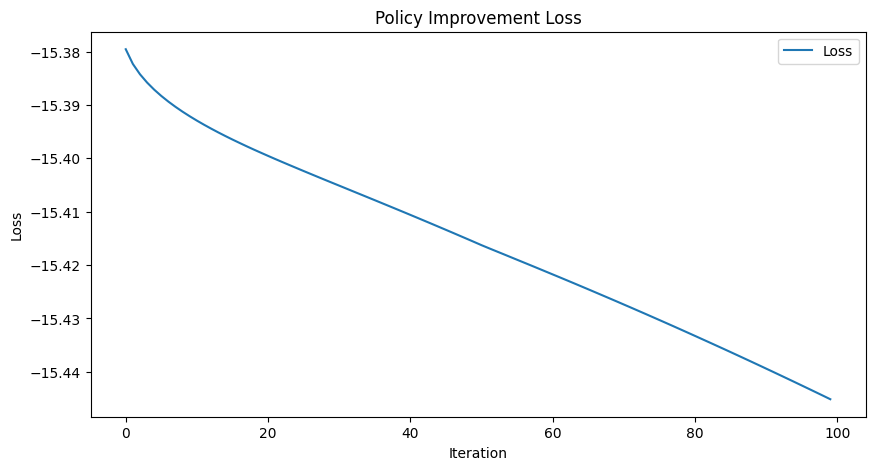

---------------------Sampling Training Data---------------------


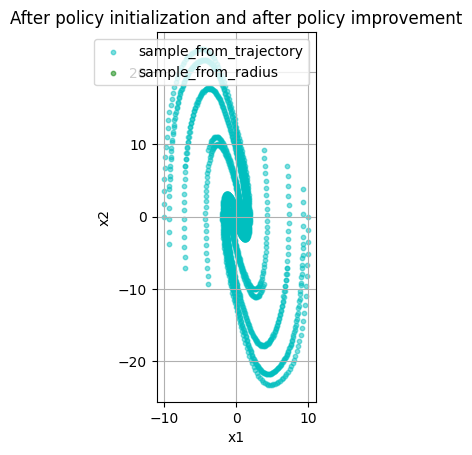

-----------------It takes 232 steps to converge.------------------


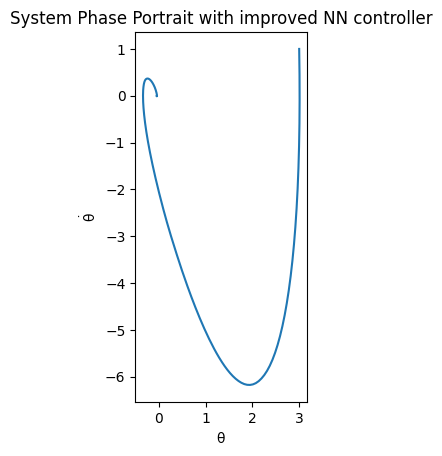

第5次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.6105997562
Epoch [2000/10000], Loss: 1.4408774376
Epoch [3000/10000], Loss: 1.3686151505
Epoch [4000/10000], Loss: 1.3461247683
Epoch [5000/10000], Loss: 1.3402912617
Epoch [6000/10000], Loss: 1.3380613327
Epoch [7000/10000], Loss: 1.3366774321
Epoch [8000/10000], Loss: 1.3352830410
Epoch [9000/10000], Loss: 1.3336067200
Epoch [10000/10000], Loss: 1.3313328028


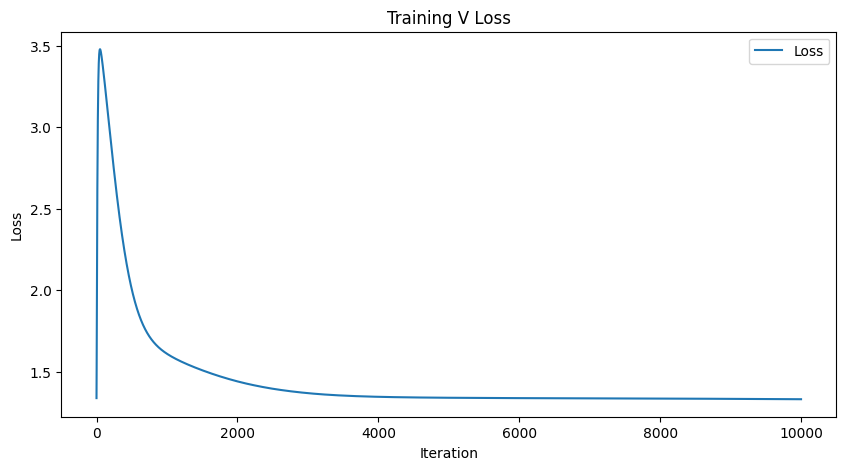

-----------------------Plotting Lyapunov-----------------------


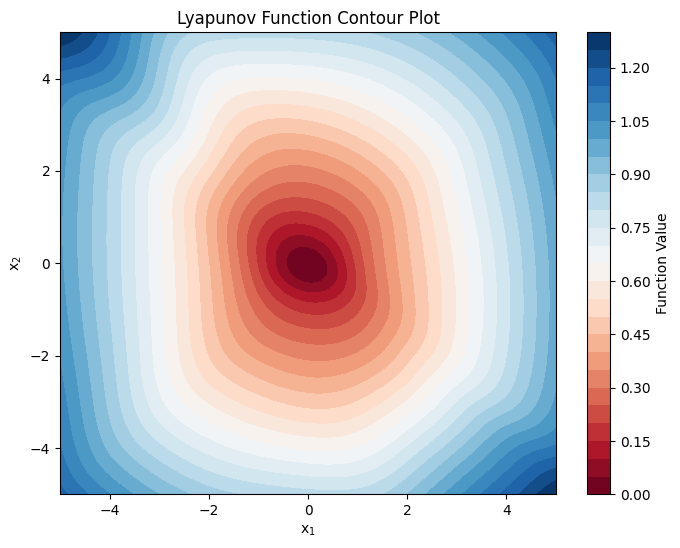

L0:tensor([0.0034], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):2024.781494140625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.2615718842
Epoch [2000/10000], Loss: 3.3005690575
Epoch [3000/10000], Loss: 3.7889606953
Epoch [4000/10000], Loss: 3.3329703808
Epoch [5000/10000], Loss: 3.8184797764
Epoch [6000/10000], Loss: 3.4080495834
Epoch [7000/10000], Loss: 3.5310692787
Epoch [8000/10000], Loss: 3.3765745163
Epoch [9000/10000], Loss: 3.3058447838
Epoch [10000/10000], Loss: 3.5004420280


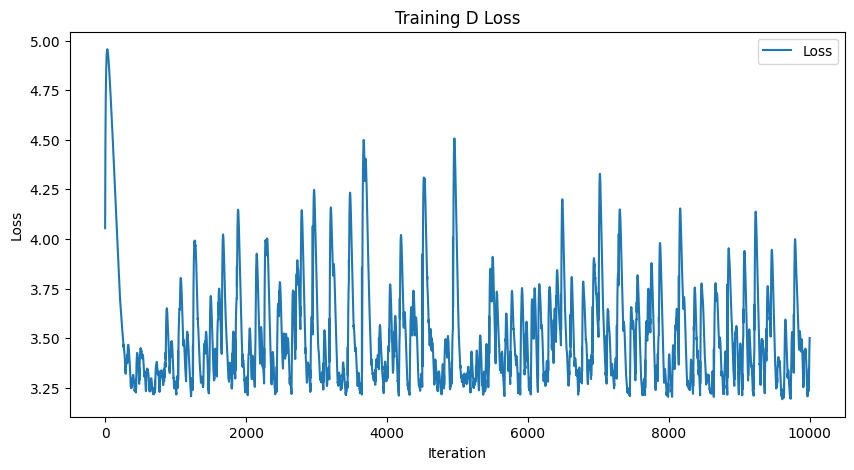

-----------------------Plotting Lyapunov-----------------------


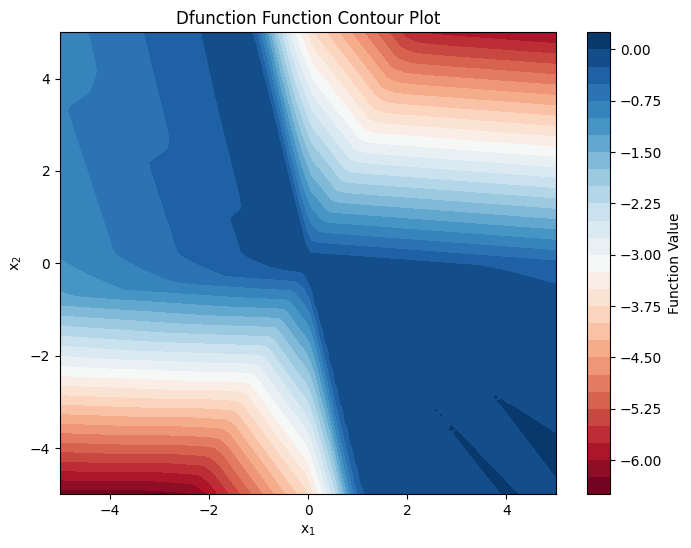

torch.sum(loss_fn(dL, DV_ext)):3.1588385105133057, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0075], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


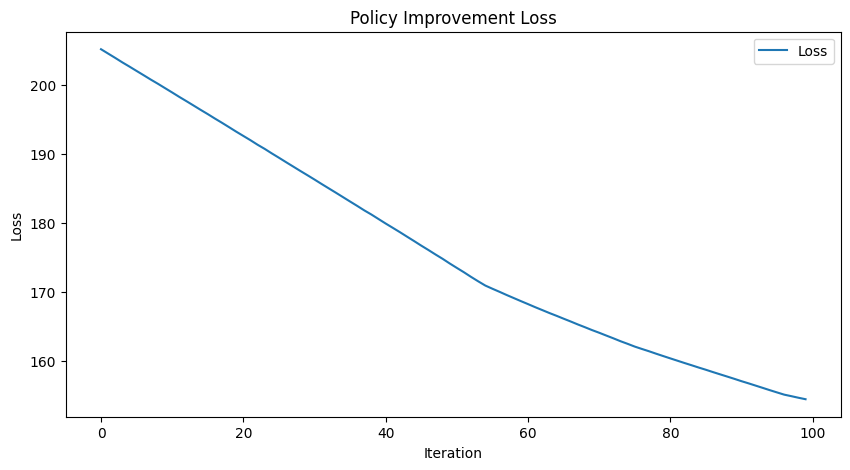

---------------------Sampling Training Data---------------------


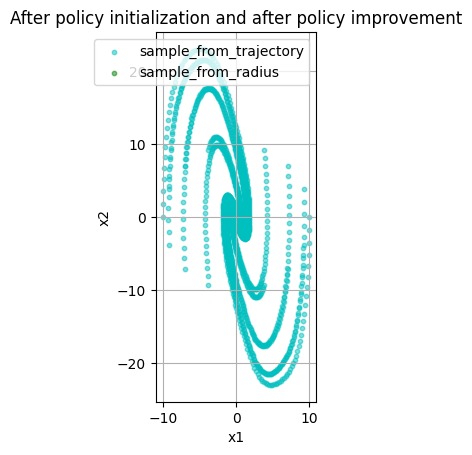

-----------------It takes 231 steps to converge.------------------


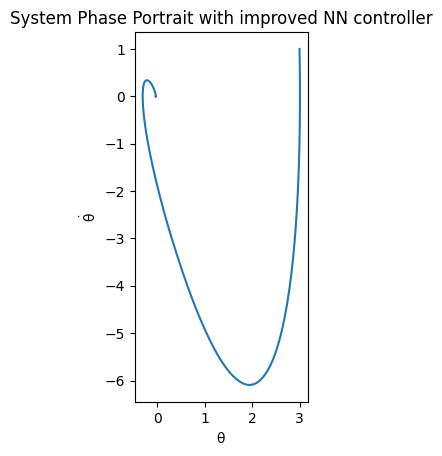

第6次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5924947262
Epoch [2000/10000], Loss: 1.4155603647
Epoch [3000/10000], Loss: 1.3451677561
Epoch [4000/10000], Loss: 1.3231415749
Epoch [5000/10000], Loss: 1.3175518513
Epoch [6000/10000], Loss: 1.3155026436
Epoch [7000/10000], Loss: 1.3142431974
Epoch [8000/10000], Loss: 1.3132727146
Epoch [9000/10000], Loss: 1.3120589256
Epoch [10000/10000], Loss: 1.3103935719


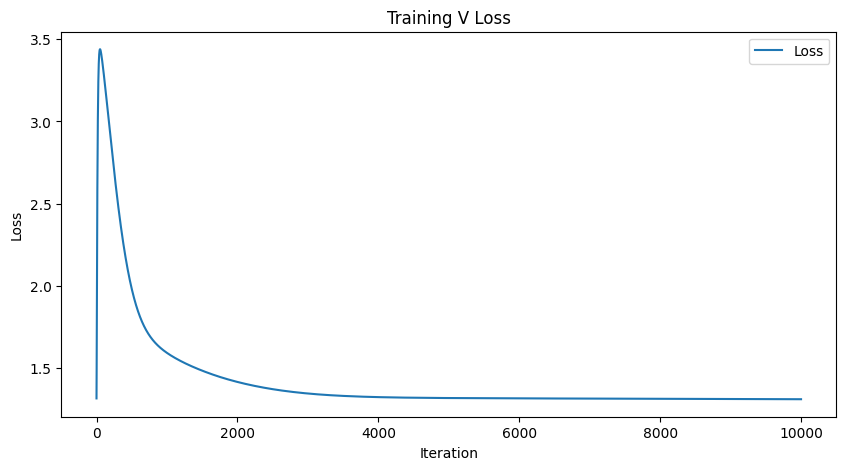

-----------------------Plotting Lyapunov-----------------------


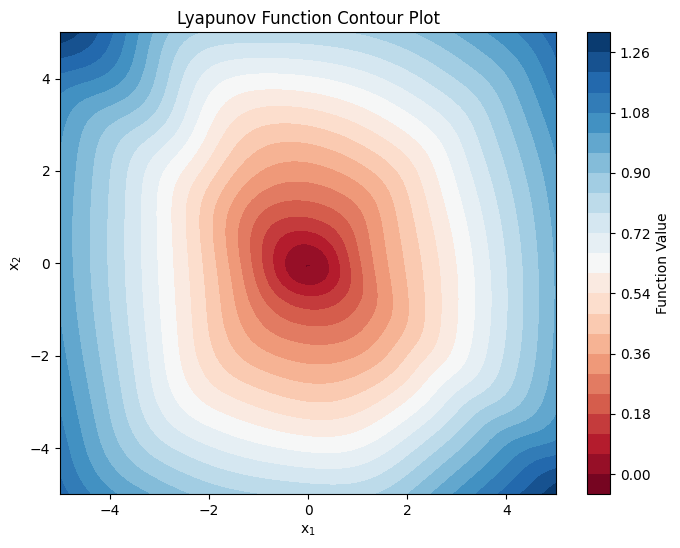

L0:tensor([-0.0004], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.0205843448638916, torch.sum(F.relu(dL)):1978.074951171875
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.1834471226
Epoch [2000/10000], Loss: 3.2293303013
Epoch [3000/10000], Loss: 3.1428999901
Epoch [4000/10000], Loss: 3.1322021484
Epoch [5000/10000], Loss: 3.2220280170
Epoch [6000/10000], Loss: 3.1694786549
Epoch [7000/10000], Loss: 3.1302974224
Epoch [8000/10000], Loss: 3.1218996048
Epoch [9000/10000], Loss: 3.2223820686
Epoch [10000/10000], Loss: 3.1169576645


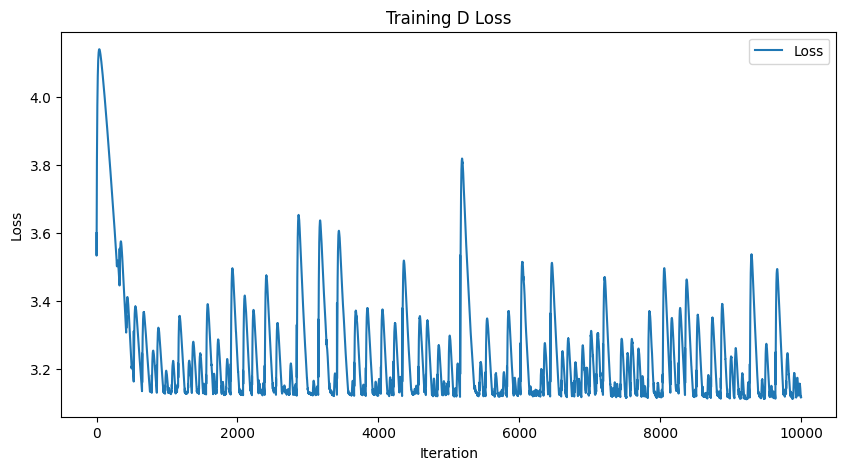

-----------------------Plotting Lyapunov-----------------------


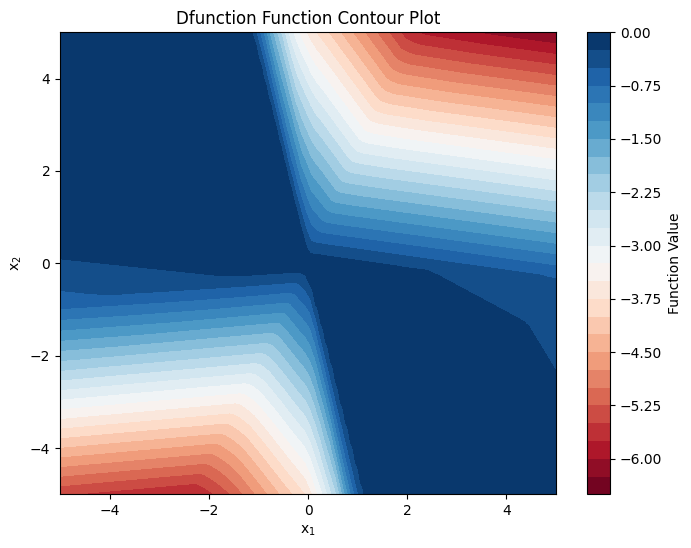

torch.sum(loss_fn(dL, DV_ext)):2.788431406021118, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0114], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


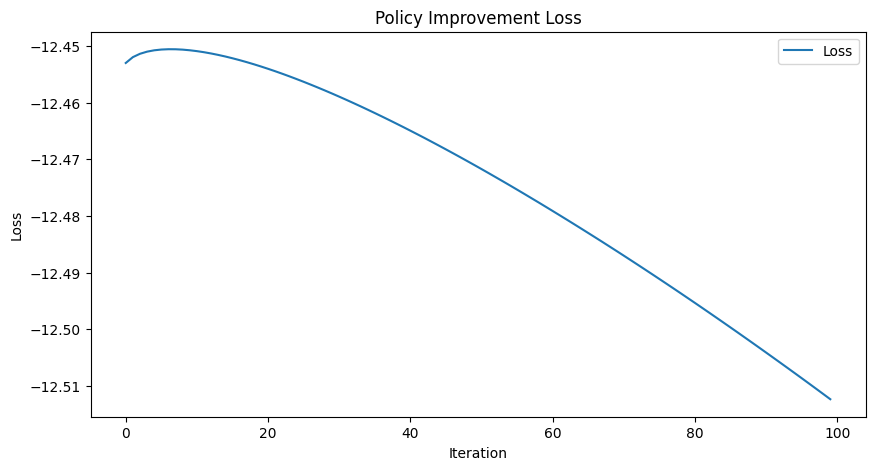

---------------------Sampling Training Data---------------------


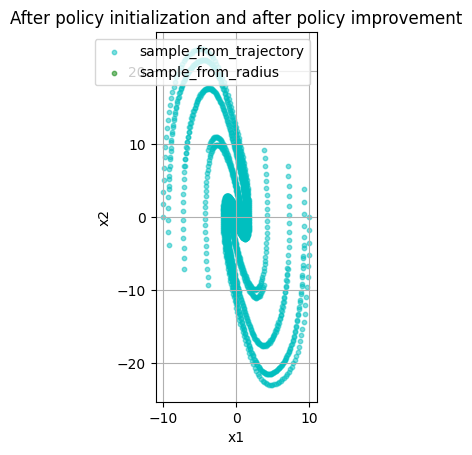

-----------------It takes 230 steps to converge.------------------


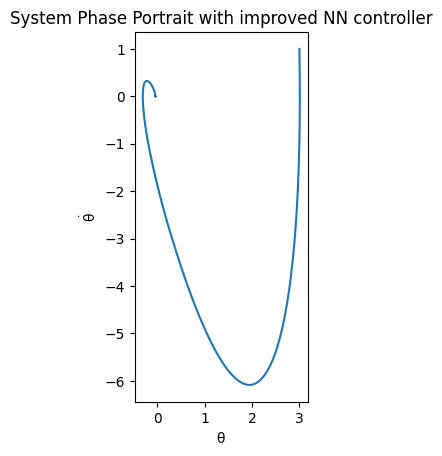

第7次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5814090967
Epoch [2000/10000], Loss: 1.3968493938
Epoch [3000/10000], Loss: 1.3336459398
Epoch [4000/10000], Loss: 1.3139389753
Epoch [5000/10000], Loss: 1.3089207411
Epoch [6000/10000], Loss: 1.3071203232
Epoch [7000/10000], Loss: 1.3060342073
Epoch [8000/10000], Loss: 1.3051259518
Epoch [9000/10000], Loss: 1.3040844202
Epoch [10000/10000], Loss: 1.3026019335


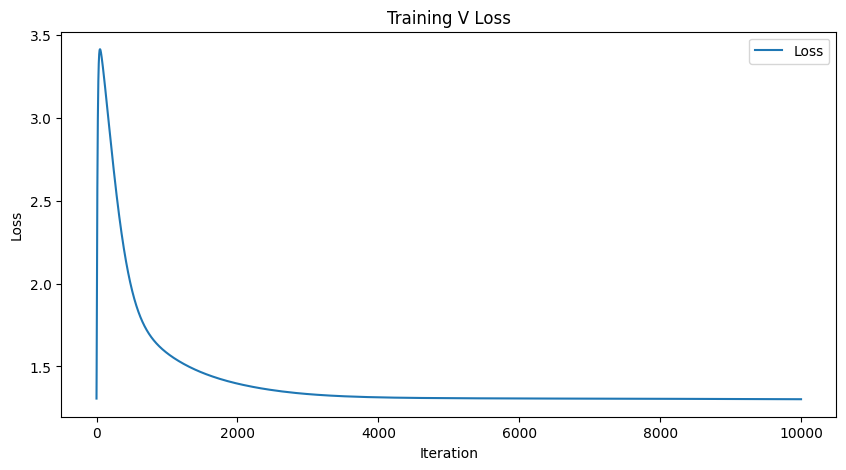

-----------------------Plotting Lyapunov-----------------------


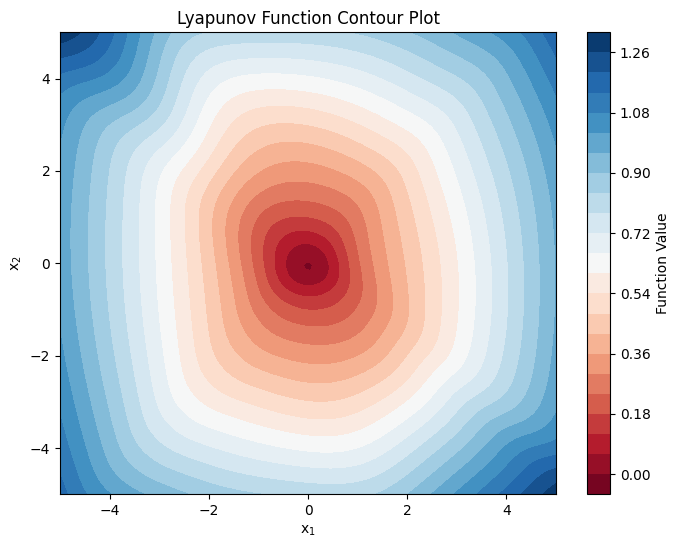

L0:tensor([-0.0026], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.09677422046661377, torch.sum(F.relu(dL)):1961.191162109375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.2866375446
Epoch [2000/10000], Loss: 3.1151926517
Epoch [3000/10000], Loss: 3.4164109230
Epoch [4000/10000], Loss: 3.3080477715
Epoch [5000/10000], Loss: 3.2078413963
Epoch [6000/10000], Loss: 3.2451519966
Epoch [7000/10000], Loss: 3.1379311085
Epoch [8000/10000], Loss: 3.1792247295
Epoch [9000/10000], Loss: 3.0690908432
Epoch [10000/10000], Loss: 3.1485450268


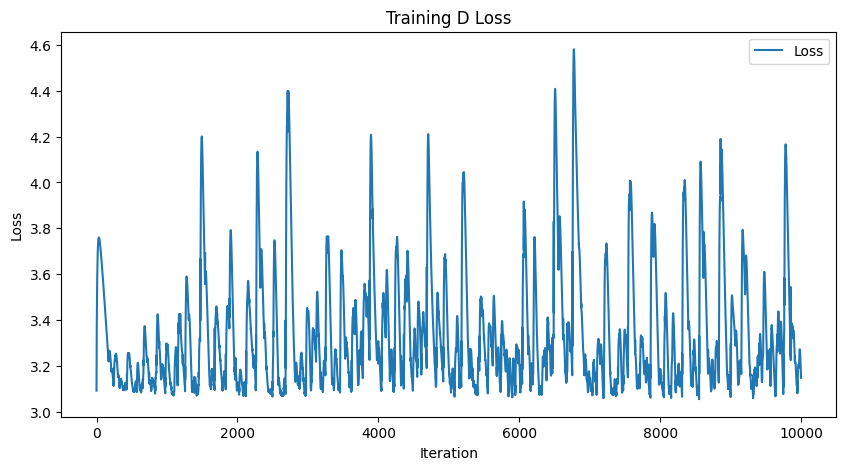

-----------------------Plotting Lyapunov-----------------------


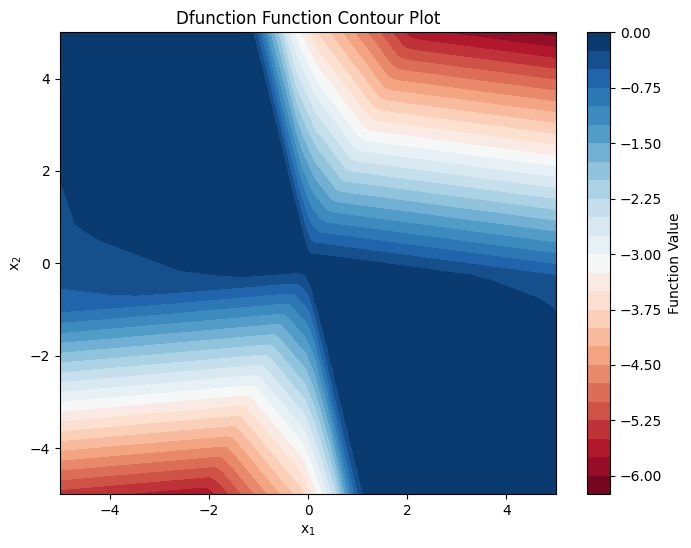

torch.sum(loss_fn(dL, DV_ext)):2.8359313011169434, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0076], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


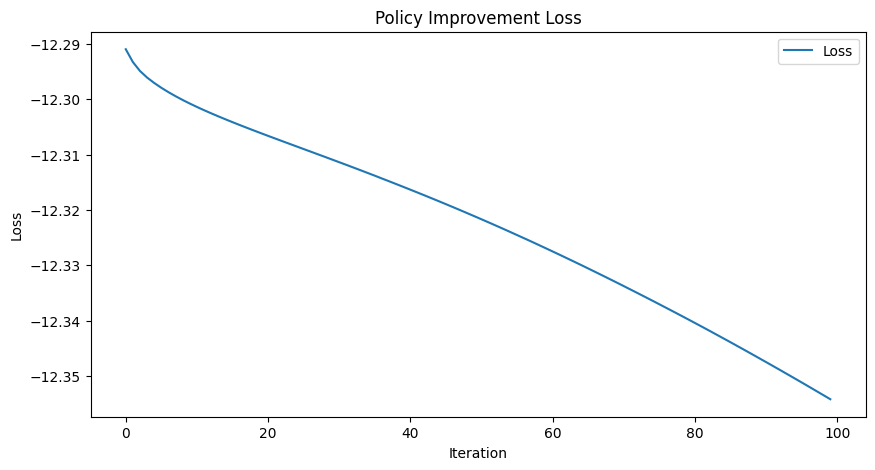

---------------------Sampling Training Data---------------------


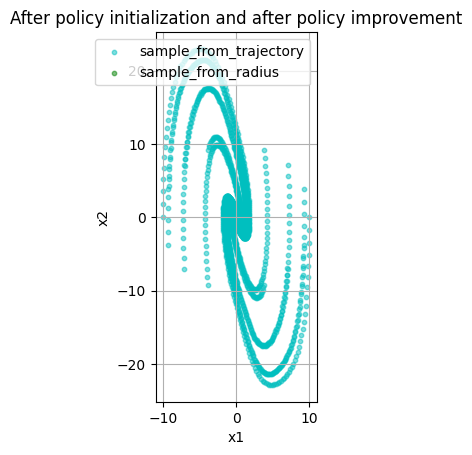

-----------------It takes 229 steps to converge.------------------


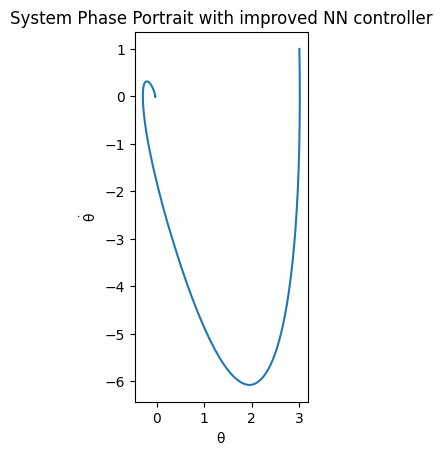

第8次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5853599310
Epoch [2000/10000], Loss: 1.3933570385
Epoch [3000/10000], Loss: 1.3278822899
Epoch [4000/10000], Loss: 1.3071246147
Epoch [5000/10000], Loss: 1.3015112877
Epoch [6000/10000], Loss: 1.2992957830
Epoch [7000/10000], Loss: 1.2982224226
Epoch [8000/10000], Loss: 1.2975006104
Epoch [9000/10000], Loss: 1.2966130972
Epoch [10000/10000], Loss: 1.2953553200


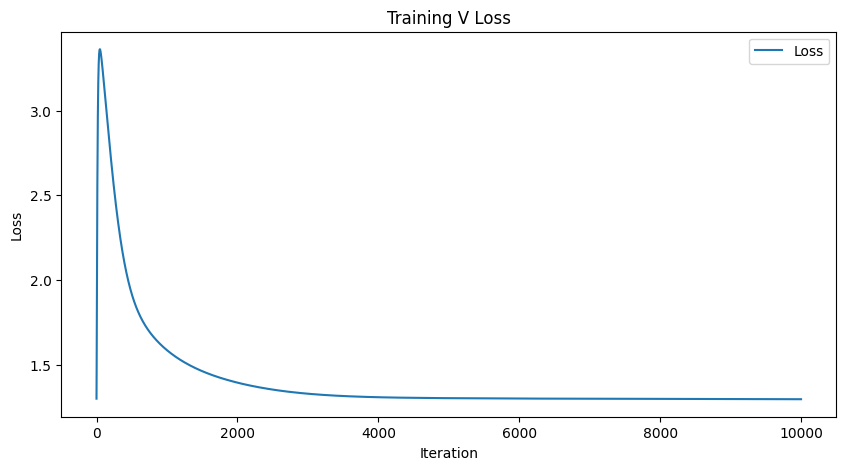

-----------------------Plotting Lyapunov-----------------------


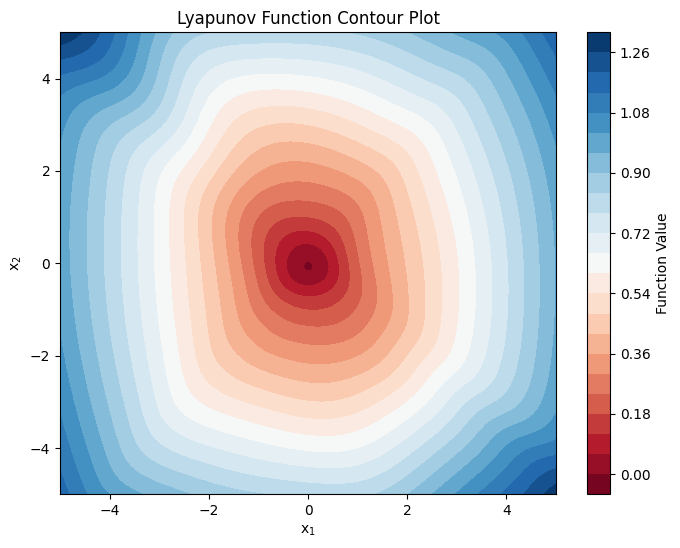

L0:tensor([-0.0034], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.1418238878250122, torch.sum(F.relu(dL)):1943.67138671875
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.2468984127
Epoch [2000/10000], Loss: 3.1117956638
Epoch [3000/10000], Loss: 3.1266059875
Epoch [4000/10000], Loss: 3.0976879597
Epoch [5000/10000], Loss: 3.9796302319
Epoch [6000/10000], Loss: 3.1477348804
Epoch [7000/10000], Loss: 3.1613779068
Epoch [8000/10000], Loss: 3.2938866615
Epoch [9000/10000], Loss: 3.1481864452
Epoch [10000/10000], Loss: 3.0929601192


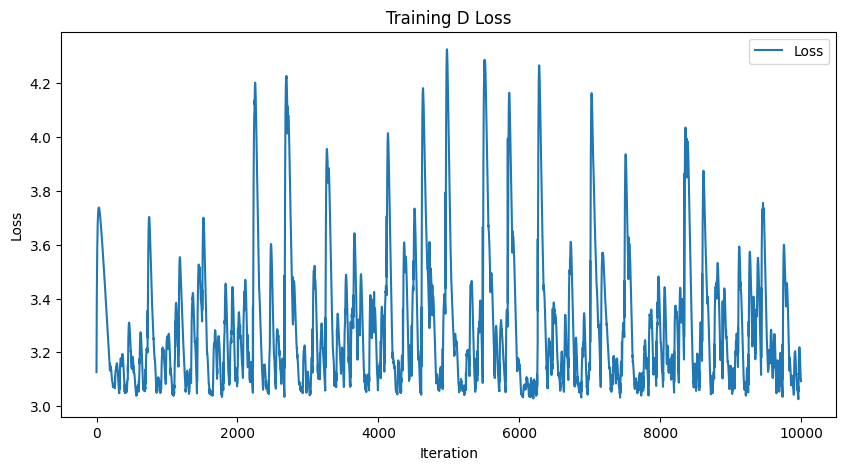

-----------------------Plotting Lyapunov-----------------------


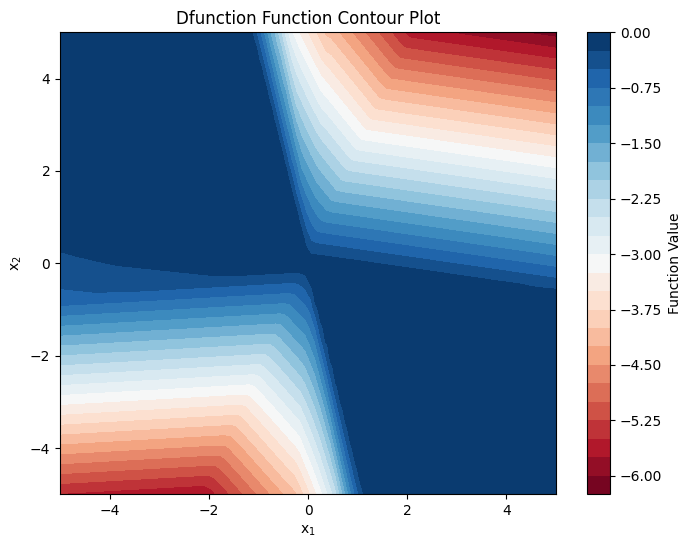

torch.sum(loss_fn(dL, DV_ext)):2.794450044631958, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0069], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


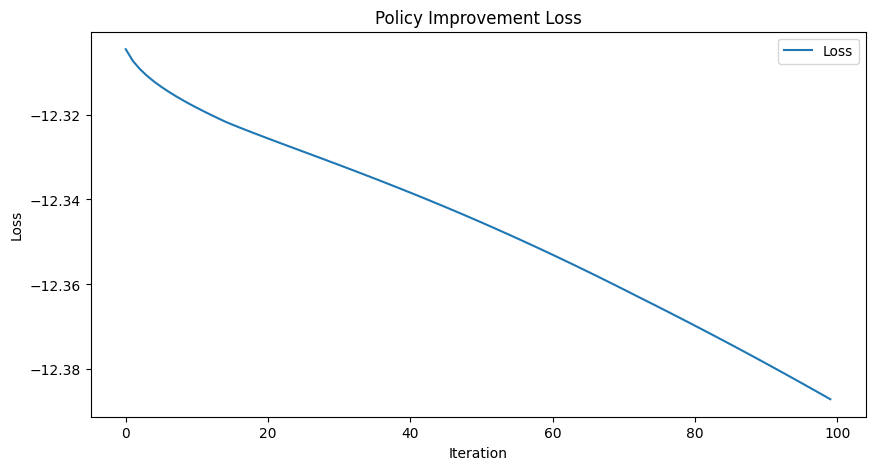

---------------------Sampling Training Data---------------------


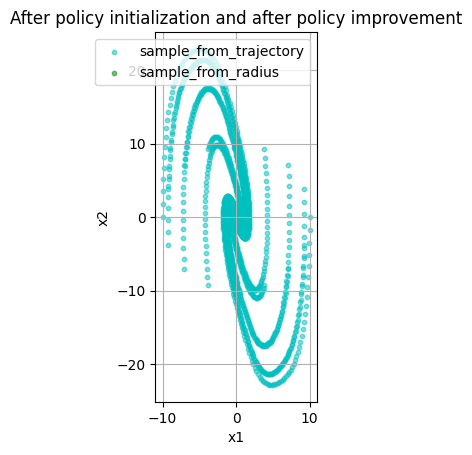

-----------------It takes 229 steps to converge.------------------


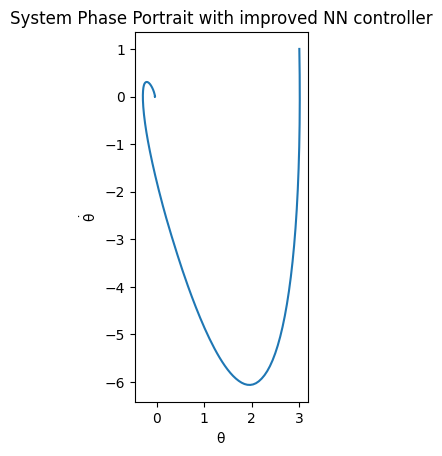

第9次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5744993687
Epoch [2000/10000], Loss: 1.3791745901
Epoch [3000/10000], Loss: 1.3183254004
Epoch [4000/10000], Loss: 1.2985049486
Epoch [5000/10000], Loss: 1.2932602167
Epoch [6000/10000], Loss: 1.2912626266
Epoch [7000/10000], Loss: 1.2903484106
Epoch [8000/10000], Loss: 1.2896697521
Epoch [9000/10000], Loss: 1.2887994051
Epoch [10000/10000], Loss: 1.2875696421


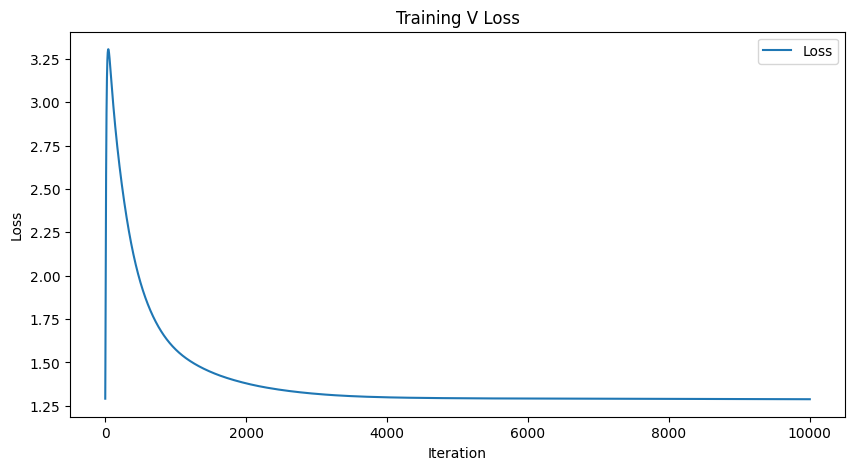

-----------------------Plotting Lyapunov-----------------------


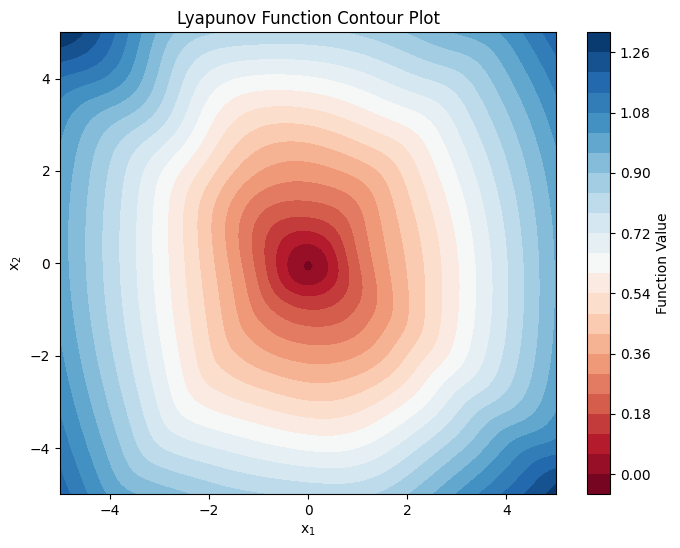

L0:tensor([-0.0041], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.1830836534500122, torch.sum(F.relu(dL)):1925.8414306640625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.1782886982
Epoch [2000/10000], Loss: 3.1305997372
Epoch [3000/10000], Loss: 3.4761645794
Epoch [4000/10000], Loss: 3.1248419285
Epoch [5000/10000], Loss: 3.2295267582
Epoch [6000/10000], Loss: 3.0370137691
Epoch [7000/10000], Loss: 3.6438186169
Epoch [8000/10000], Loss: 3.7316429615
Epoch [9000/10000], Loss: 3.3831660748
Epoch [10000/10000], Loss: 3.0301983356


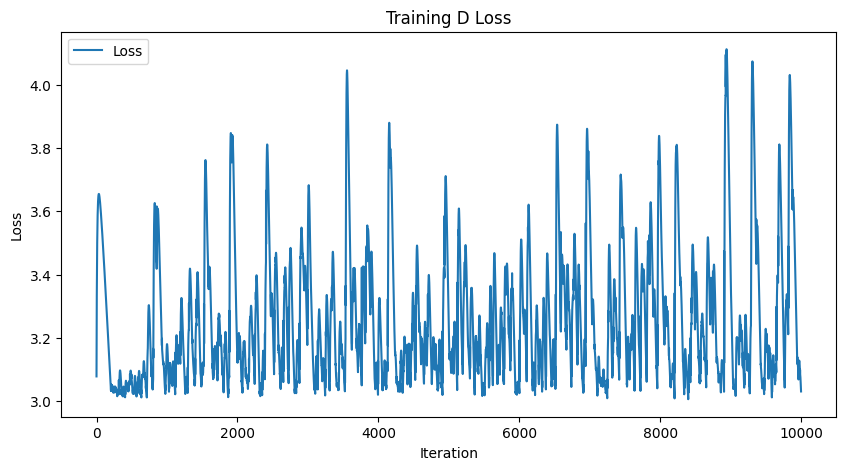

-----------------------Plotting Lyapunov-----------------------


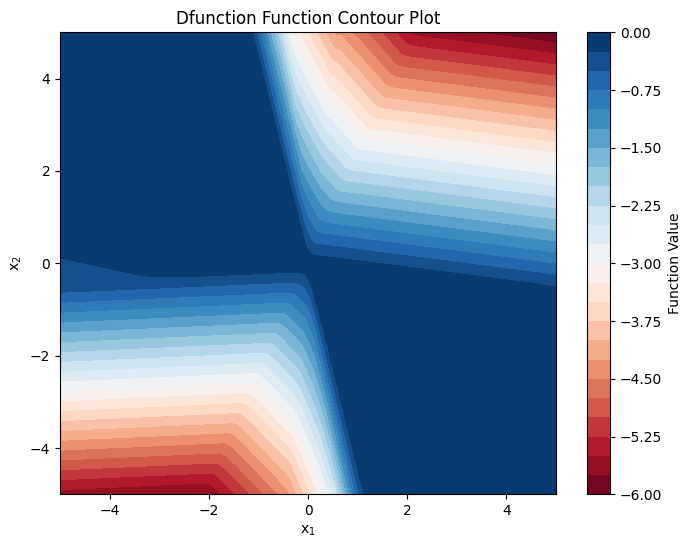

torch.sum(loss_fn(dL, DV_ext)):2.739682197570801, torch.sum(F.relu(DV)):0.0043267011642456055, D0:tensor([-0.0072], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


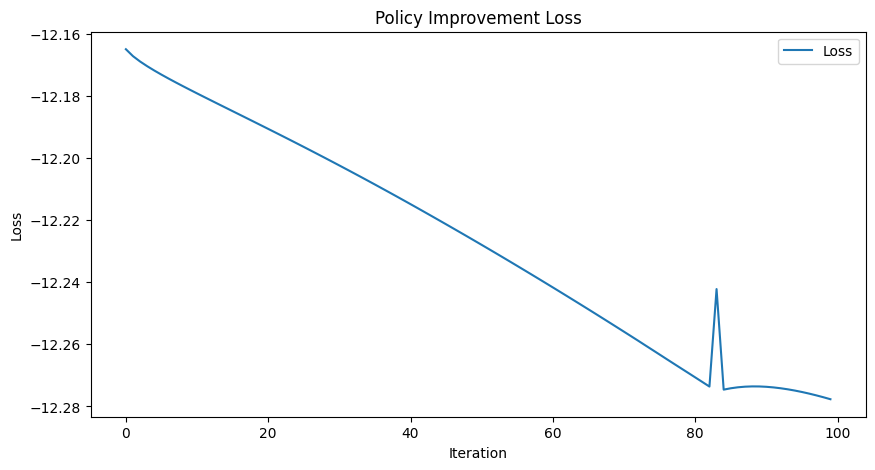

---------------------Sampling Training Data---------------------


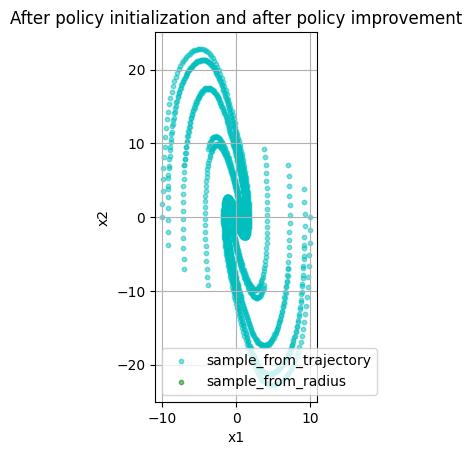

-----------------It takes 227 steps to converge.------------------


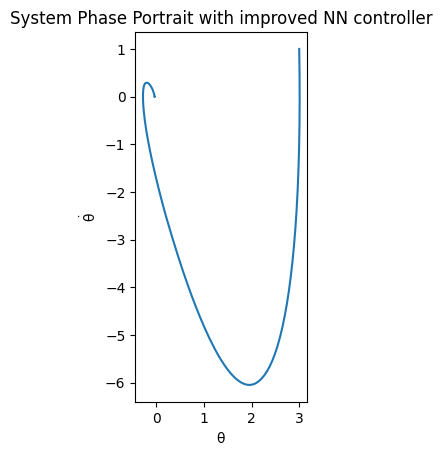

第10次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5639200211
Epoch [2000/10000], Loss: 1.3651114702
Epoch [3000/10000], Loss: 1.3061182499
Epoch [4000/10000], Loss: 1.2891426086
Epoch [5000/10000], Loss: 1.2841068506
Epoch [6000/10000], Loss: 1.2821673155
Epoch [7000/10000], Loss: 1.2813595533
Epoch [8000/10000], Loss: 1.2807006836
Epoch [9000/10000], Loss: 1.2798603773
Epoch [10000/10000], Loss: 1.2787758112


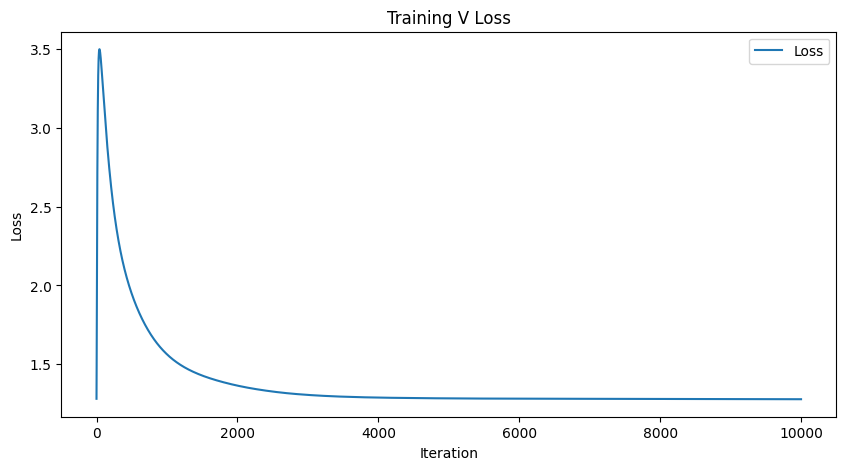

-----------------------Plotting Lyapunov-----------------------


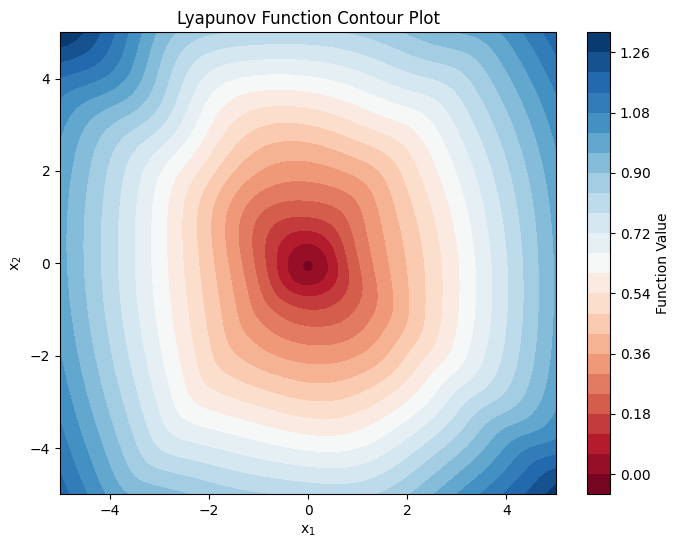

L0:tensor([-0.0056], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.28345227241516113, torch.sum(F.relu(dL)):1905.33837890625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.1113939285
Epoch [2000/10000], Loss: 3.2076864243
Epoch [3000/10000], Loss: 3.0724122524
Epoch [4000/10000], Loss: 3.4854953289
Epoch [5000/10000], Loss: 3.6406364441
Epoch [6000/10000], Loss: 3.6117286682
Epoch [7000/10000], Loss: 3.0146818161
Epoch [8000/10000], Loss: 3.1999278069
Epoch [9000/10000], Loss: 3.2094585896
Epoch [10000/10000], Loss: 3.2333848476


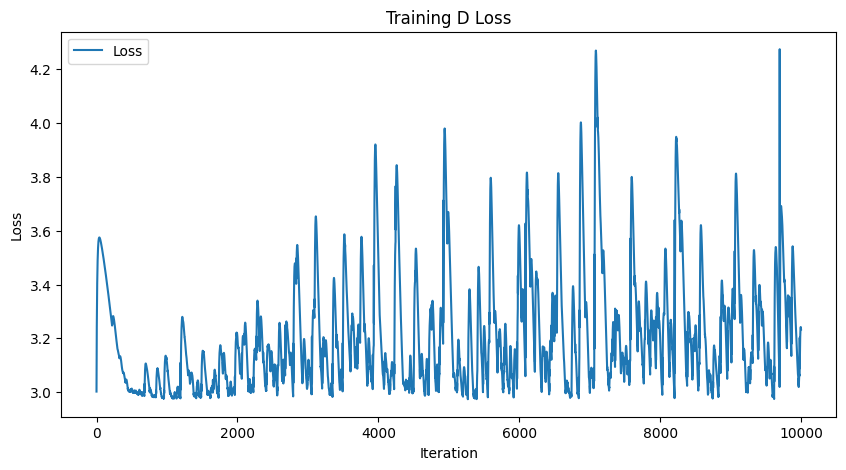

-----------------------Plotting Lyapunov-----------------------


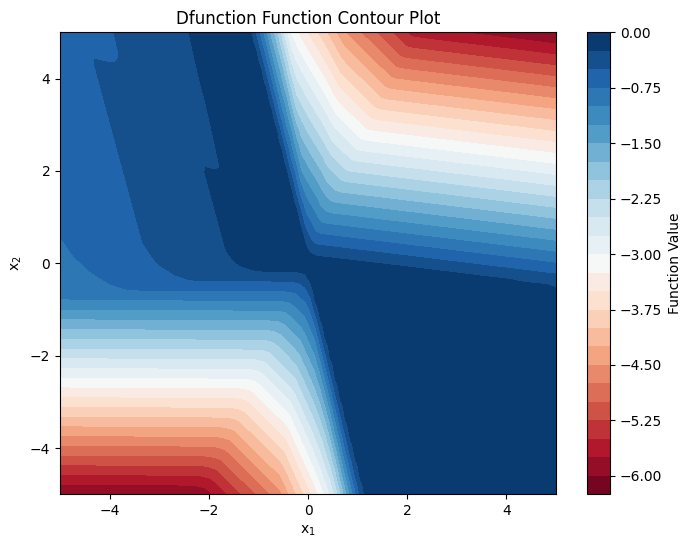

torch.sum(loss_fn(dL, DV_ext)):2.9565722942352295, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0084], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


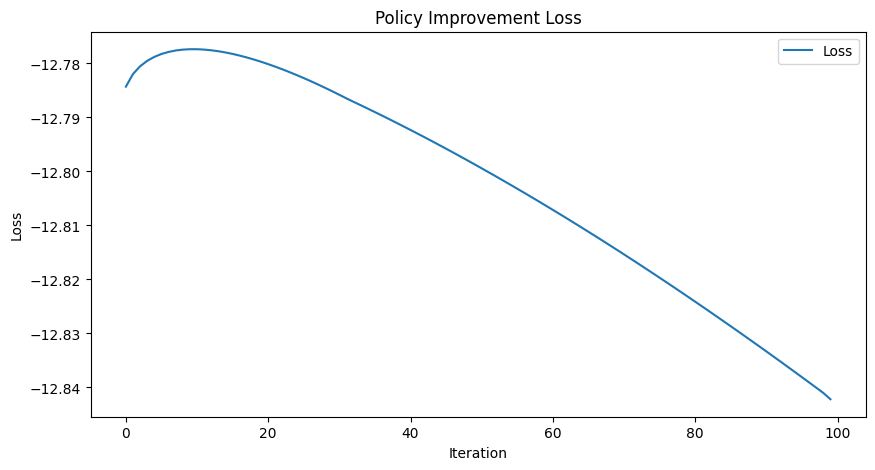

---------------------Sampling Training Data---------------------


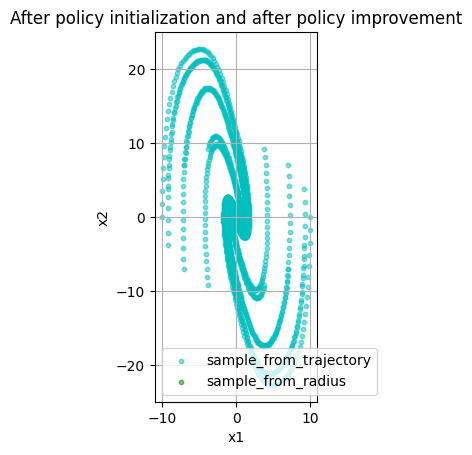

-----------------It takes 226 steps to converge.------------------


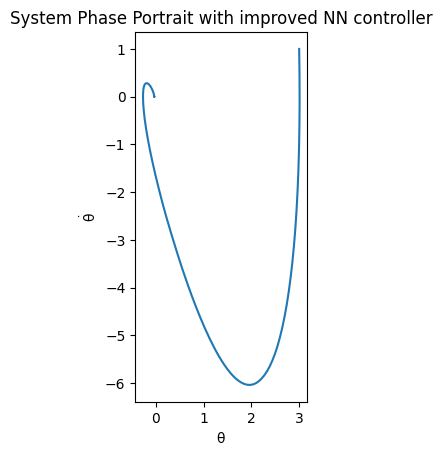

第11次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5438897610
Epoch [2000/10000], Loss: 1.3633614779
Epoch [3000/10000], Loss: 1.2987178564
Epoch [4000/10000], Loss: 1.2832312584
Epoch [5000/10000], Loss: 1.2781332731
Epoch [6000/10000], Loss: 1.2759679556
Epoch [7000/10000], Loss: 1.2752330303
Epoch [8000/10000], Loss: 1.2746001482
Epoch [9000/10000], Loss: 1.2739297152
Epoch [10000/10000], Loss: 1.2730029821


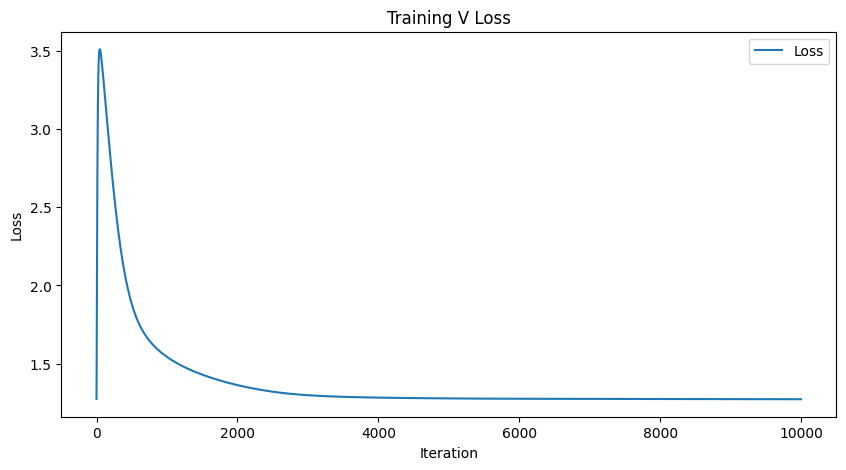

-----------------------Plotting Lyapunov-----------------------


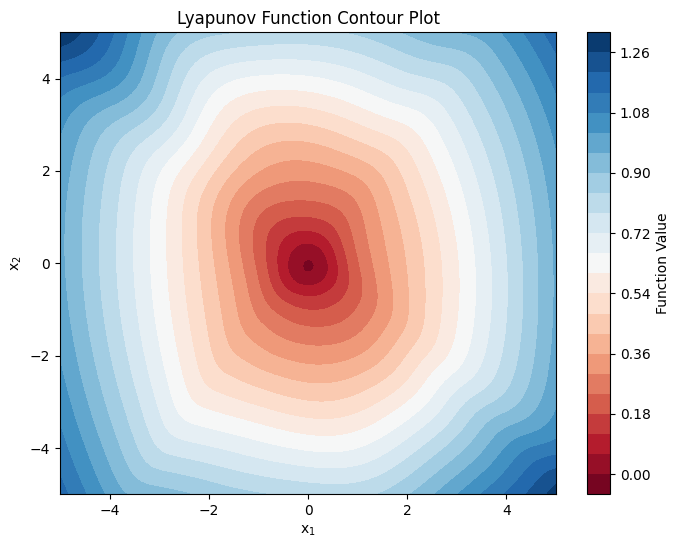

L0:tensor([-0.0067], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.35659027099609375, torch.sum(F.relu(dL)):1892.647705078125
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.0157403946
Epoch [2000/10000], Loss: 2.9551150799
Epoch [3000/10000], Loss: 3.1151204109
Epoch [4000/10000], Loss: 3.0627012253
Epoch [5000/10000], Loss: 3.5323128700
Epoch [6000/10000], Loss: 3.7615299225
Epoch [7000/10000], Loss: 3.1810214520
Epoch [8000/10000], Loss: 3.4519009590
Epoch [9000/10000], Loss: 2.9923799038
Epoch [10000/10000], Loss: 3.0849745274


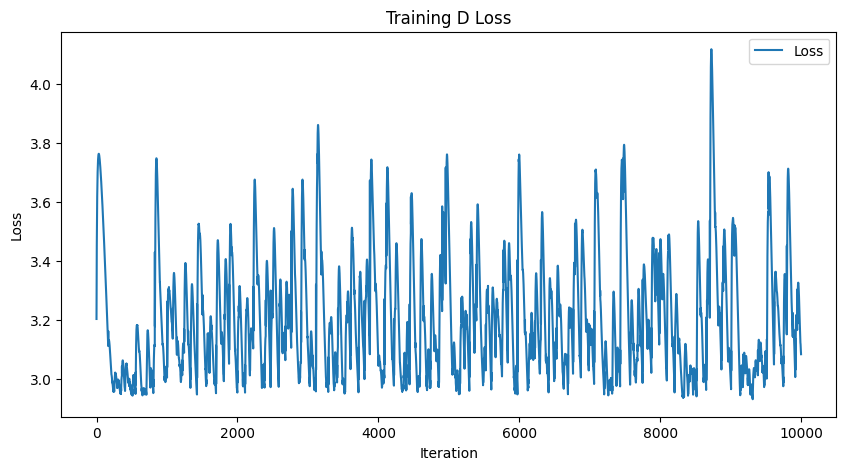

-----------------------Plotting Lyapunov-----------------------


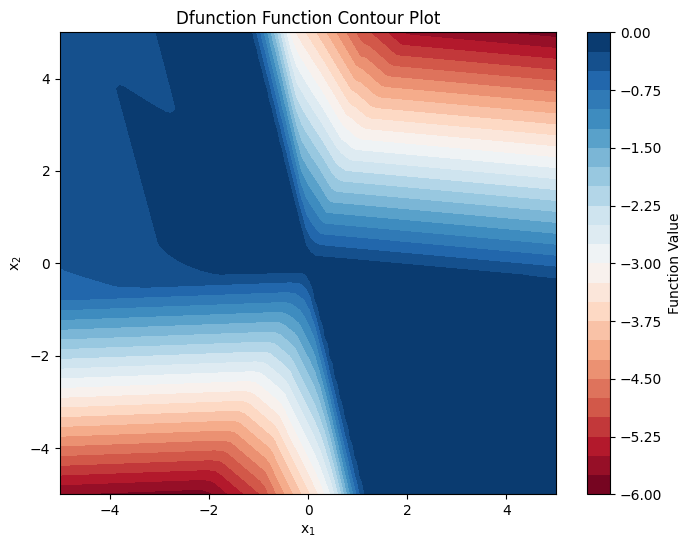

torch.sum(loss_fn(dL, DV_ext)):2.8158345222473145, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0079], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


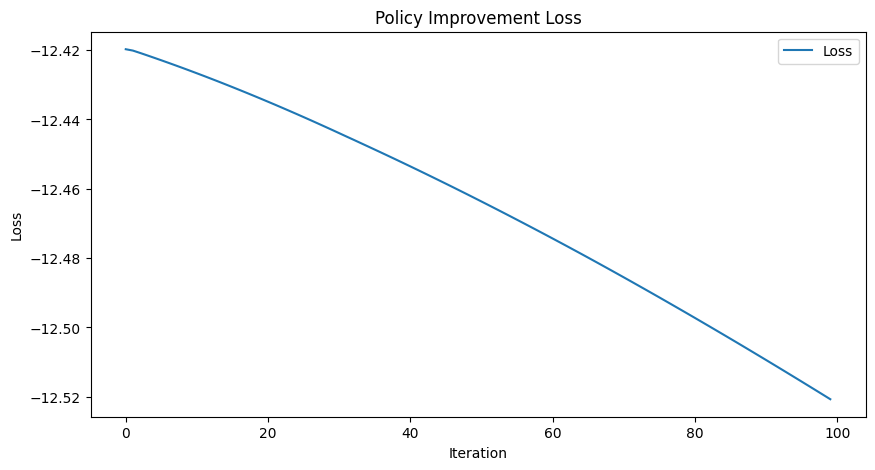

---------------------Sampling Training Data---------------------


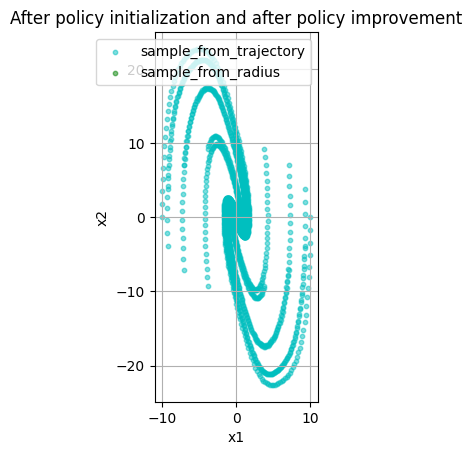

-----------------It takes 224 steps to converge.------------------


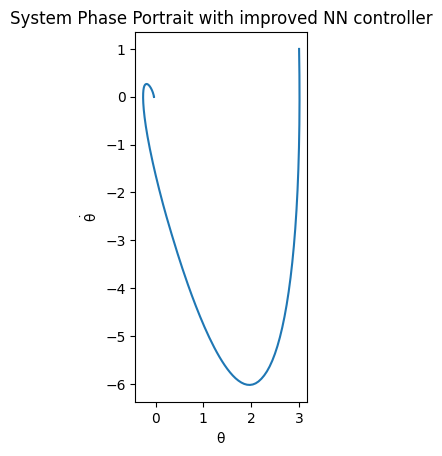

第12次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5298886299
Epoch [2000/10000], Loss: 1.3540389538
Epoch [3000/10000], Loss: 1.2925587893
Epoch [4000/10000], Loss: 1.2755571604
Epoch [5000/10000], Loss: 1.2703191042
Epoch [6000/10000], Loss: 1.2681747675
Epoch [7000/10000], Loss: 1.2674425840
Epoch [8000/10000], Loss: 1.2668780088
Epoch [9000/10000], Loss: 1.2662698030
Epoch [10000/10000], Loss: 1.2653374672


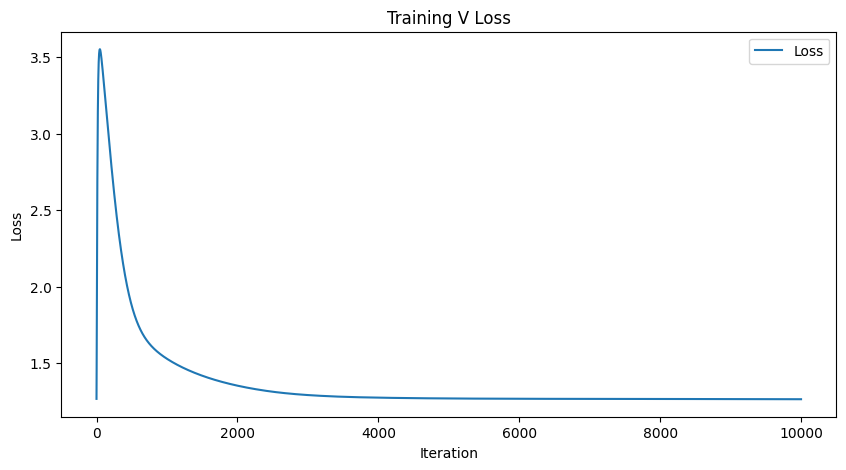

-----------------------Plotting Lyapunov-----------------------


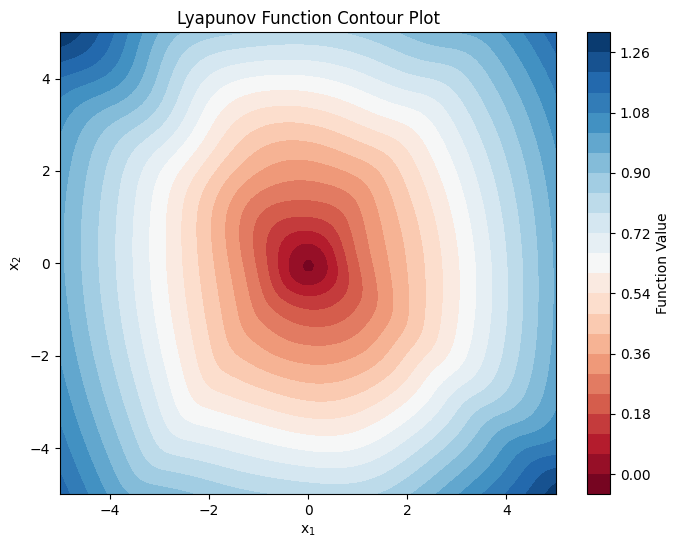

L0:tensor([-0.0074], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.4240081310272217, torch.sum(F.relu(dL)):1876.251708984375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.9270994663
Epoch [2000/10000], Loss: 3.0073165894
Epoch [3000/10000], Loss: 3.1962983608
Epoch [4000/10000], Loss: 3.4203760624
Epoch [5000/10000], Loss: 3.6079411507
Epoch [6000/10000], Loss: 3.2057099342
Epoch [7000/10000], Loss: 3.0662147999
Epoch [8000/10000], Loss: 2.9423930645
Epoch [9000/10000], Loss: 3.0583581924
Epoch [10000/10000], Loss: 3.3664681911


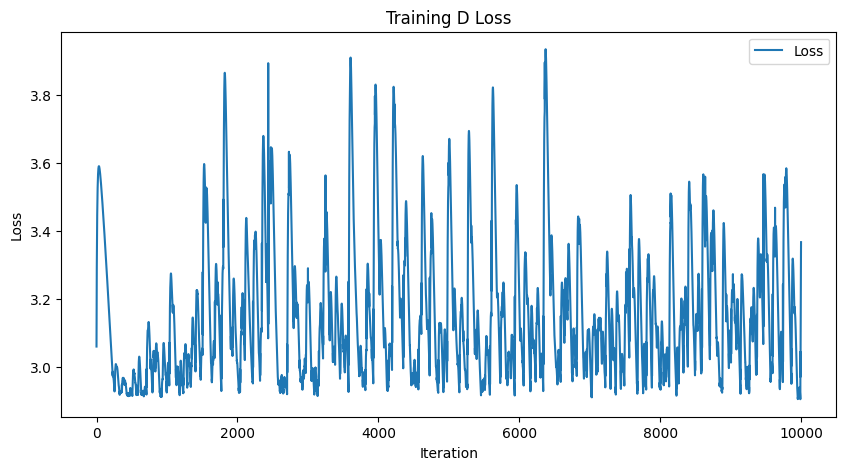

-----------------------Plotting Lyapunov-----------------------


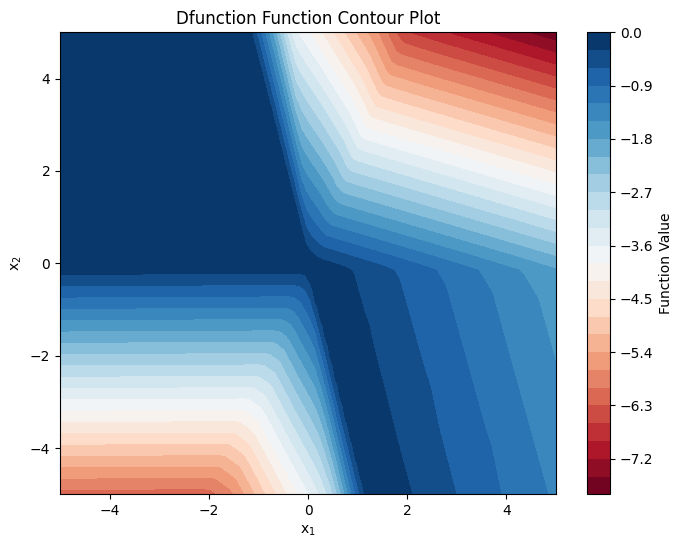

torch.sum(loss_fn(dL, DV_ext)):3.1028811931610107, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0147], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


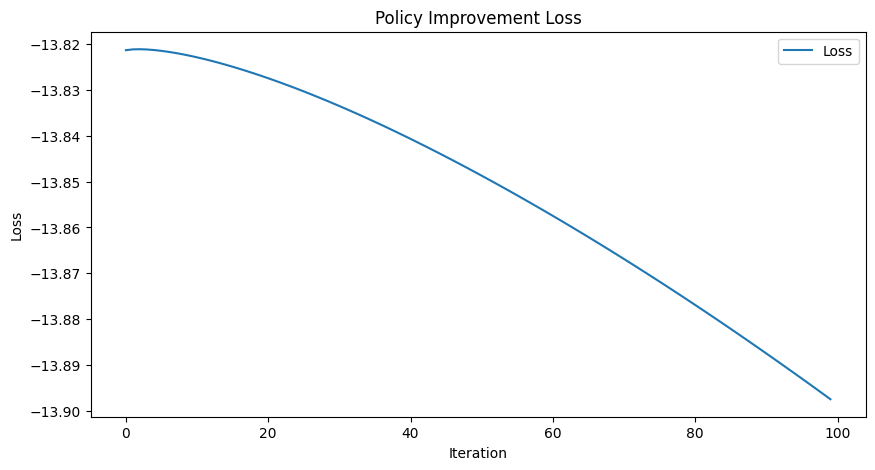

---------------------Sampling Training Data---------------------


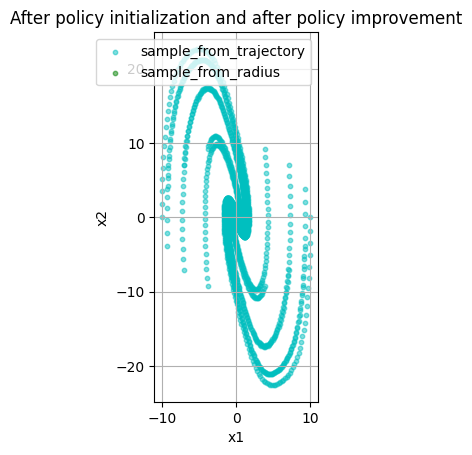

-----------------It takes 222 steps to converge.------------------


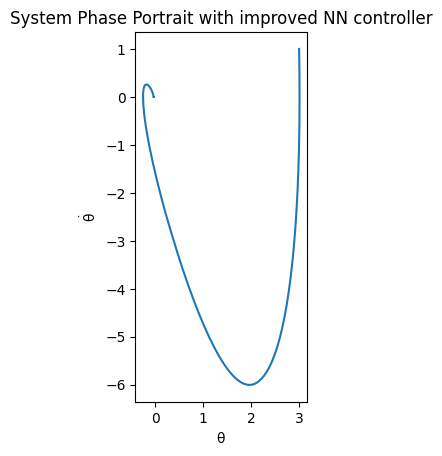

第13次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5356469154
Epoch [2000/10000], Loss: 1.3457800150
Epoch [3000/10000], Loss: 1.2851067781
Epoch [4000/10000], Loss: 1.2696890831
Epoch [5000/10000], Loss: 1.2648746967
Epoch [6000/10000], Loss: 1.2623589039
Epoch [7000/10000], Loss: 1.2613849640
Epoch [8000/10000], Loss: 1.2607059479
Epoch [9000/10000], Loss: 1.2600771189
Epoch [10000/10000], Loss: 1.2591454983


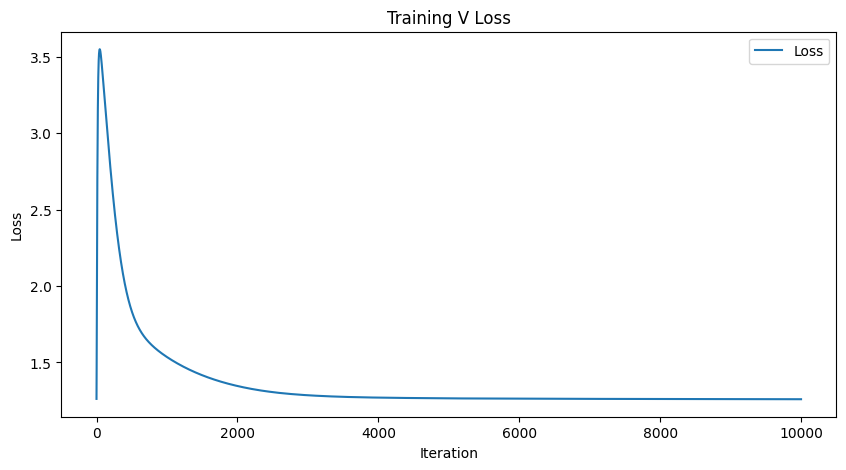

-----------------------Plotting Lyapunov-----------------------


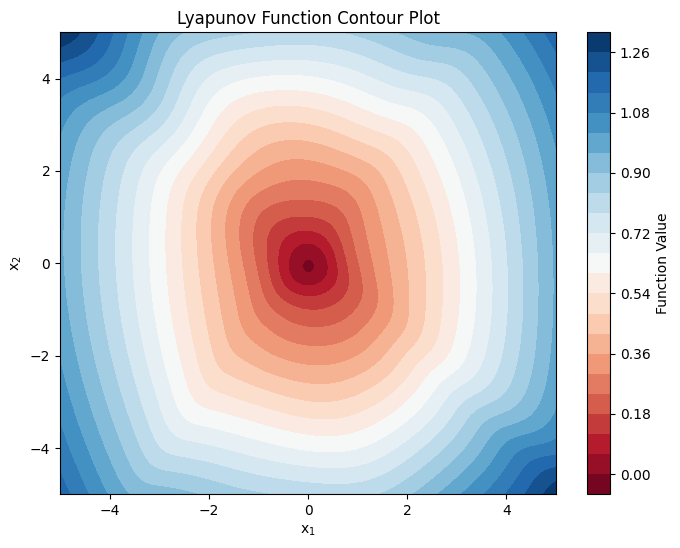

L0:tensor([-0.0080], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.47582054138183594, torch.sum(F.relu(dL)):1862.224853515625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.1576211452
Epoch [2000/10000], Loss: 3.0249452591
Epoch [3000/10000], Loss: 3.2463588715
Epoch [4000/10000], Loss: 2.9505496025
Epoch [5000/10000], Loss: 3.5335493088
Epoch [6000/10000], Loss: 3.0127975941
Epoch [7000/10000], Loss: 3.0806775093
Epoch [8000/10000], Loss: 3.1719036102
Epoch [9000/10000], Loss: 2.9848029613
Epoch [10000/10000], Loss: 3.2589049339


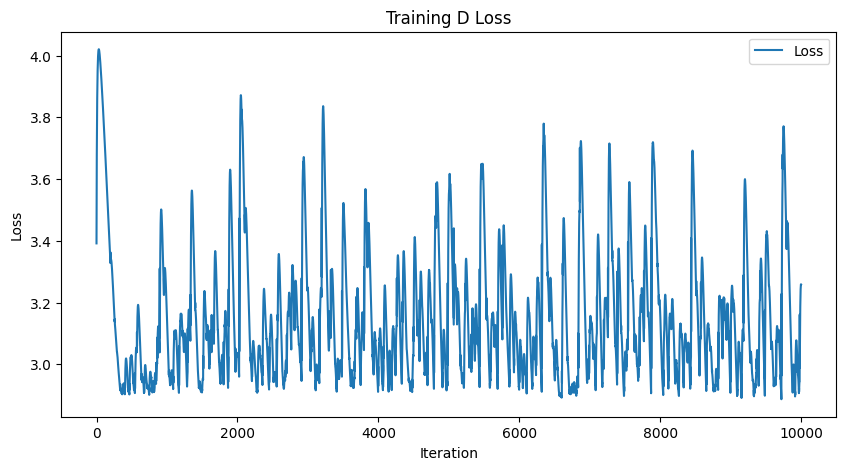

-----------------------Plotting Lyapunov-----------------------


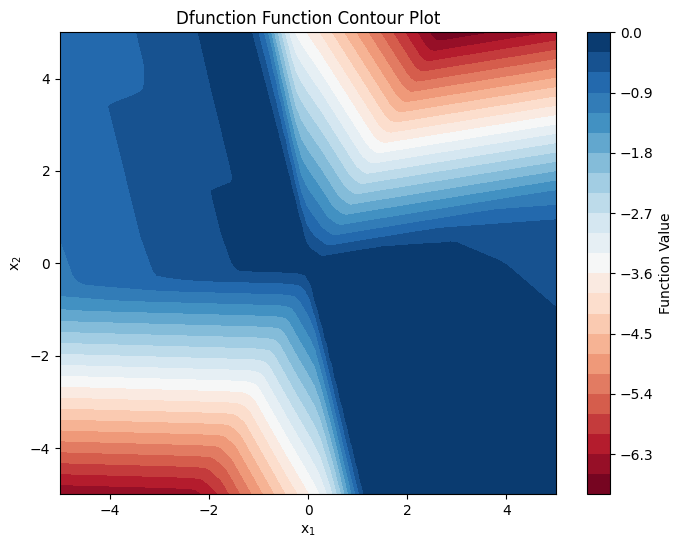

torch.sum(loss_fn(dL, DV_ext)):3.005807399749756, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0070], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


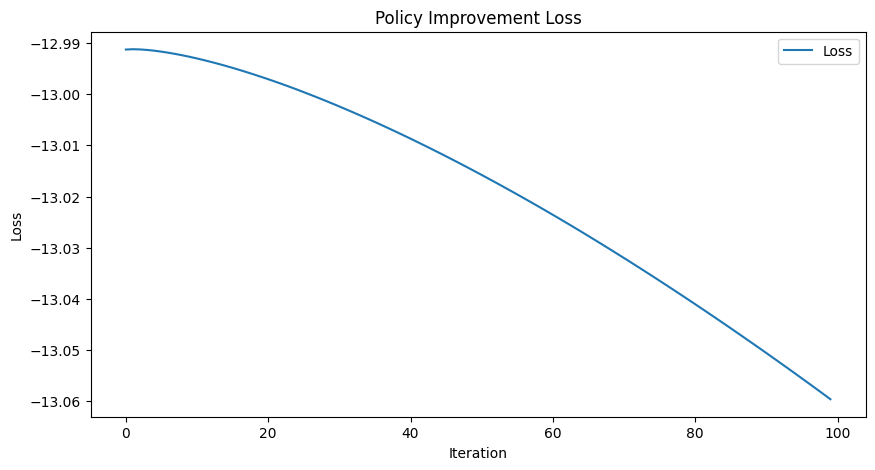

---------------------Sampling Training Data---------------------


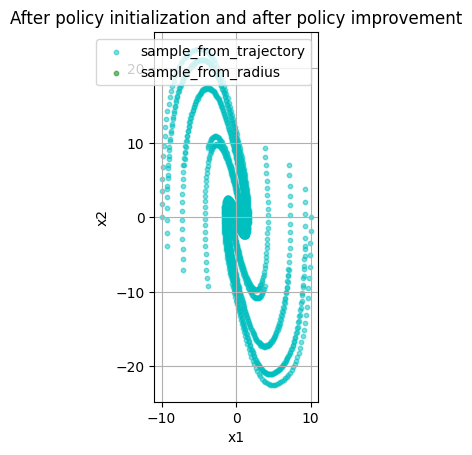

-----------------It takes 221 steps to converge.------------------


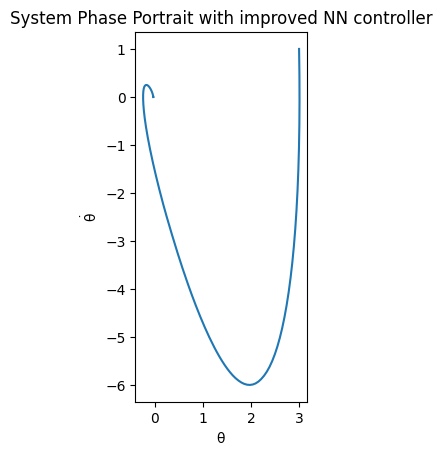

第14次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5127866268
Epoch [2000/10000], Loss: 1.3441535234
Epoch [3000/10000], Loss: 1.2824702263
Epoch [4000/10000], Loss: 1.2640922070
Epoch [5000/10000], Loss: 1.2585017681
Epoch [6000/10000], Loss: 1.2565485239
Epoch [7000/10000], Loss: 1.2557671070
Epoch [8000/10000], Loss: 1.2551853657
Epoch [9000/10000], Loss: 1.2546464205
Epoch [10000/10000], Loss: 1.2538286448


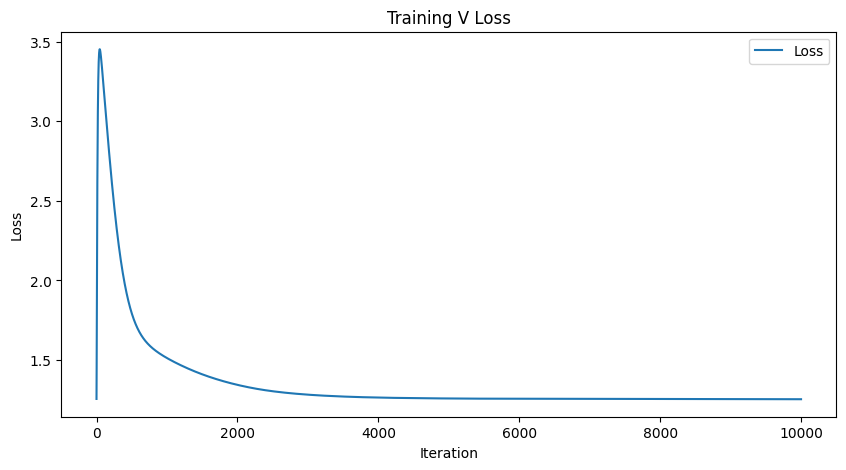

-----------------------Plotting Lyapunov-----------------------


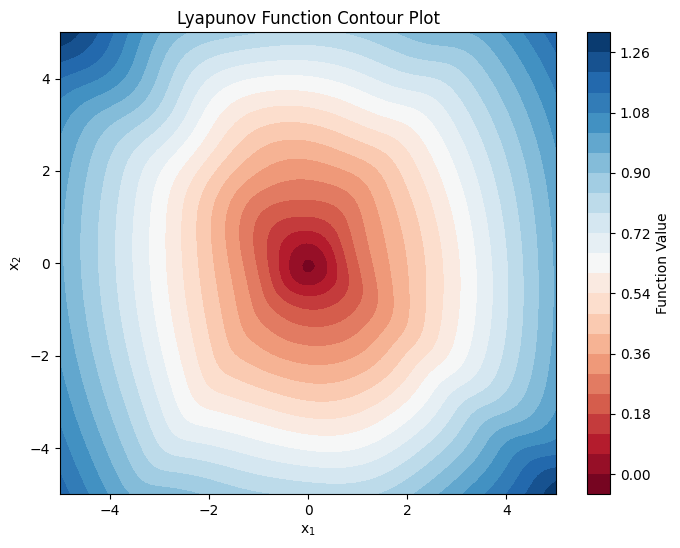

L0:tensor([-0.0090], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.5625958442687988, torch.sum(F.relu(dL)):1850.588134765625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.1125931740
Epoch [2000/10000], Loss: 3.0808610916
Epoch [3000/10000], Loss: 2.8970026970
Epoch [4000/10000], Loss: 3.0276474953
Epoch [5000/10000], Loss: 2.9756832123
Epoch [6000/10000], Loss: 2.9251616001
Epoch [7000/10000], Loss: 3.0856137276
Epoch [8000/10000], Loss: 3.1478226185
Epoch [9000/10000], Loss: 3.2559468746
Epoch [10000/10000], Loss: 2.9084641933


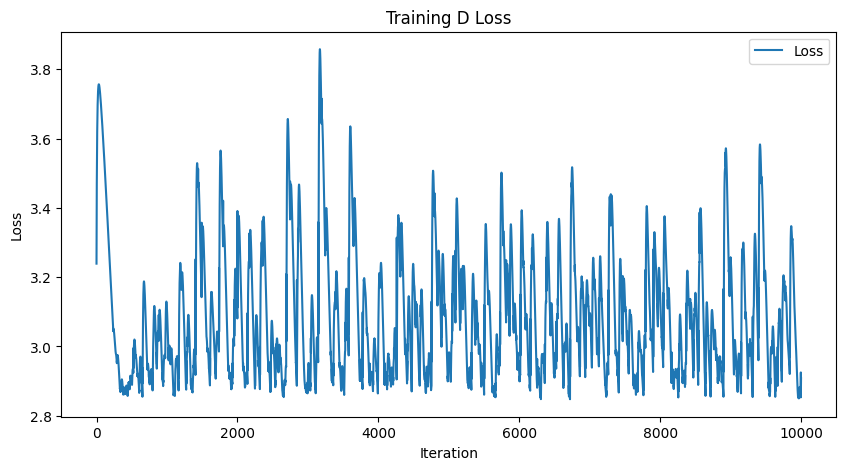

-----------------------Plotting Lyapunov-----------------------


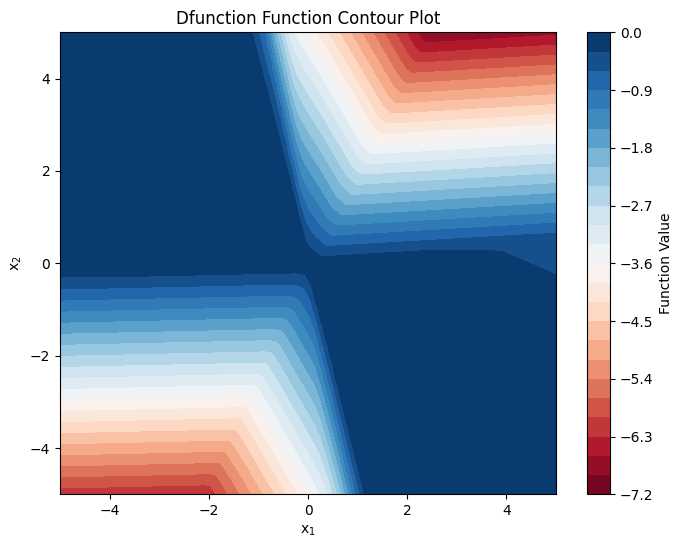

torch.sum(loss_fn(dL, DV_ext)):2.6666555404663086, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0080], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


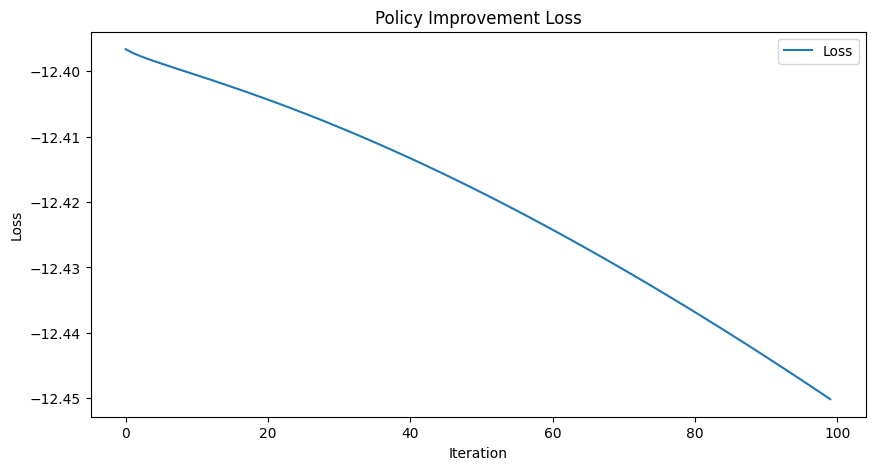

---------------------Sampling Training Data---------------------


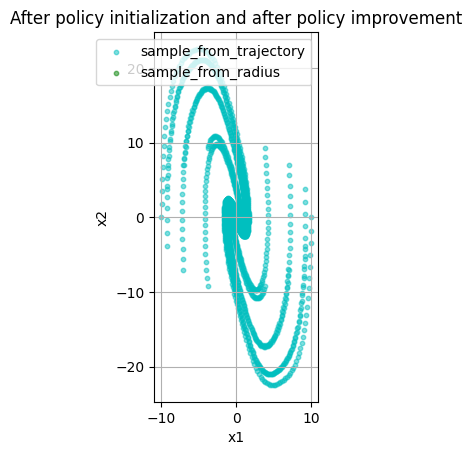

-----------------It takes 219 steps to converge.------------------


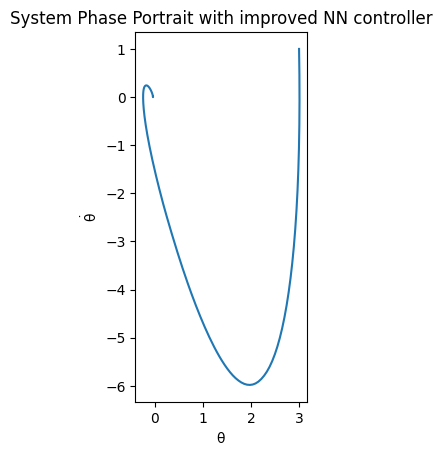

第15次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5202527046
Epoch [2000/10000], Loss: 1.3394734859
Epoch [3000/10000], Loss: 1.2768507004
Epoch [4000/10000], Loss: 1.2597055435
Epoch [5000/10000], Loss: 1.2542736530
Epoch [6000/10000], Loss: 1.2520582676
Epoch [7000/10000], Loss: 1.2512692213
Epoch [8000/10000], Loss: 1.2507468462
Epoch [9000/10000], Loss: 1.2501671314
Epoch [10000/10000], Loss: 1.2492805719


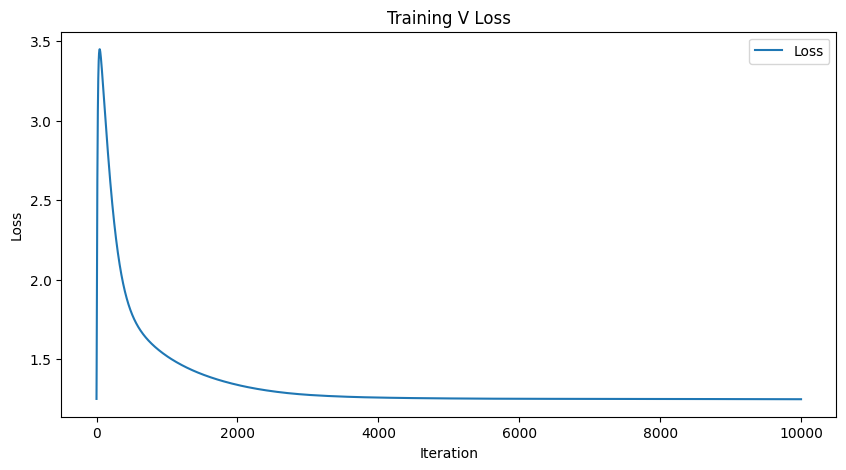

-----------------------Plotting Lyapunov-----------------------


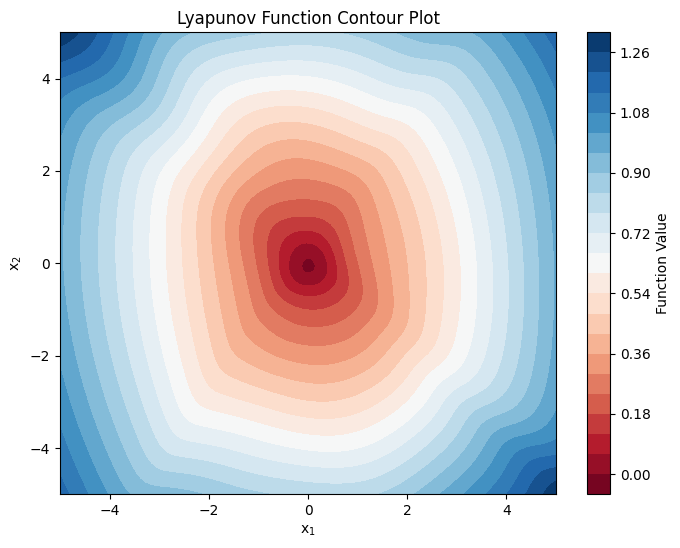

L0:tensor([-0.0099], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.6322259902954102, torch.sum(F.relu(dL)):1840.633544921875
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.9865064621
Epoch [2000/10000], Loss: 2.8932328224
Epoch [3000/10000], Loss: 3.1300427914
Epoch [4000/10000], Loss: 2.9237115383
Epoch [5000/10000], Loss: 3.1346249580
Epoch [6000/10000], Loss: 2.8593649864
Epoch [7000/10000], Loss: 2.9685354233
Epoch [8000/10000], Loss: 3.2573370934
Epoch [9000/10000], Loss: 3.2843592167
Epoch [10000/10000], Loss: 2.9561171532


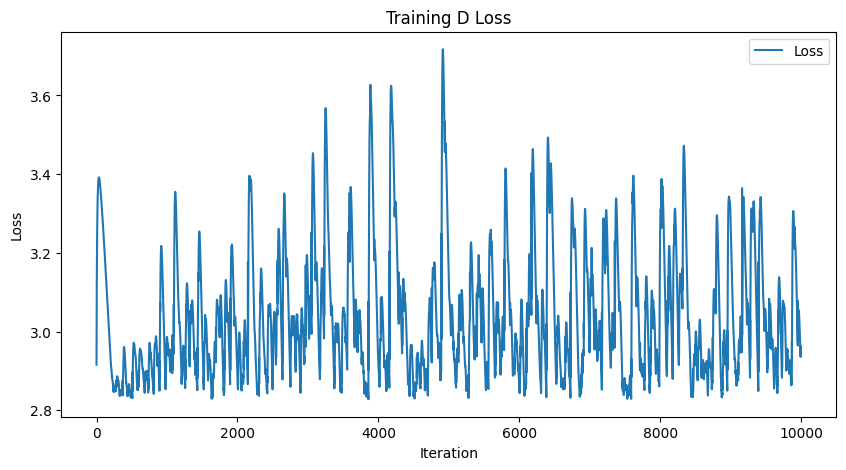

-----------------------Plotting Lyapunov-----------------------


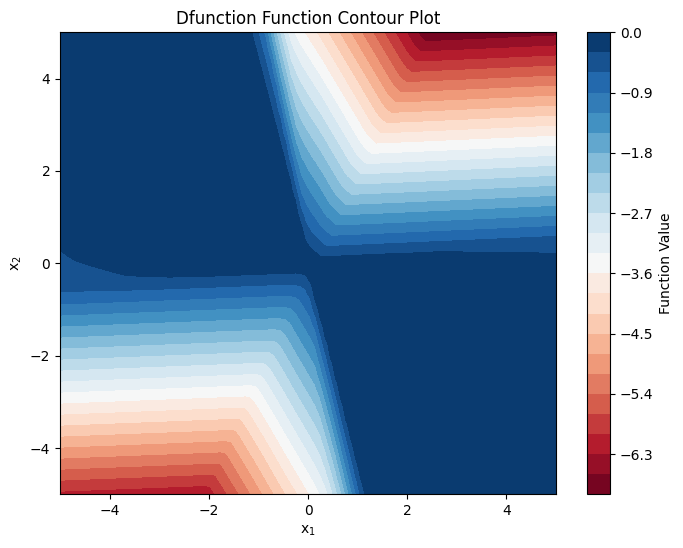

torch.sum(loss_fn(dL, DV_ext)):2.7230565547943115, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0079], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


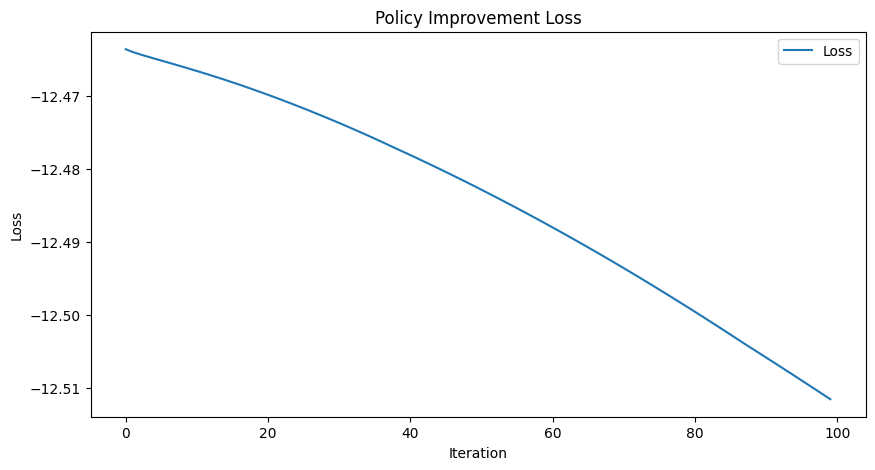

---------------------Sampling Training Data---------------------


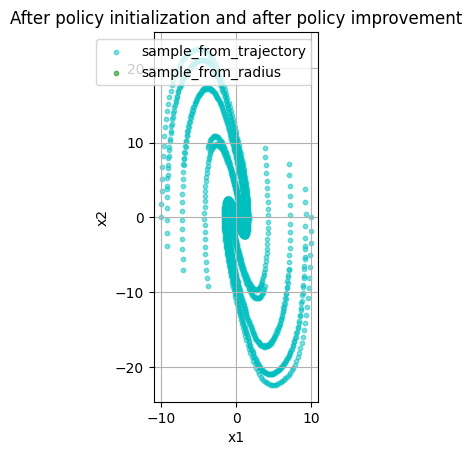

-----------------It takes 218 steps to converge.------------------


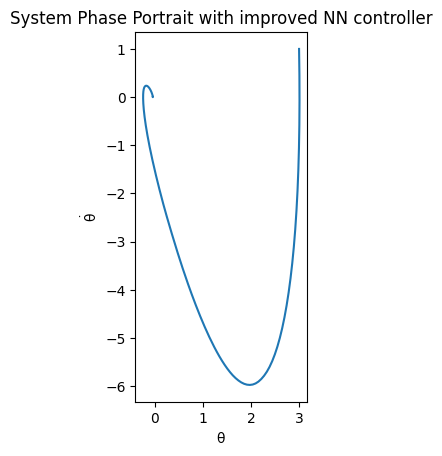

第16次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5206192732
Epoch [2000/10000], Loss: 1.3274239302
Epoch [3000/10000], Loss: 1.2715849876
Epoch [4000/10000], Loss: 1.2552379370
Epoch [5000/10000], Loss: 1.2499363422
Epoch [6000/10000], Loss: 1.2477991581
Epoch [7000/10000], Loss: 1.2469639778
Epoch [8000/10000], Loss: 1.2463846207
Epoch [9000/10000], Loss: 1.2458242178
Epoch [10000/10000], Loss: 1.2449570894


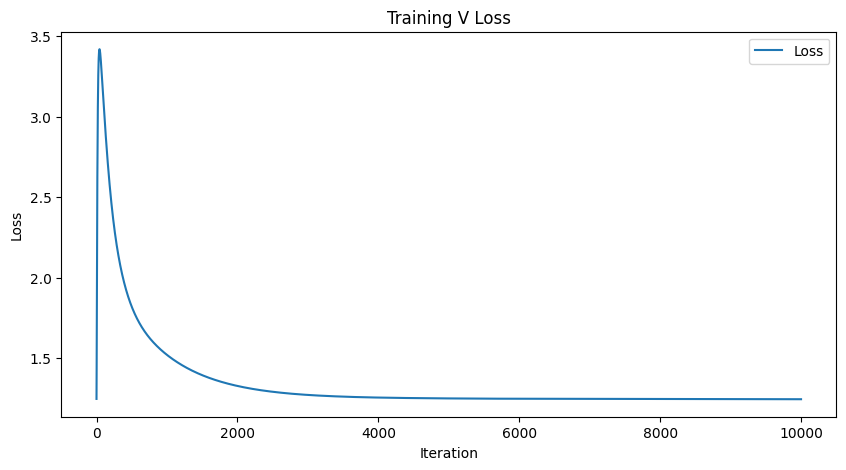

-----------------------Plotting Lyapunov-----------------------


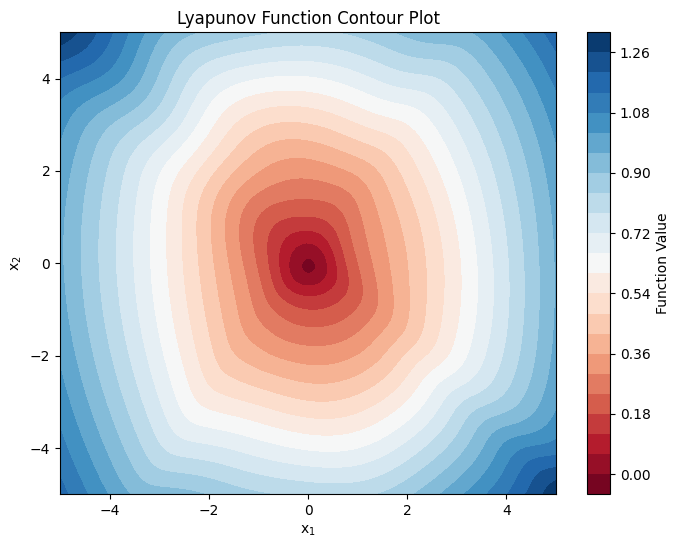

L0:tensor([-0.0109], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.7017390727996826, torch.sum(F.relu(dL)):1831.068115234375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.0759875774
Epoch [2000/10000], Loss: 3.0418186188
Epoch [3000/10000], Loss: 3.0463712215
Epoch [4000/10000], Loss: 3.5084848404
Epoch [5000/10000], Loss: 3.0744962692
Epoch [6000/10000], Loss: 2.8262155056
Epoch [7000/10000], Loss: 3.1649446487
Epoch [8000/10000], Loss: 2.9066088200
Epoch [9000/10000], Loss: 2.8941485882
Epoch [10000/10000], Loss: 3.0583341122


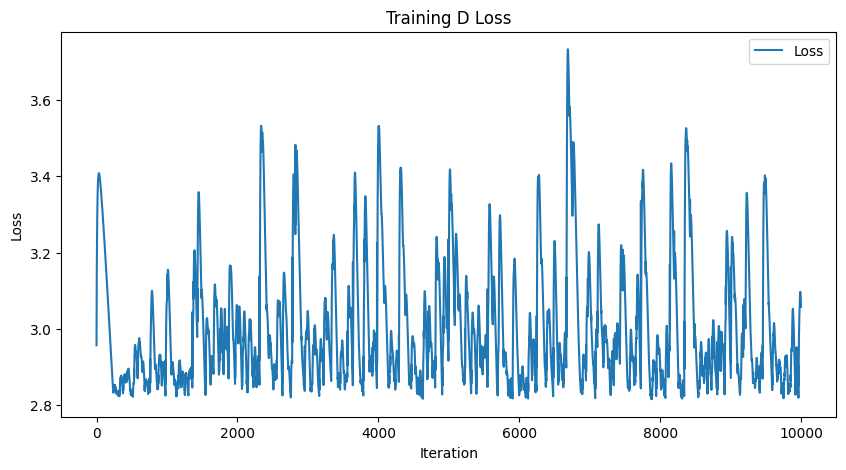

-----------------------Plotting Lyapunov-----------------------


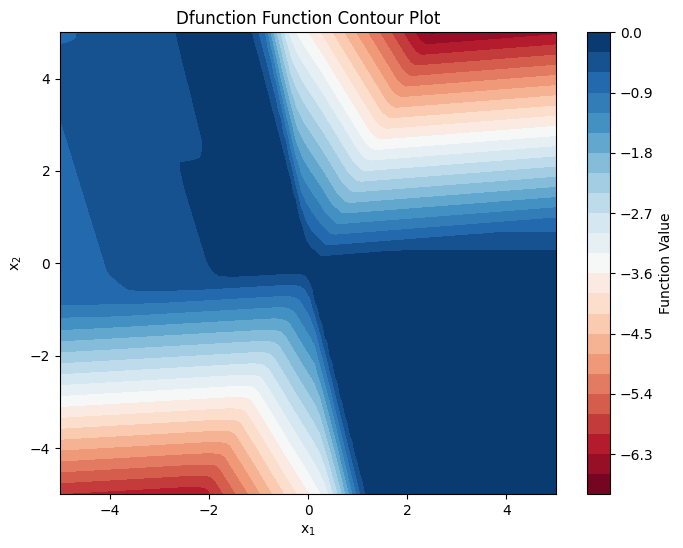

torch.sum(loss_fn(dL, DV_ext)):2.8325023651123047, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0105], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


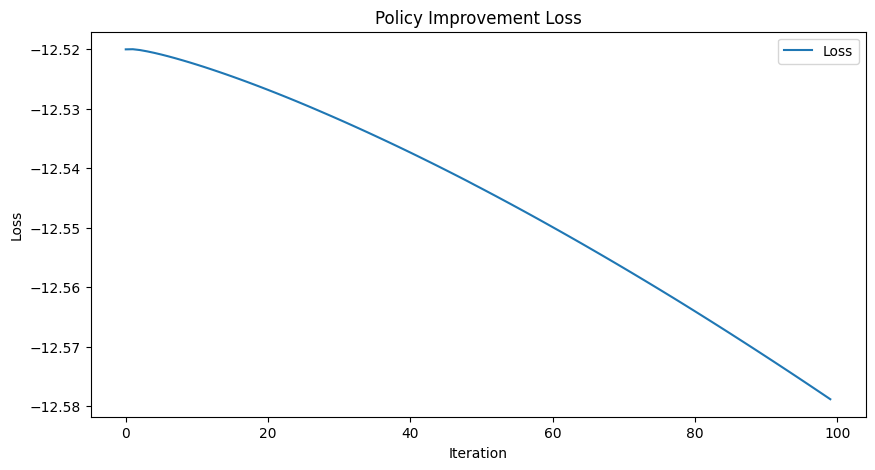

---------------------Sampling Training Data---------------------


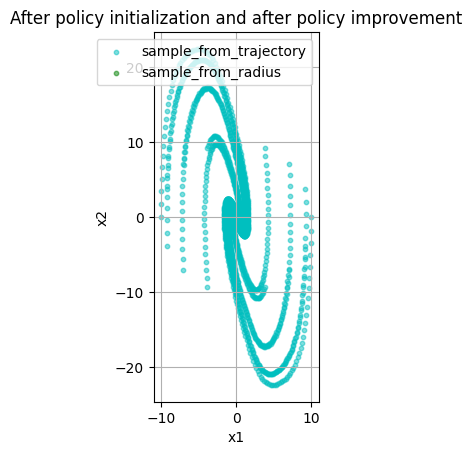

-----------------It takes 216 steps to converge.------------------


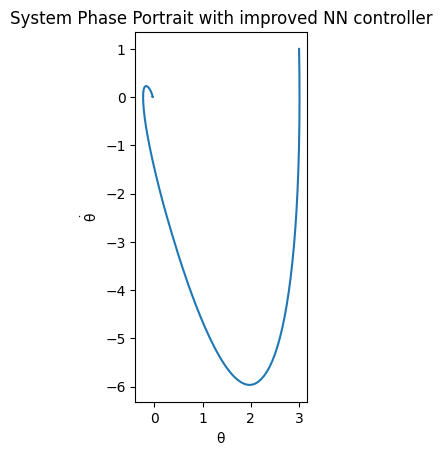

第17次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5165234804
Epoch [2000/10000], Loss: 1.3266451359
Epoch [3000/10000], Loss: 1.2678511143
Epoch [4000/10000], Loss: 1.2508499622
Epoch [5000/10000], Loss: 1.2448961735
Epoch [6000/10000], Loss: 1.2428134680
Epoch [7000/10000], Loss: 1.2419801950
Epoch [8000/10000], Loss: 1.2414146662
Epoch [9000/10000], Loss: 1.2408591509
Epoch [10000/10000], Loss: 1.2400414944


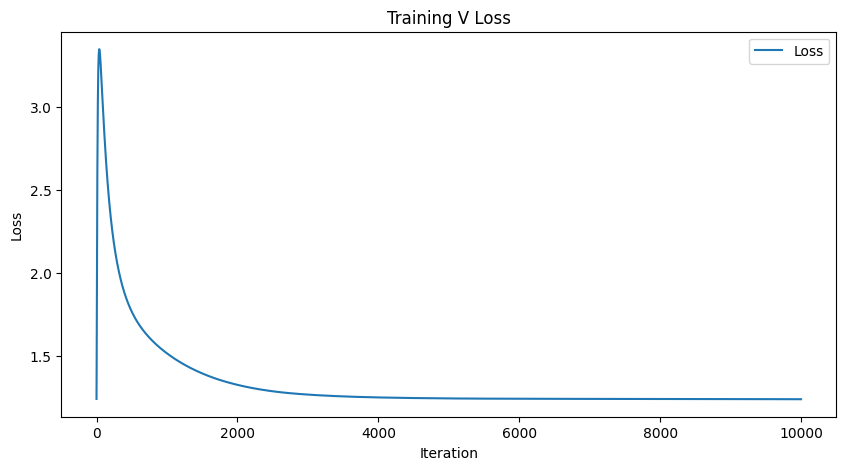

-----------------------Plotting Lyapunov-----------------------


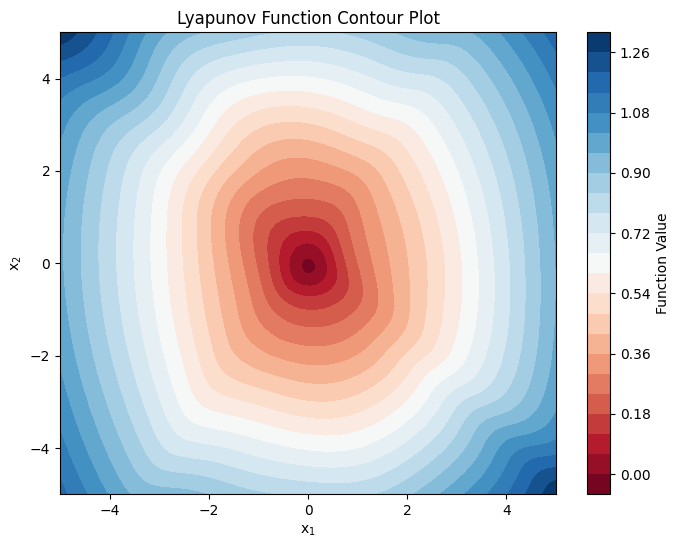

L0:tensor([-0.0116], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.7592676877975464, torch.sum(F.relu(dL)):1818.686279296875
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.8535726070
Epoch [2000/10000], Loss: 2.9329936504
Epoch [3000/10000], Loss: 2.9279661179
Epoch [4000/10000], Loss: 3.1018261909
Epoch [5000/10000], Loss: 2.8636736870
Epoch [6000/10000], Loss: 3.4532933235
Epoch [7000/10000], Loss: 2.9406247139
Epoch [8000/10000], Loss: 2.9355790615
Epoch [9000/10000], Loss: 3.1649622917
Epoch [10000/10000], Loss: 3.4219696522


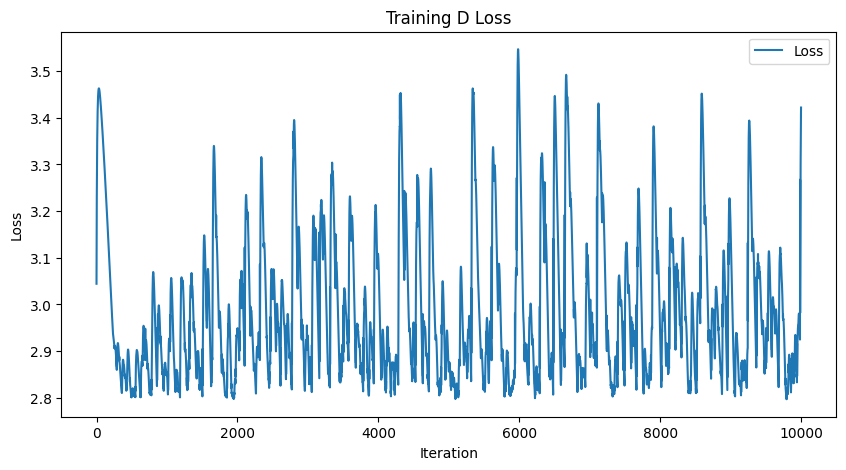

-----------------------Plotting Lyapunov-----------------------


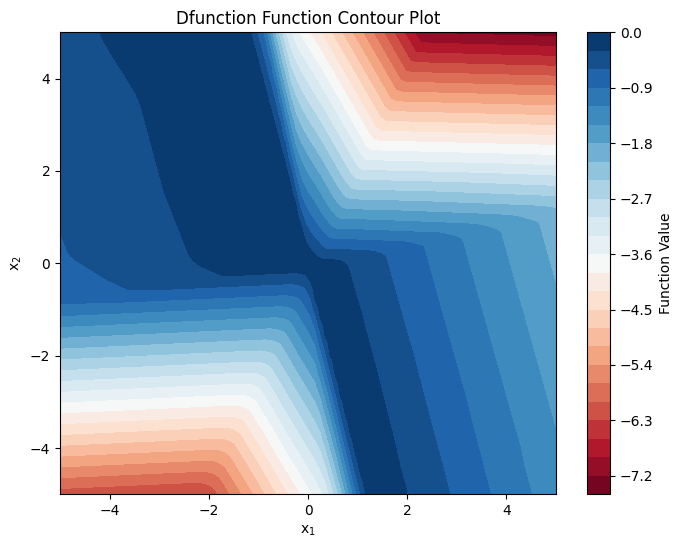

torch.sum(loss_fn(dL, DV_ext)):3.204012393951416, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0170], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


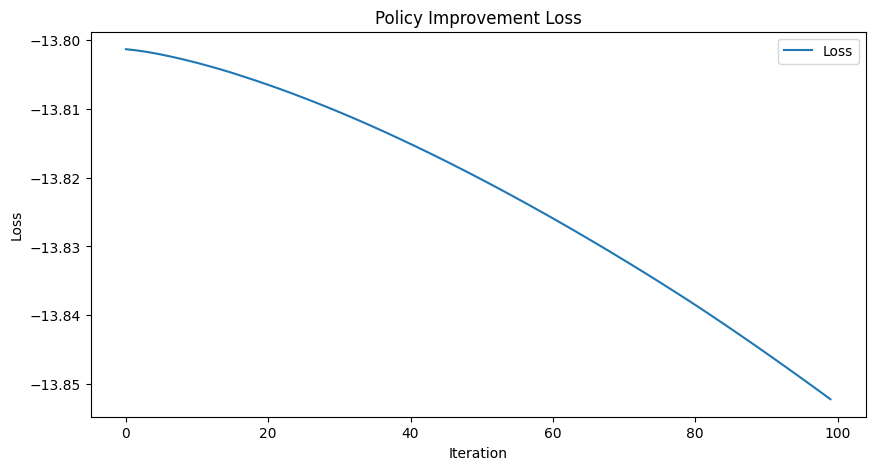

---------------------Sampling Training Data---------------------


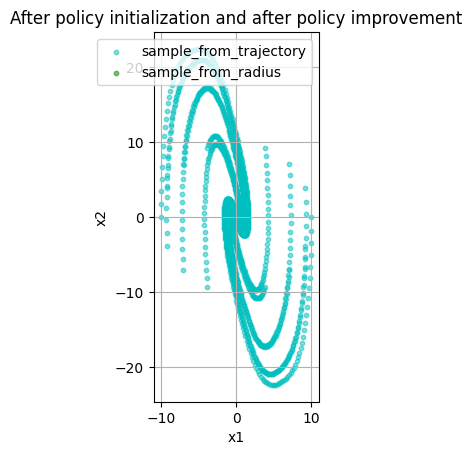

-----------------It takes 215 steps to converge.------------------


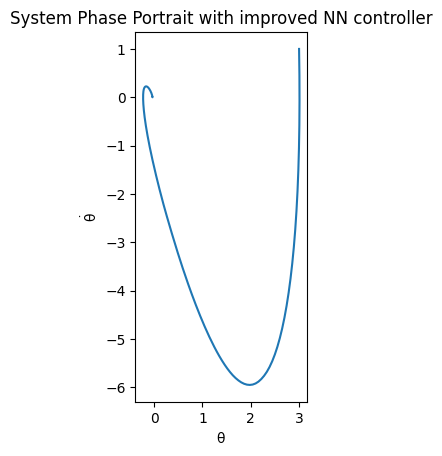

第18次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5122087002
Epoch [2000/10000], Loss: 1.3176418543
Epoch [3000/10000], Loss: 1.2624562979
Epoch [4000/10000], Loss: 1.2465335131
Epoch [5000/10000], Loss: 1.2405298948
Epoch [6000/10000], Loss: 1.2384871244
Epoch [7000/10000], Loss: 1.2376096249
Epoch [8000/10000], Loss: 1.2369683981
Epoch [9000/10000], Loss: 1.2364056110
Epoch [10000/10000], Loss: 1.2356295586


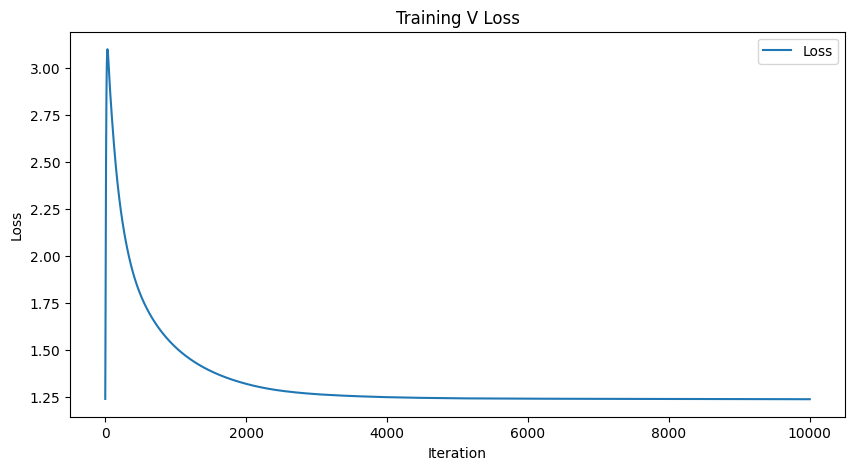

-----------------------Plotting Lyapunov-----------------------


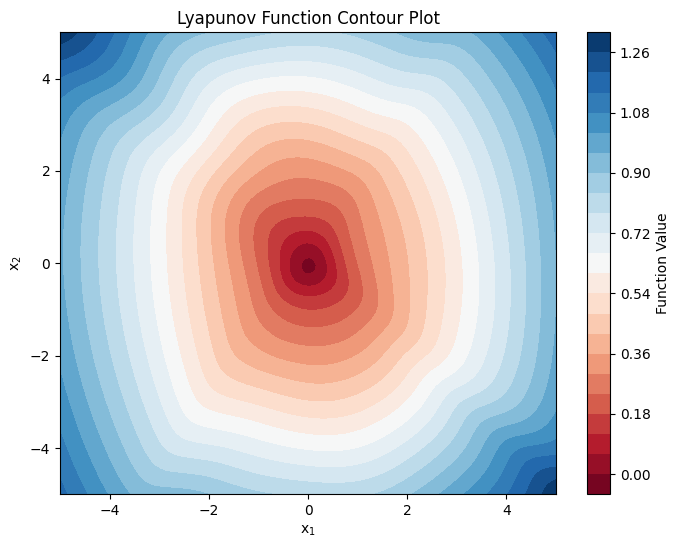

L0:tensor([-0.0130], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.8752896785736084, torch.sum(F.relu(dL)):1808.60693359375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.9269847870
Epoch [2000/10000], Loss: 2.8243401051
Epoch [3000/10000], Loss: 2.9286618233
Epoch [4000/10000], Loss: 2.9822416306
Epoch [5000/10000], Loss: 2.9455451965
Epoch [6000/10000], Loss: 2.9544248581
Epoch [7000/10000], Loss: 3.3788344860
Epoch [8000/10000], Loss: 2.9207410812
Epoch [9000/10000], Loss: 3.1002047062
Epoch [10000/10000], Loss: 2.9989957809


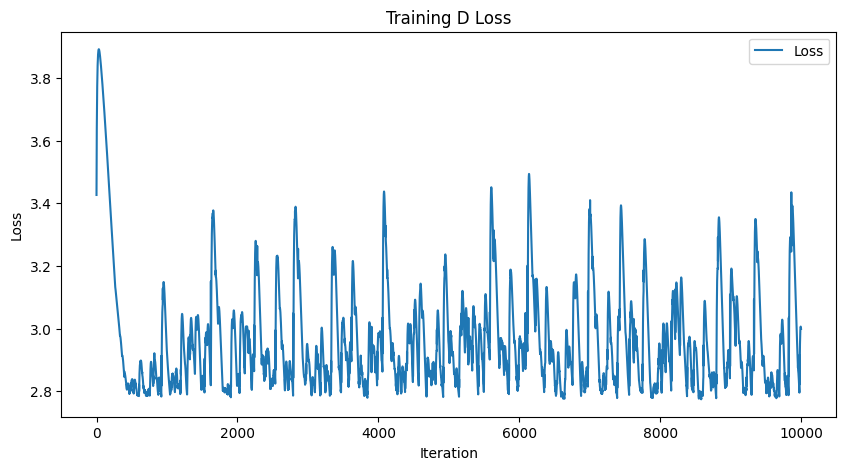

-----------------------Plotting Lyapunov-----------------------


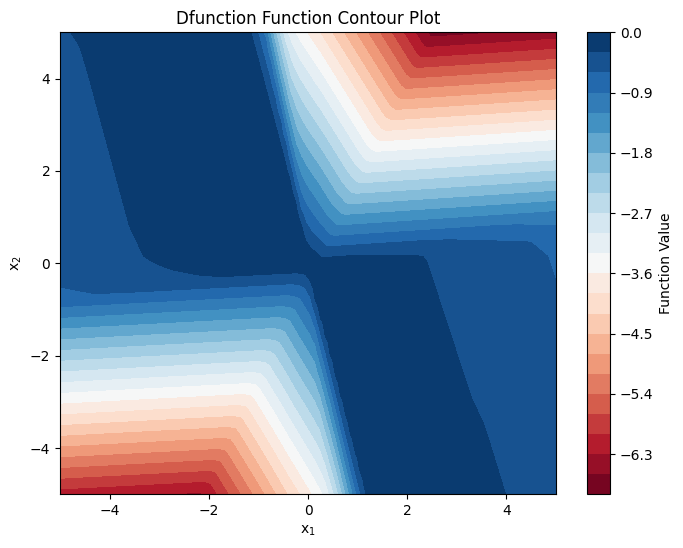

torch.sum(loss_fn(dL, DV_ext)):2.788858652114868, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0094], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


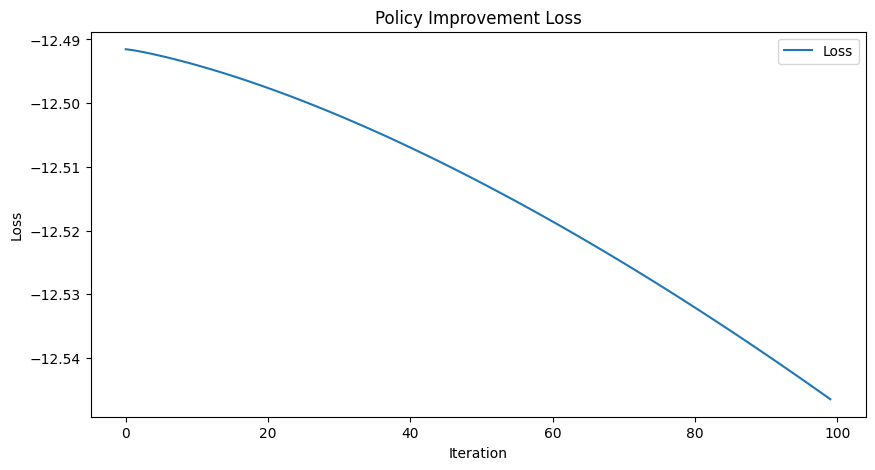

---------------------Sampling Training Data---------------------


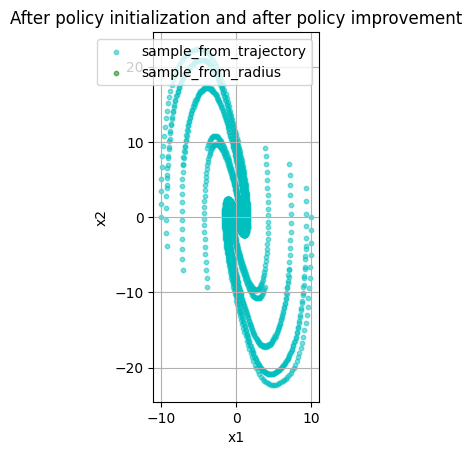

-----------------It takes 214 steps to converge.------------------


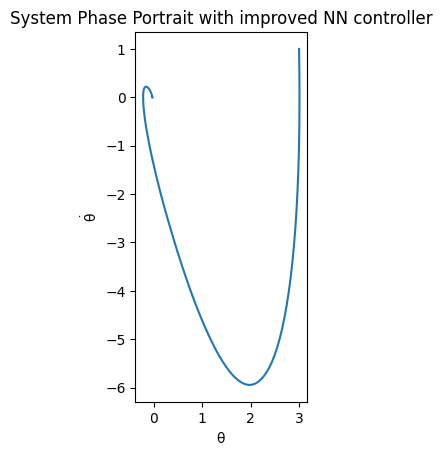

第19次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4998936653
Epoch [2000/10000], Loss: 1.3106502295
Epoch [3000/10000], Loss: 1.2600413561
Epoch [4000/10000], Loss: 1.2419049740
Epoch [5000/10000], Loss: 1.2358933687
Epoch [6000/10000], Loss: 1.2340519428
Epoch [7000/10000], Loss: 1.2331326008
Epoch [8000/10000], Loss: 1.2324141264
Epoch [9000/10000], Loss: 1.2318441868
Epoch [10000/10000], Loss: 1.2311254740


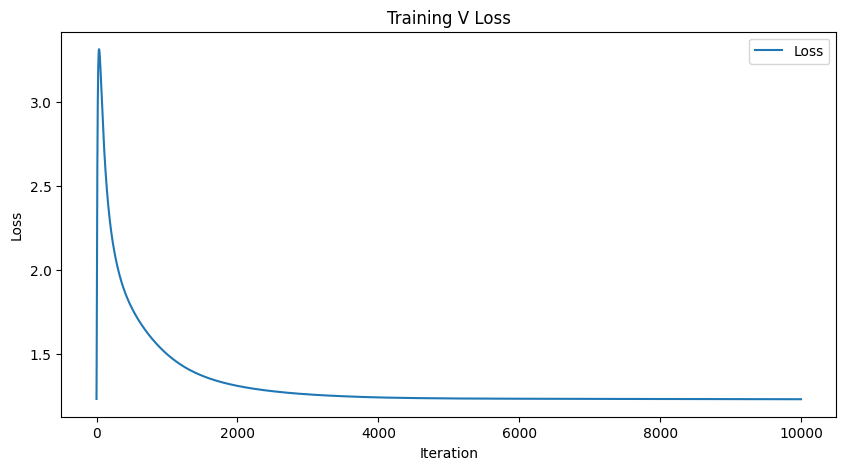

-----------------------Plotting Lyapunov-----------------------


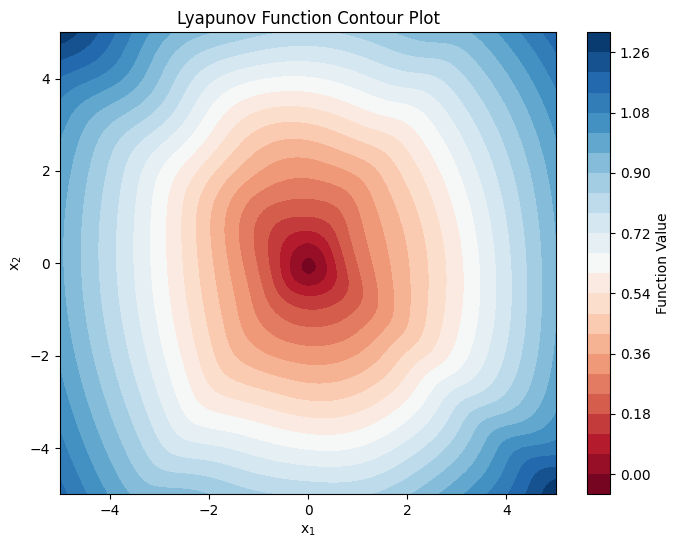

L0:tensor([-0.0140], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.9548623561859131, torch.sum(F.relu(dL)):1797.1756591796875
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.8706614971
Epoch [2000/10000], Loss: 2.8666567802
Epoch [3000/10000], Loss: 2.7720451355
Epoch [4000/10000], Loss: 2.8739211559
Epoch [5000/10000], Loss: 2.8349614143
Epoch [6000/10000], Loss: 2.8637511730
Epoch [7000/10000], Loss: 2.9497919083
Epoch [8000/10000], Loss: 2.8646116257
Epoch [9000/10000], Loss: 2.9516673088
Epoch [10000/10000], Loss: 2.8649804592


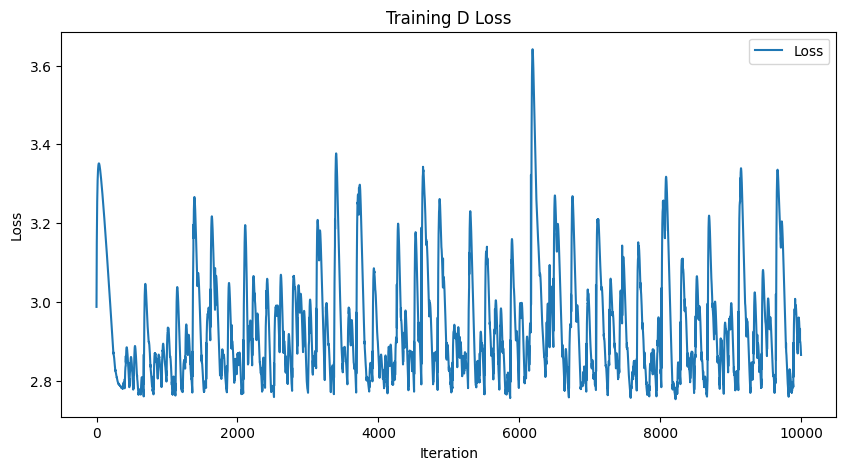

-----------------------Plotting Lyapunov-----------------------


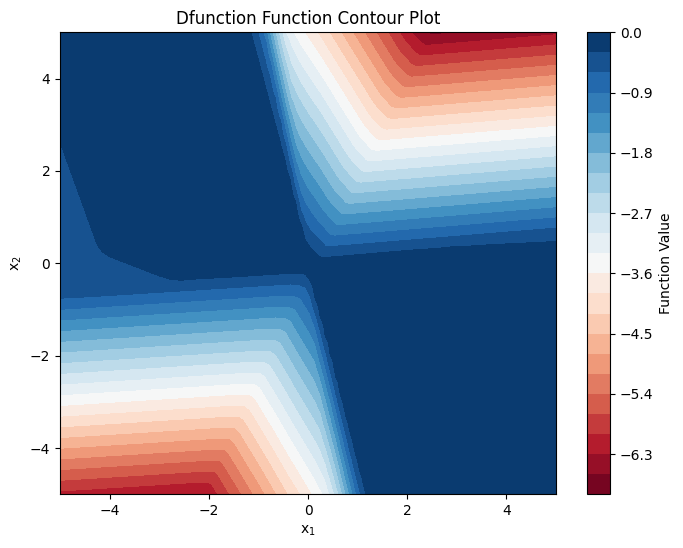

torch.sum(loss_fn(dL, DV_ext)):2.663766384124756, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0069], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


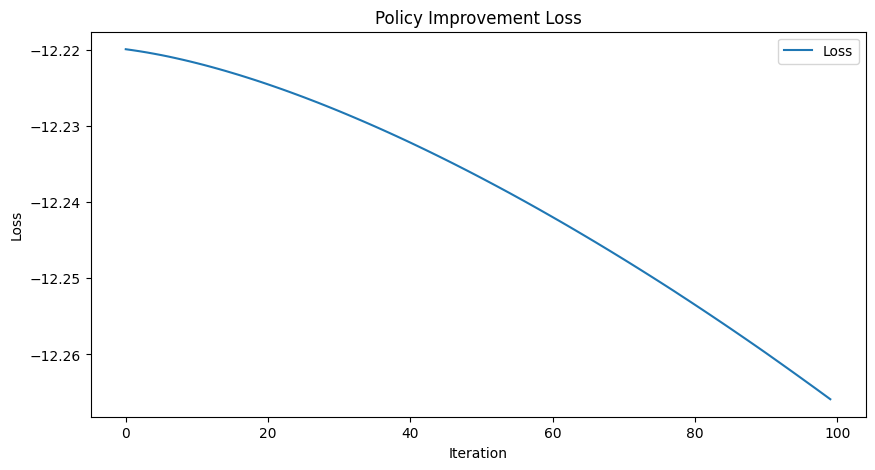

---------------------Sampling Training Data---------------------


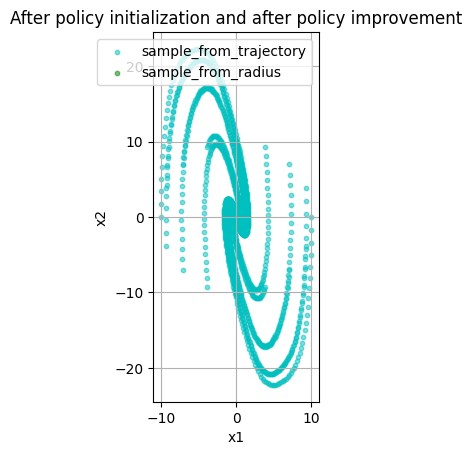

-----------------It takes 214 steps to converge.------------------


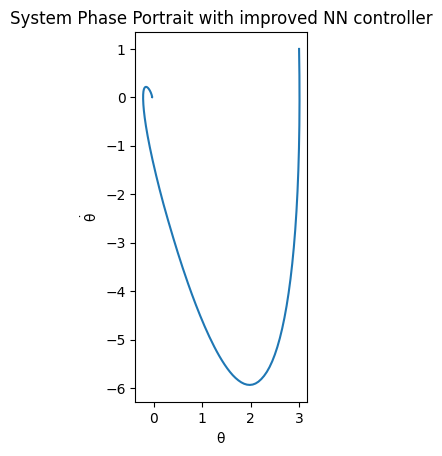

第20次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4880398512
Epoch [2000/10000], Loss: 1.3047606945
Epoch [3000/10000], Loss: 1.2539553642
Epoch [4000/10000], Loss: 1.2366509438
Epoch [5000/10000], Loss: 1.2319486141
Epoch [6000/10000], Loss: 1.2305529118
Epoch [7000/10000], Loss: 1.2296679020
Epoch [8000/10000], Loss: 1.2289801836
Epoch [9000/10000], Loss: 1.2285342216
Epoch [10000/10000], Loss: 1.2279943228


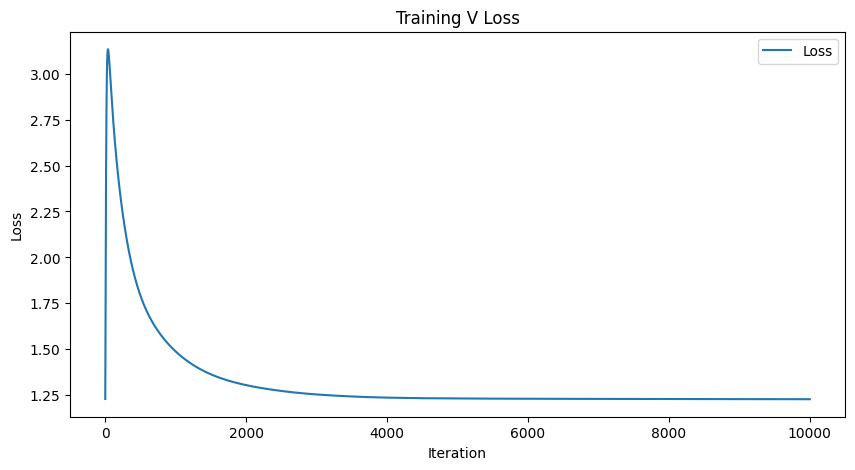

-----------------------Plotting Lyapunov-----------------------


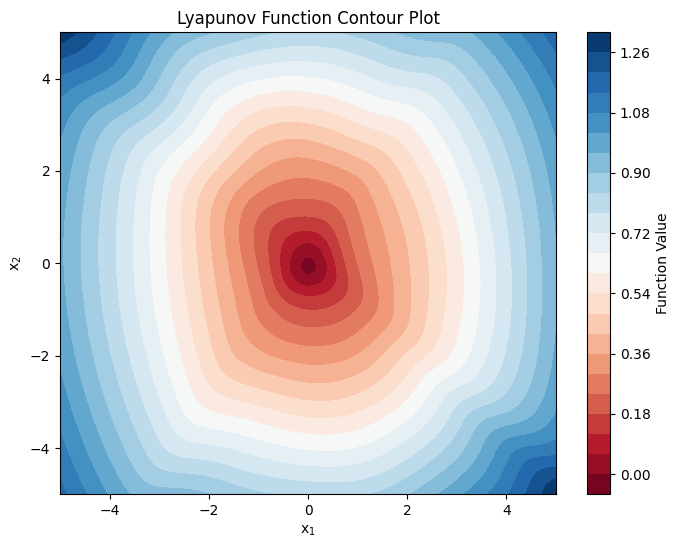

L0:tensor([-0.0149], device='cuda:0', grad_fn=<SelectBackward0>), PD:1.0349866151809692, torch.sum(F.relu(dL)):1789.15234375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.7956082821
Epoch [2000/10000], Loss: 2.7595956326
Epoch [3000/10000], Loss: 2.9046897888
Epoch [4000/10000], Loss: 3.3112277985
Epoch [5000/10000], Loss: 2.8269371986
Epoch [6000/10000], Loss: 2.9449603558
Epoch [7000/10000], Loss: 3.0970058441
Epoch [8000/10000], Loss: 2.7406697273
Epoch [9000/10000], Loss: 2.8463492393
Epoch [10000/10000], Loss: 2.8676671982


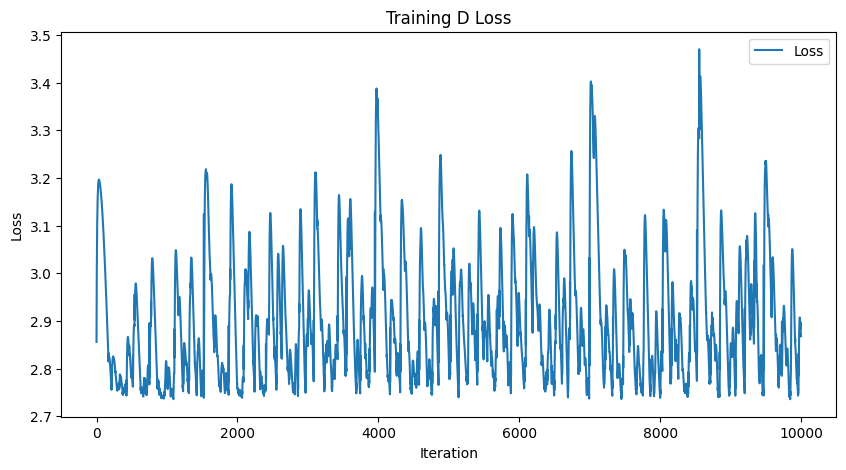

-----------------------Plotting Lyapunov-----------------------


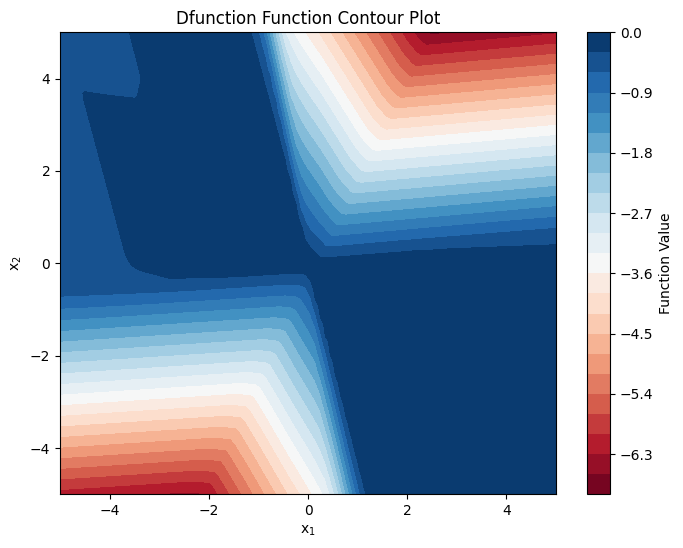

torch.sum(loss_fn(dL, DV_ext)):2.6732242107391357, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0072], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


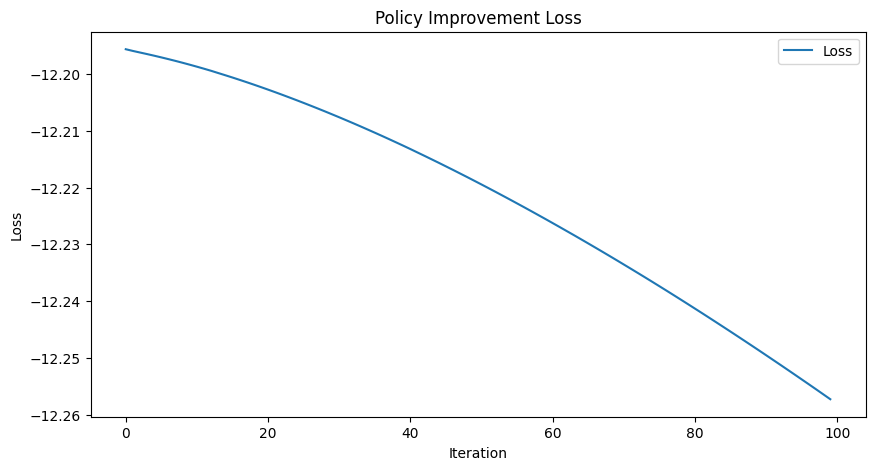

---------------------Sampling Training Data---------------------


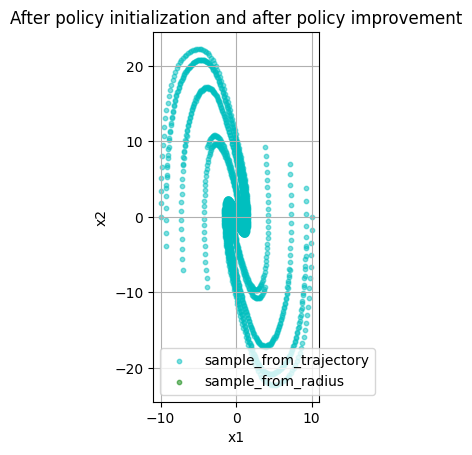

-----------------It takes 212 steps to converge.------------------


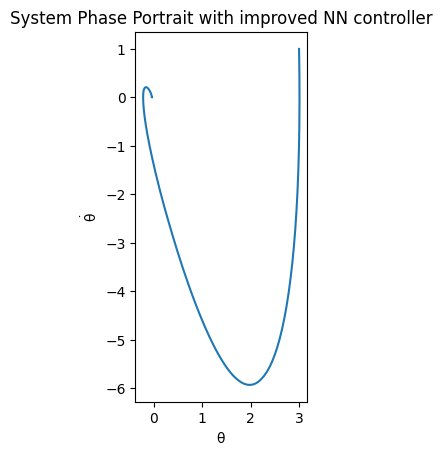

第21次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4781982899
Epoch [2000/10000], Loss: 1.3043061495
Epoch [3000/10000], Loss: 1.2533941269
Epoch [4000/10000], Loss: 1.2336170673
Epoch [5000/10000], Loss: 1.2283593416
Epoch [6000/10000], Loss: 1.2266898155
Epoch [7000/10000], Loss: 1.2257330418
Epoch [8000/10000], Loss: 1.2250113487
Epoch [9000/10000], Loss: 1.2246050835
Epoch [10000/10000], Loss: 1.2241079807


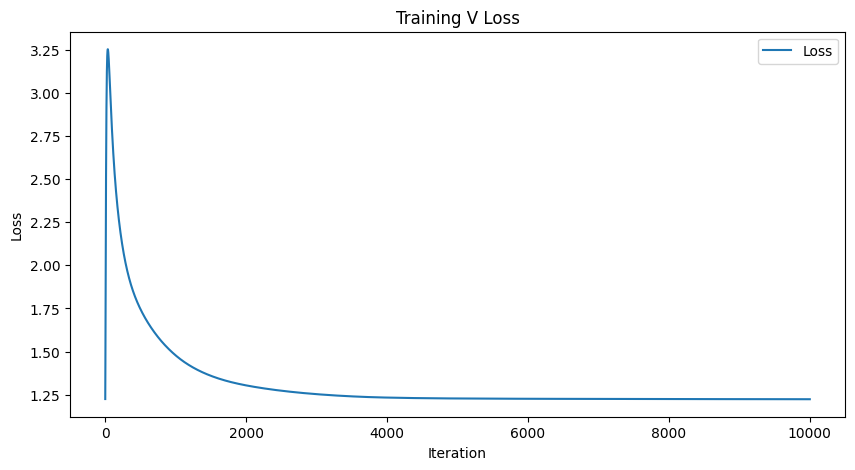

-----------------------Plotting Lyapunov-----------------------


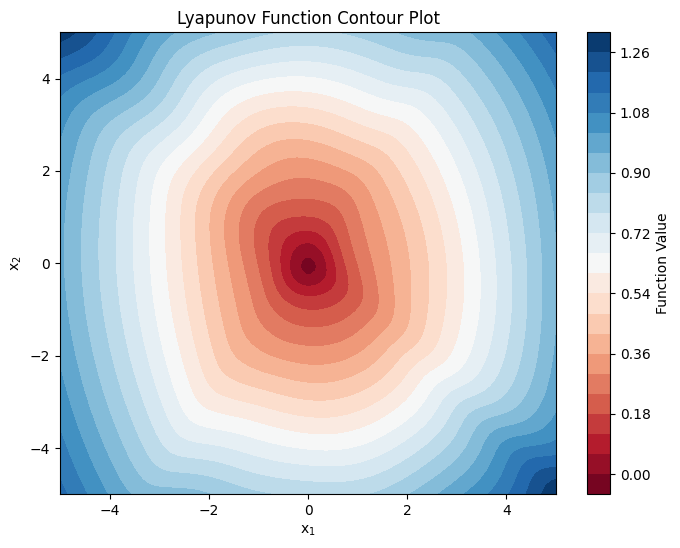

L0:tensor([-0.0155], device='cuda:0', grad_fn=<SelectBackward0>), PD:1.0851402282714844, torch.sum(F.relu(dL)):1779.011474609375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.7921569347
Epoch [2000/10000], Loss: 2.7777023315
Epoch [3000/10000], Loss: 2.7841587067
Epoch [4000/10000], Loss: 2.8300838470
Epoch [5000/10000], Loss: 2.8645825386
Epoch [6000/10000], Loss: 3.0147972107
Epoch [7000/10000], Loss: 2.8405389786
Epoch [8000/10000], Loss: 3.0862972736
Epoch [9000/10000], Loss: 2.7323241234
Epoch [10000/10000], Loss: 2.8132860661


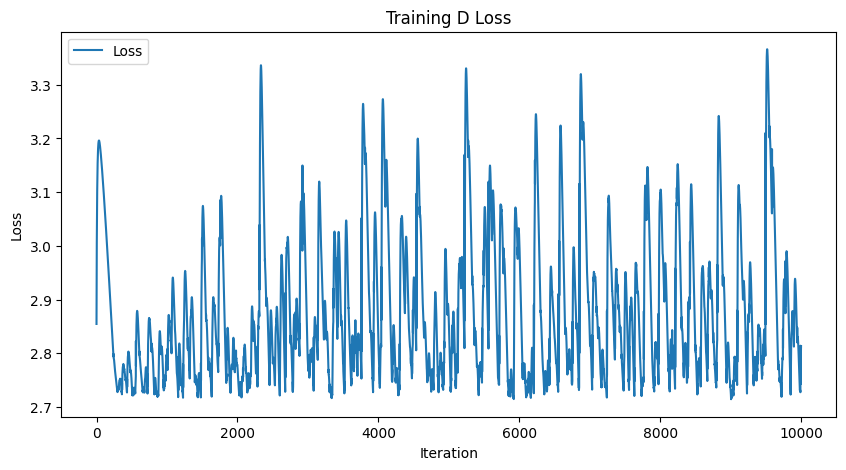

-----------------------Plotting Lyapunov-----------------------


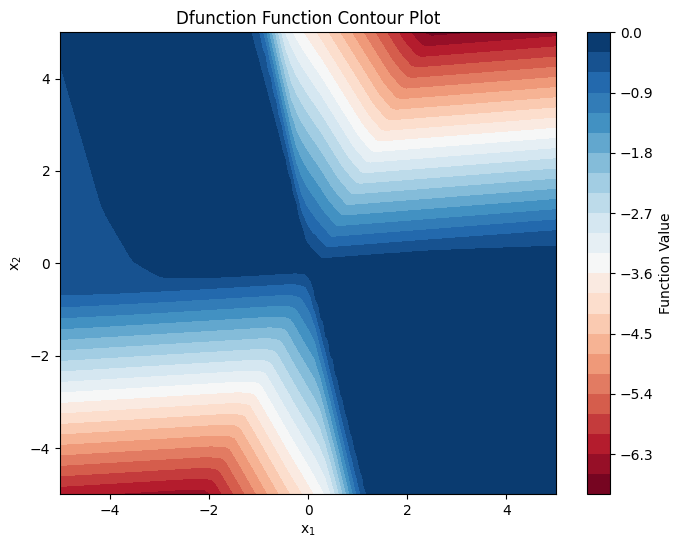

torch.sum(loss_fn(dL, DV_ext)):2.625521183013916, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0071], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


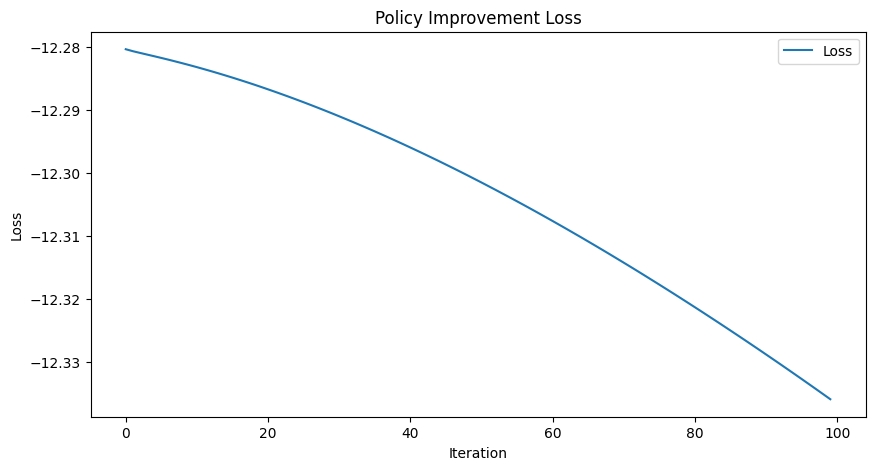

---------------------Sampling Training Data---------------------


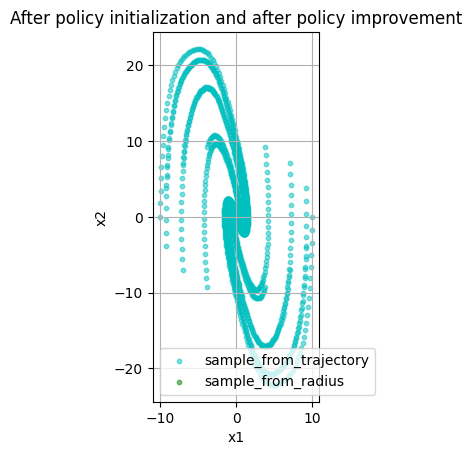

-----------------It takes 210 steps to converge.------------------


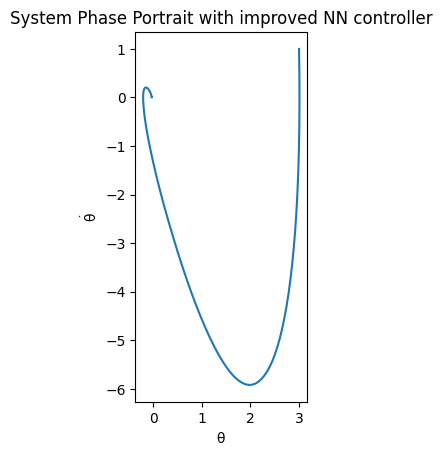

第22次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4746329784
Epoch [2000/10000], Loss: 1.2986800671
Epoch [3000/10000], Loss: 1.2460609674
Epoch [4000/10000], Loss: 1.2282167673
Epoch [5000/10000], Loss: 1.2243945599
Epoch [6000/10000], Loss: 1.2232385874
Epoch [7000/10000], Loss: 1.2223374844
Epoch [8000/10000], Loss: 1.2216895819
Epoch [9000/10000], Loss: 1.2212898731
Epoch [10000/10000], Loss: 1.2208087444


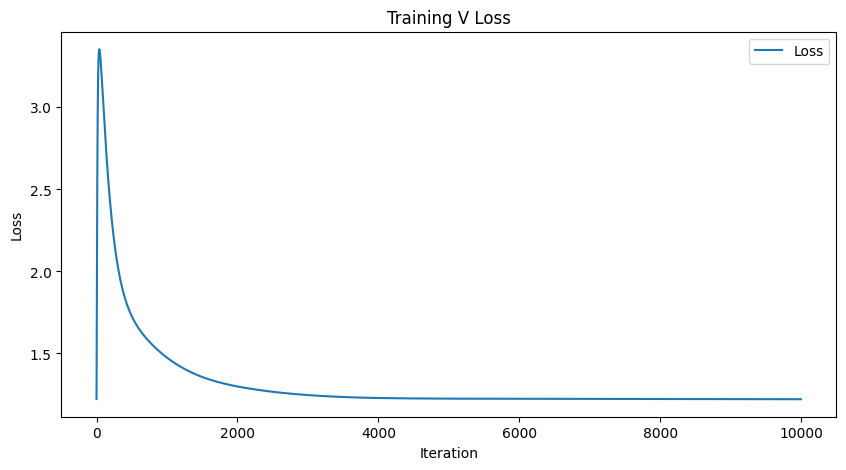

-----------------------Plotting Lyapunov-----------------------


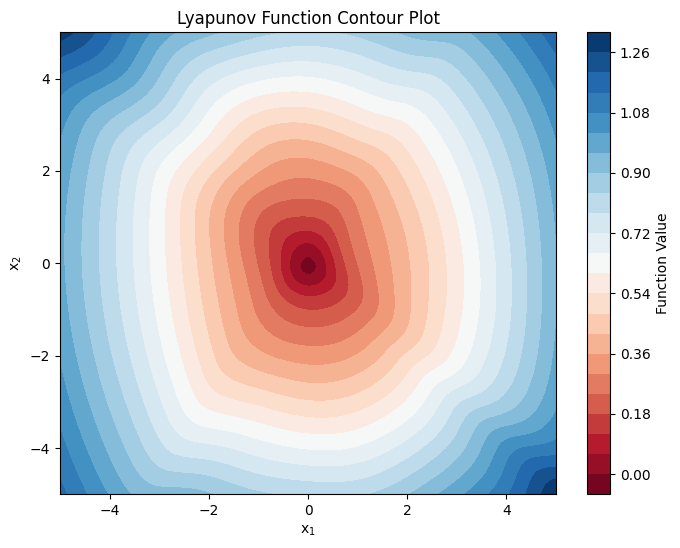

L0:tensor([-0.0162], device='cuda:0', grad_fn=<SelectBackward0>), PD:1.1423795223236084, torch.sum(F.relu(dL)):1769.847412109375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.7990889549
Epoch [2000/10000], Loss: 2.7538170815
Epoch [3000/10000], Loss: 2.8168630600
Epoch [4000/10000], Loss: 3.0294604301
Epoch [5000/10000], Loss: 3.0281627178
Epoch [6000/10000], Loss: 2.7344019413
Epoch [7000/10000], Loss: 3.0327808857
Epoch [8000/10000], Loss: 2.7441995144
Epoch [9000/10000], Loss: 2.7086172104
Epoch [10000/10000], Loss: 2.7252354622


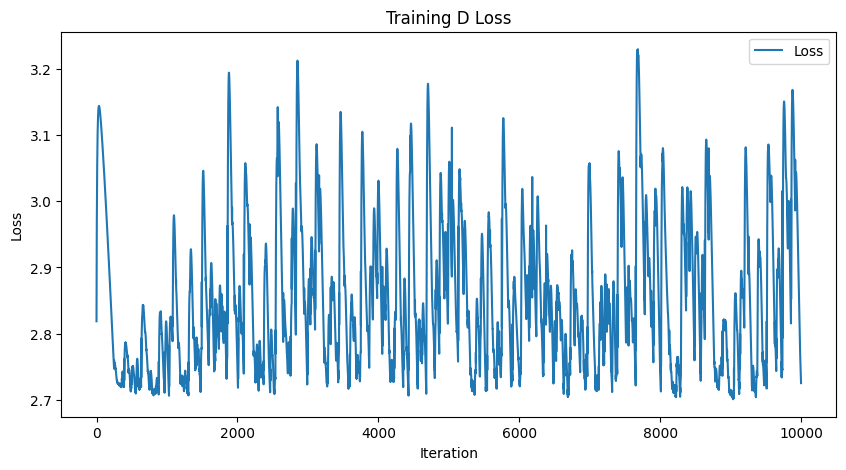

-----------------------Plotting Lyapunov-----------------------


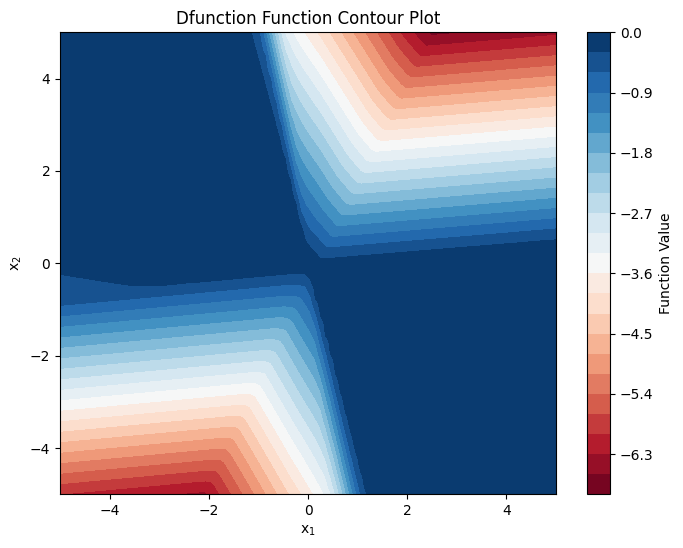

torch.sum(loss_fn(dL, DV_ext)):2.54231595993042, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0072], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


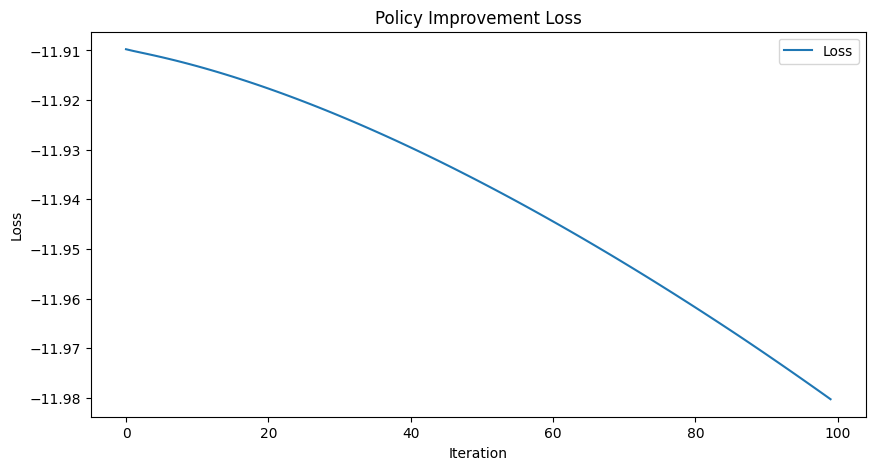

---------------------Sampling Training Data---------------------


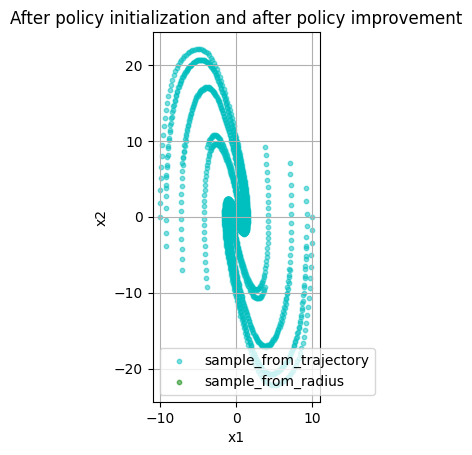

-----------------It takes 207 steps to converge.------------------


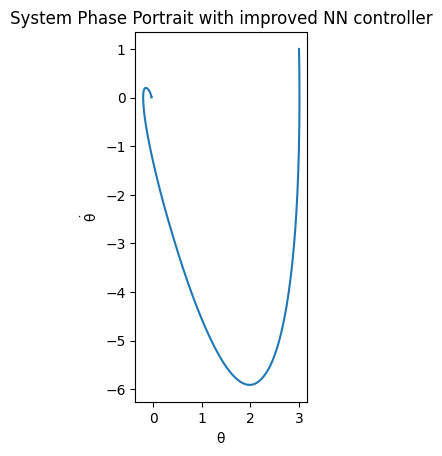

第23次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4480037689
Epoch [2000/10000], Loss: 1.2927445173
Epoch [3000/10000], Loss: 1.2422577143
Epoch [4000/10000], Loss: 1.2251193523
Epoch [5000/10000], Loss: 1.2209419012
Epoch [6000/10000], Loss: 1.2195466757
Epoch [7000/10000], Loss: 1.2186080217
Epoch [8000/10000], Loss: 1.2179874182
Epoch [9000/10000], Loss: 1.2176116705
Epoch [10000/10000], Loss: 1.2171628475


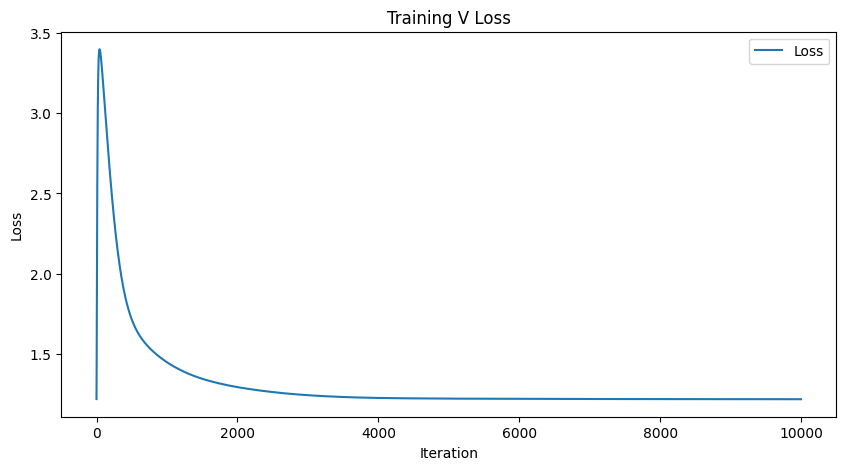

-----------------------Plotting Lyapunov-----------------------


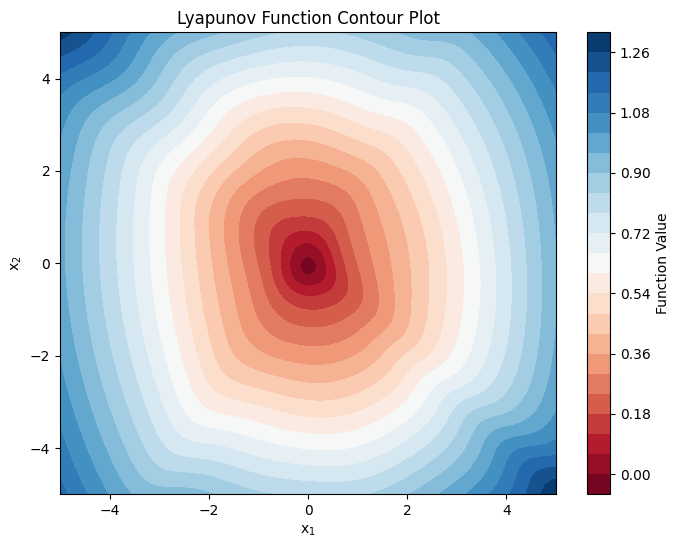

L0:tensor([-0.0167], device='cuda:0', grad_fn=<SelectBackward0>), PD:1.1885697841644287, torch.sum(F.relu(dL)):1759.2496337890625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.7162361145
Epoch [2000/10000], Loss: 2.7546286583
Epoch [3000/10000], Loss: 3.1483809948
Epoch [4000/10000], Loss: 2.7706255913
Epoch [5000/10000], Loss: 3.0224599838
Epoch [6000/10000], Loss: 2.8007318974
Epoch [7000/10000], Loss: 2.7482244968
Epoch [8000/10000], Loss: 3.0013790131
Epoch [9000/10000], Loss: 2.8544740677
Epoch [10000/10000], Loss: 2.8270514011


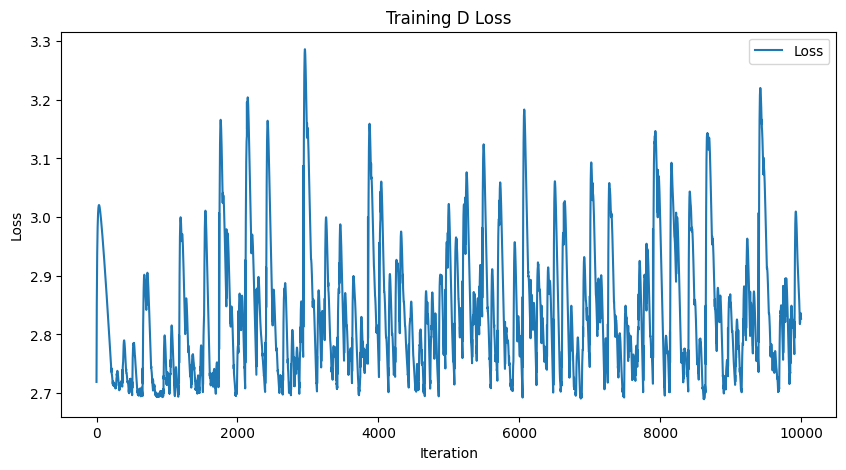

-----------------------Plotting Lyapunov-----------------------


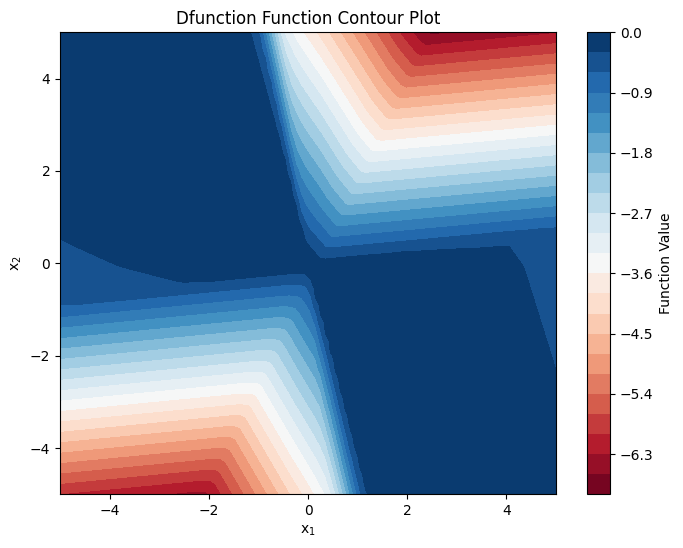

torch.sum(loss_fn(dL, DV_ext)):2.6495048999786377, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0056], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


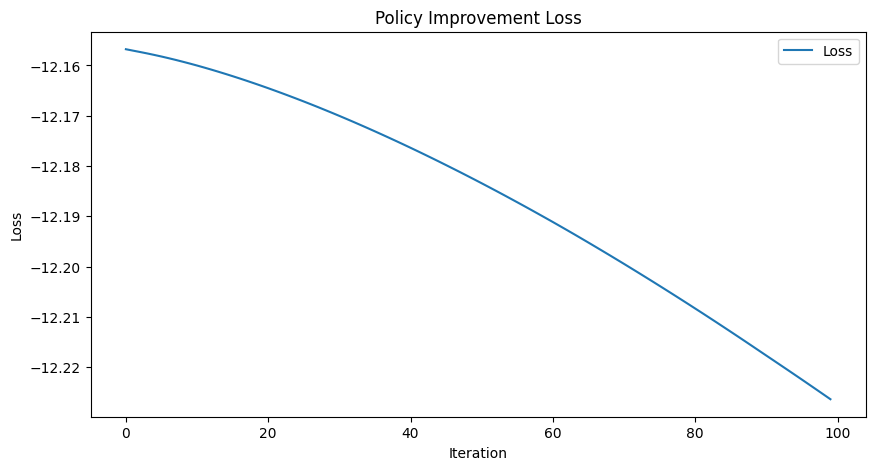

---------------------Sampling Training Data---------------------


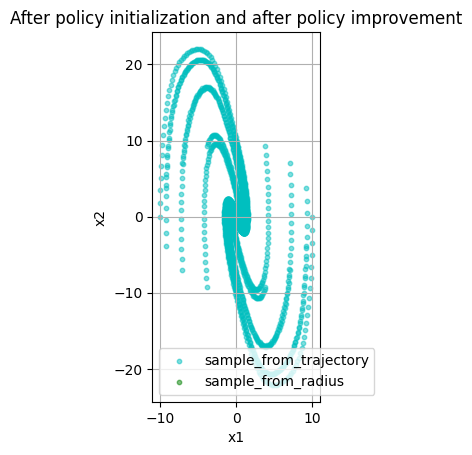

-----------------It takes 200 steps to converge.------------------


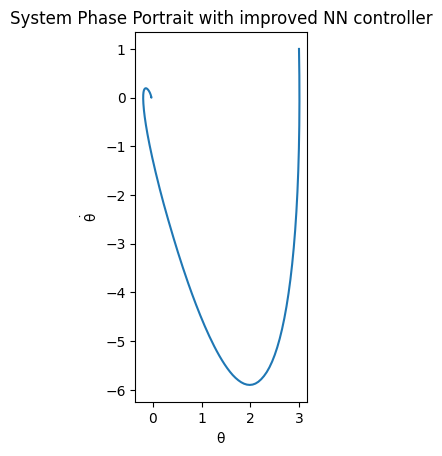

第24次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4398697615
Epoch [2000/10000], Loss: 1.2866561413
Epoch [3000/10000], Loss: 1.2378232479
Epoch [4000/10000], Loss: 1.2217837572
Epoch [5000/10000], Loss: 1.2174242735
Epoch [6000/10000], Loss: 1.2160949707
Epoch [7000/10000], Loss: 1.2151570320
Epoch [8000/10000], Loss: 1.2144732475
Epoch [9000/10000], Loss: 1.2140595913
Epoch [10000/10000], Loss: 1.2136247158


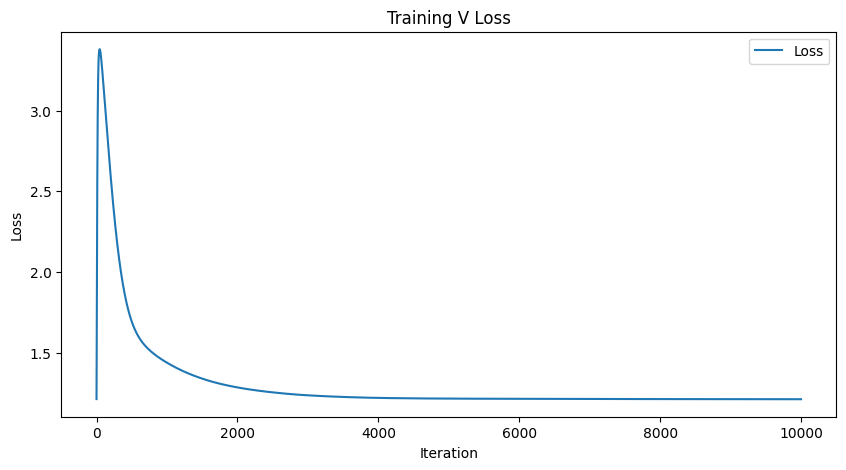

-----------------------Plotting Lyapunov-----------------------


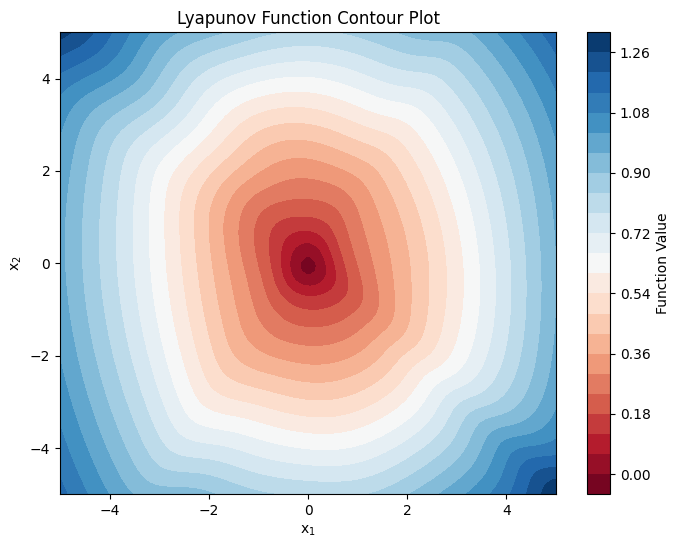

L0:tensor([-0.0169], device='cuda:0', grad_fn=<SelectBackward0>), PD:1.1964499950408936, torch.sum(F.relu(dL)):1748.8603515625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.6811640263
Epoch [2000/10000], Loss: 2.7902464867
Epoch [3000/10000], Loss: 2.6824746132
Epoch [4000/10000], Loss: 2.9918987751
Epoch [5000/10000], Loss: 2.7556853294
Epoch [6000/10000], Loss: 2.7541742325
Epoch [7000/10000], Loss: 2.7140324116
Epoch [8000/10000], Loss: 2.8166735172
Epoch [9000/10000], Loss: 2.7219536304
Epoch [10000/10000], Loss: 2.7749478817


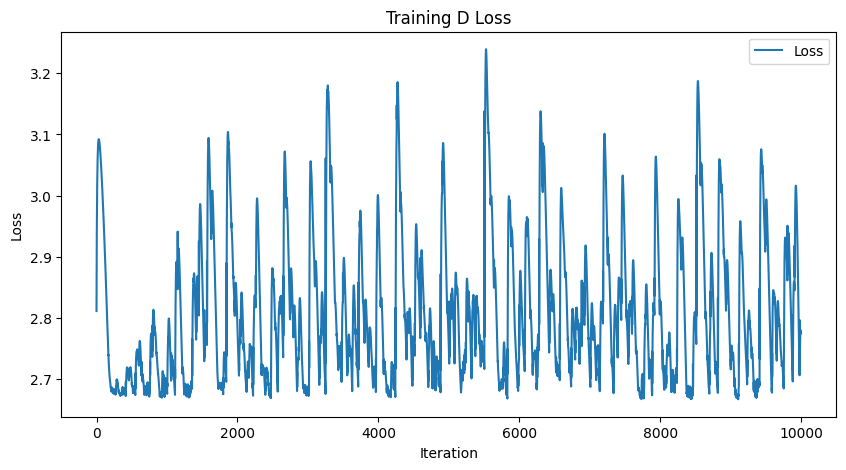

-----------------------Plotting Lyapunov-----------------------


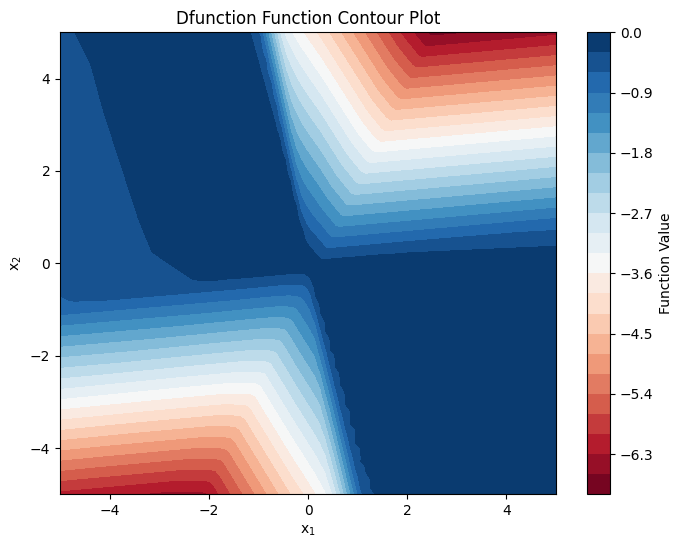

torch.sum(loss_fn(dL, DV_ext)):2.6011292934417725, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0083], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


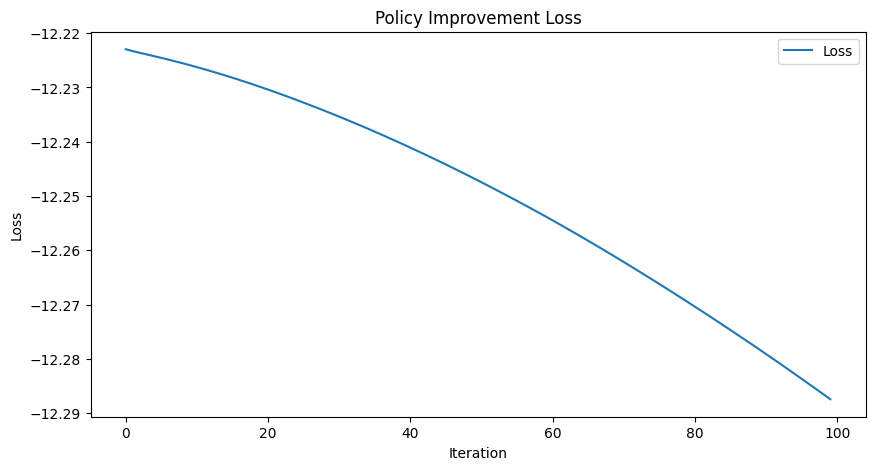

---------------------Sampling Training Data---------------------


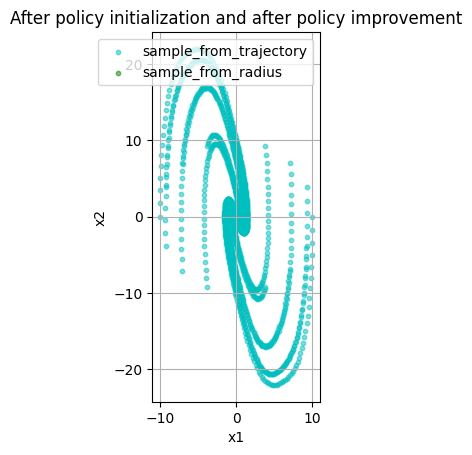

-----------------It takes 160 steps to converge.------------------


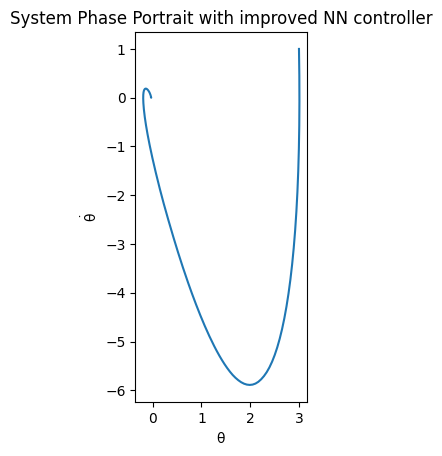

第25次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4294471741
Epoch [2000/10000], Loss: 1.2887332439
Epoch [3000/10000], Loss: 1.2350845337
Epoch [4000/10000], Loss: 1.2176754475
Epoch [5000/10000], Loss: 1.2137490511
Epoch [6000/10000], Loss: 1.2124731541
Epoch [7000/10000], Loss: 1.2116235495
Epoch [8000/10000], Loss: 1.2110679150
Epoch [9000/10000], Loss: 1.2107212543
Epoch [10000/10000], Loss: 1.2103193998


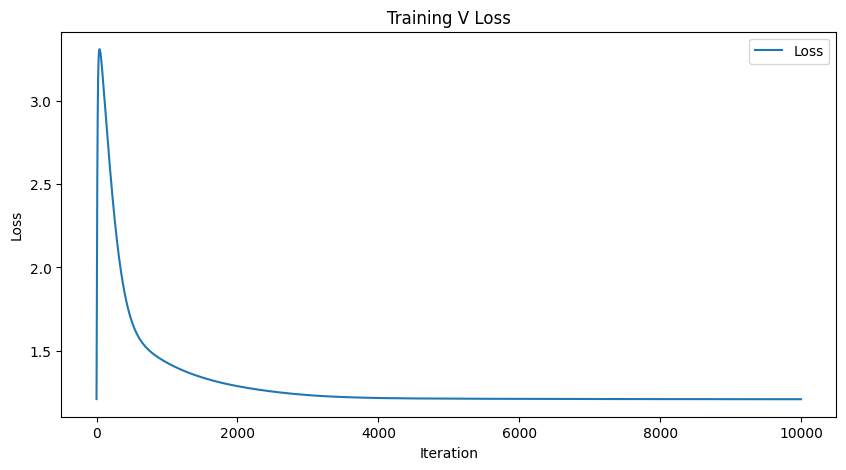

-----------------------Plotting Lyapunov-----------------------


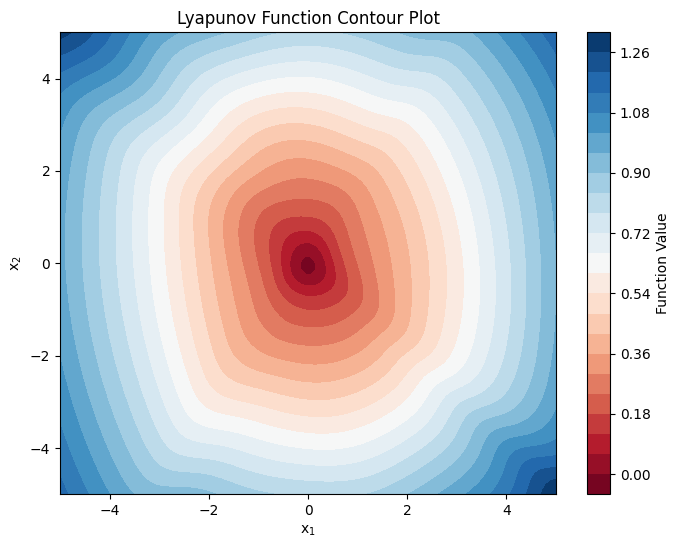

L0:tensor([-0.0171], device='cuda:0', grad_fn=<SelectBackward0>), PD:1.2010557651519775, torch.sum(F.relu(dL)):1738.436767578125
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.7092409134
Epoch [2000/10000], Loss: 2.6938340664
Epoch [3000/10000], Loss: 3.0227782726
Epoch [4000/10000], Loss: 2.8106329441
Epoch [5000/10000], Loss: 3.0772094727
Epoch [6000/10000], Loss: 2.8057708740
Epoch [7000/10000], Loss: 2.8617935181
Epoch [8000/10000], Loss: 2.9022998810
Epoch [9000/10000], Loss: 2.6756715775
Epoch [10000/10000], Loss: 2.6669998169


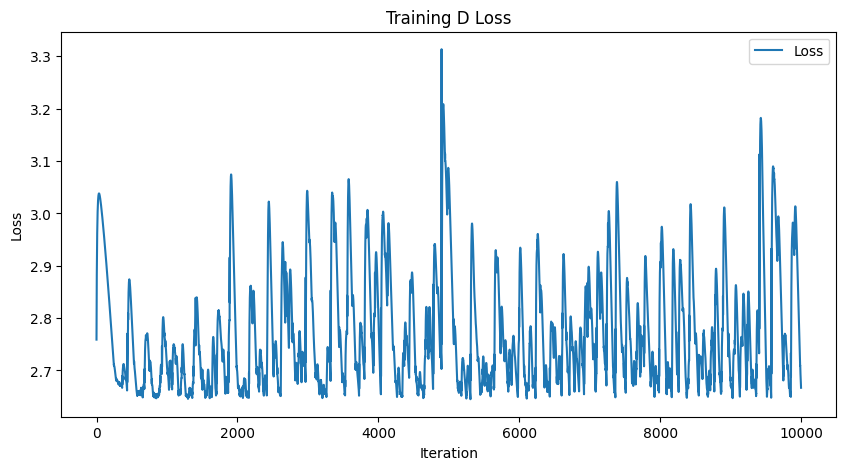

-----------------------Plotting Lyapunov-----------------------


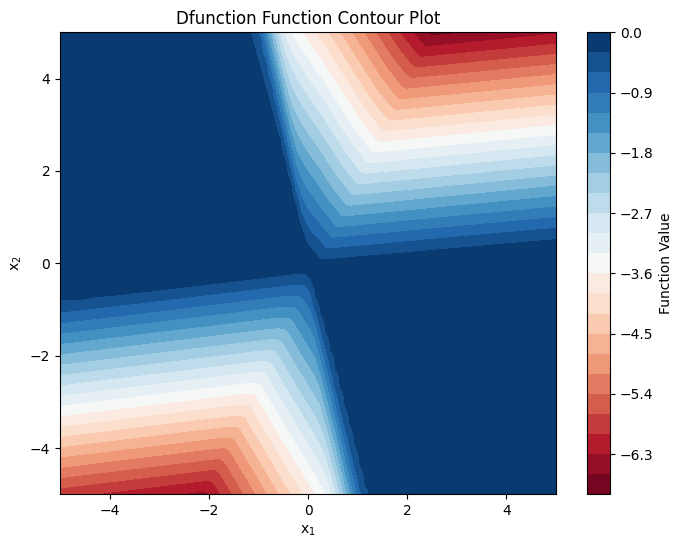

torch.sum(loss_fn(dL, DV_ext)):2.4980316162109375, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0095], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


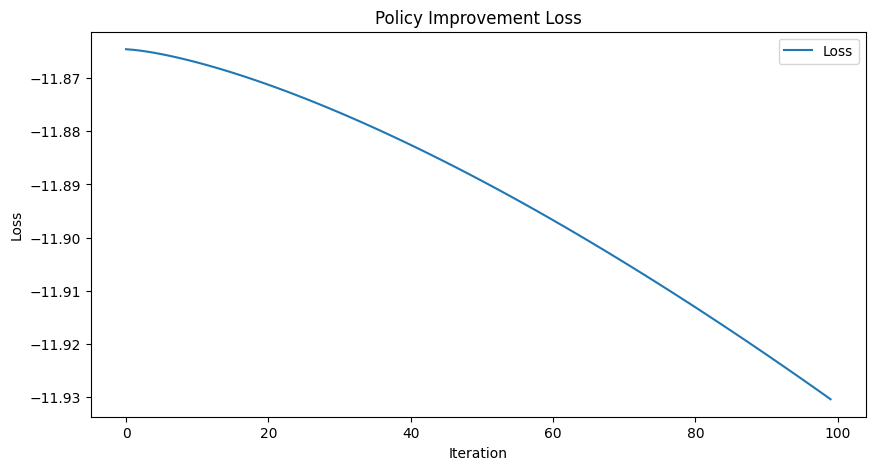

---------------------Sampling Training Data---------------------


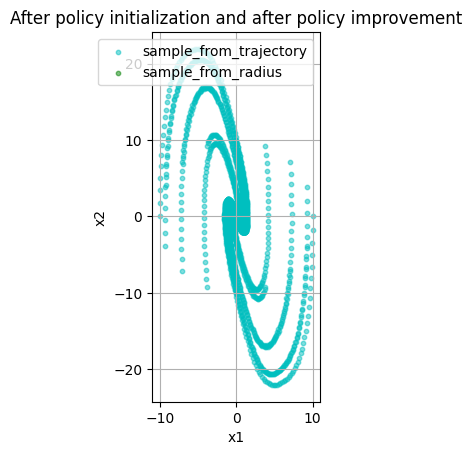

-----------------It takes 156 steps to converge.------------------


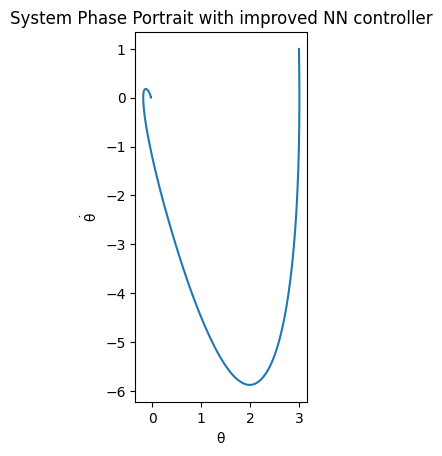

第26次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4190495014
Epoch [2000/10000], Loss: 1.2757780552
Epoch [3000/10000], Loss: 1.2309900522
Epoch [4000/10000], Loss: 1.2154498100
Epoch [5000/10000], Loss: 1.2109572887
Epoch [6000/10000], Loss: 1.2096157074
Epoch [7000/10000], Loss: 1.2087422609
Epoch [8000/10000], Loss: 1.2081365585
Epoch [9000/10000], Loss: 1.2077764273
Epoch [10000/10000], Loss: 1.2073819637


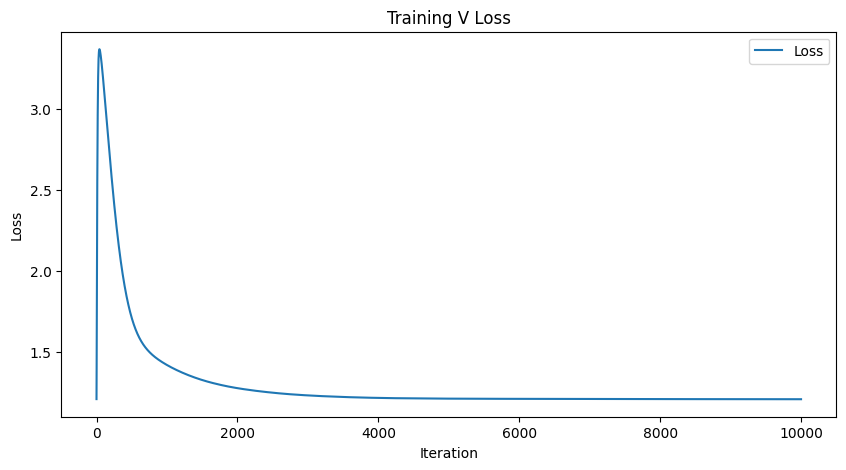

-----------------------Plotting Lyapunov-----------------------


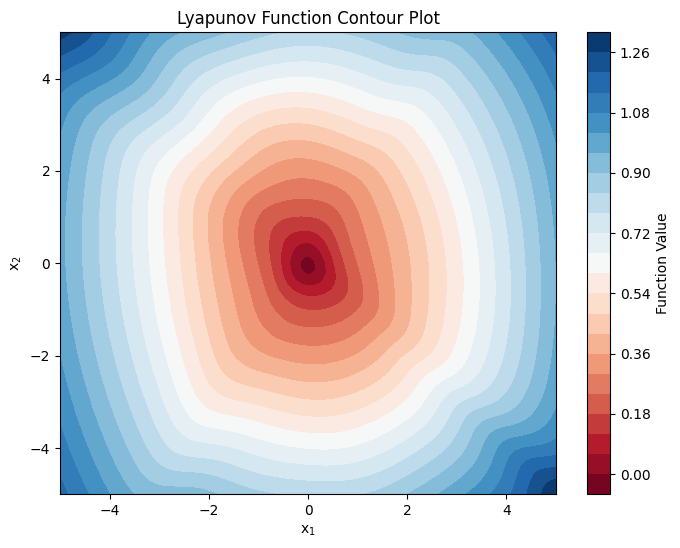

L0:tensor([-0.0170], device='cuda:0', grad_fn=<SelectBackward0>), PD:1.1745409965515137, torch.sum(F.relu(dL)):1729.072265625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.8646059036
Epoch [2000/10000], Loss: 2.8299229145
Epoch [3000/10000], Loss: 2.8047192097
Epoch [4000/10000], Loss: 3.1485941410
Epoch [5000/10000], Loss: 2.7542862892
Epoch [6000/10000], Loss: 2.6908290386
Epoch [7000/10000], Loss: 2.6484947205
Epoch [8000/10000], Loss: 2.7370567322
Epoch [9000/10000], Loss: 2.6872808933
Epoch [10000/10000], Loss: 2.9350345135


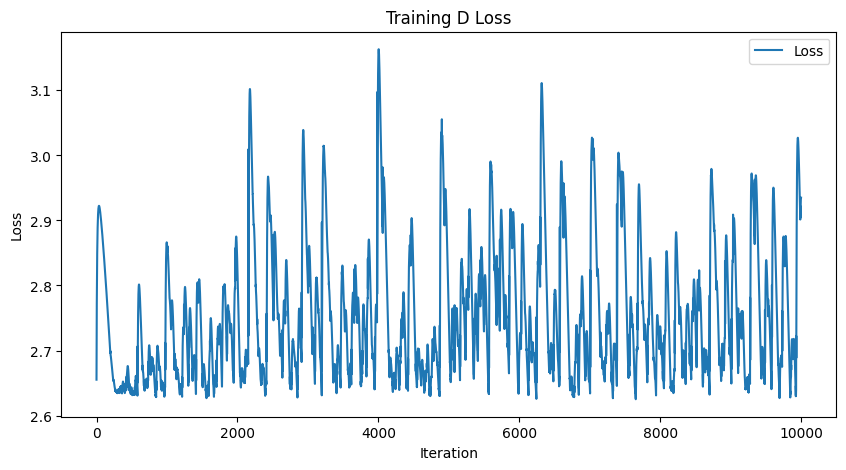

-----------------------Plotting Lyapunov-----------------------


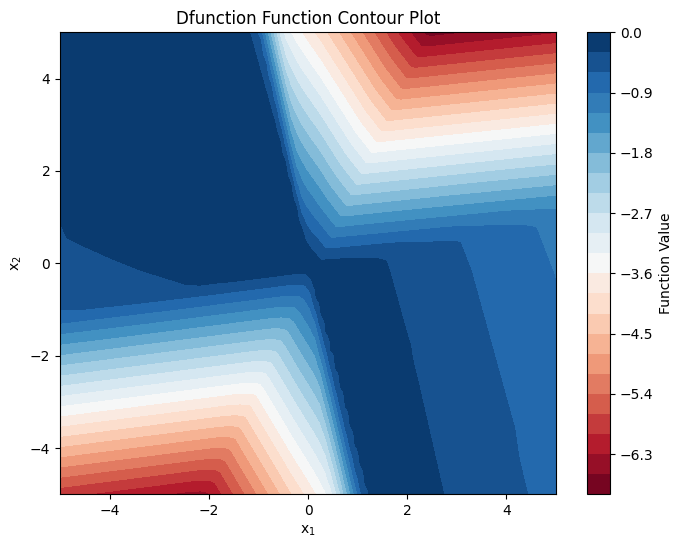

torch.sum(loss_fn(dL, DV_ext)):2.770207405090332, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0111], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


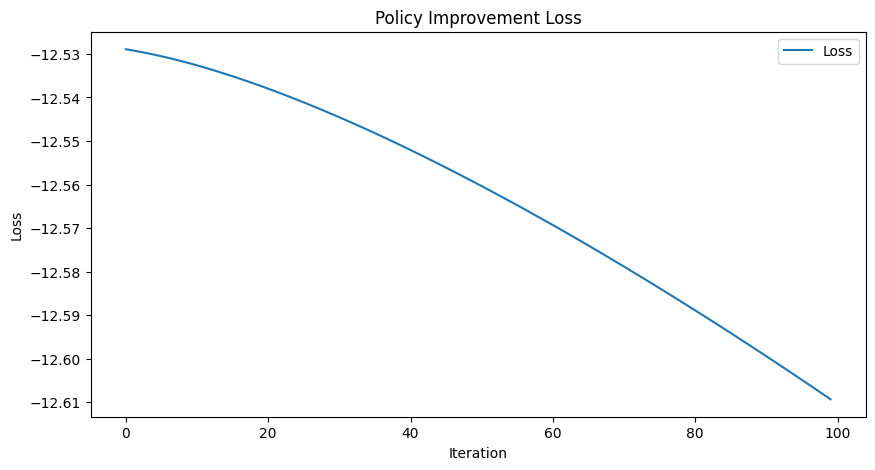

---------------------Sampling Training Data---------------------


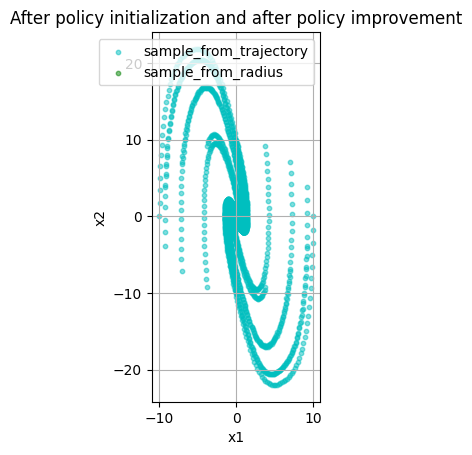

-----------------It takes 154 steps to converge.------------------


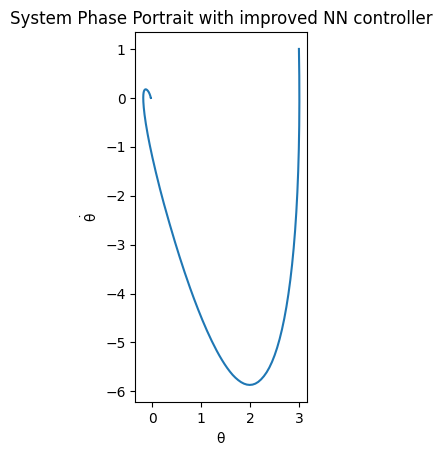

第27次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4069402218
Epoch [2000/10000], Loss: 1.2728689909
Epoch [3000/10000], Loss: 1.2276217937
Epoch [4000/10000], Loss: 1.2116212845
Epoch [5000/10000], Loss: 1.2073199749
Epoch [6000/10000], Loss: 1.2059553862
Epoch [7000/10000], Loss: 1.2051032782
Epoch [8000/10000], Loss: 1.2045282125
Epoch [9000/10000], Loss: 1.2041639090
Epoch [10000/10000], Loss: 1.2037770748


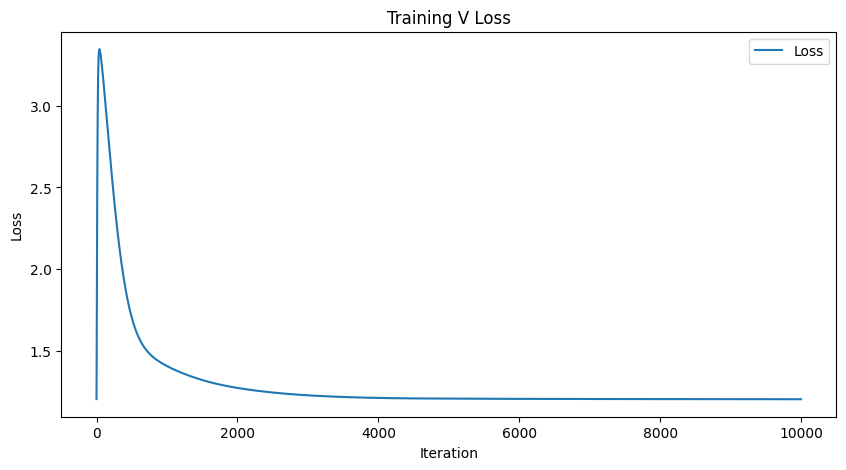

-----------------------Plotting Lyapunov-----------------------


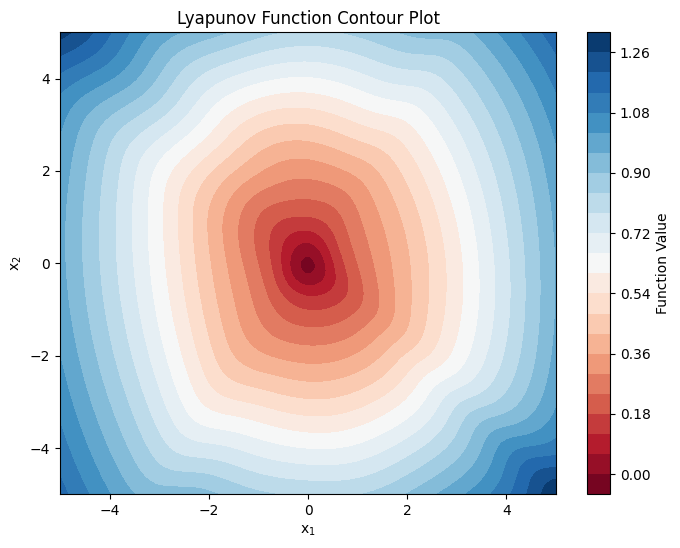

L0:tensor([-0.0170], device='cuda:0', grad_fn=<SelectBackward0>), PD:1.1534814834594727, torch.sum(F.relu(dL)):1716.9127197265625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.7237660885
Epoch [2000/10000], Loss: 2.6747839451
Epoch [3000/10000], Loss: 2.6433238983
Epoch [4000/10000], Loss: 2.8066437244
Epoch [5000/10000], Loss: 2.7106330395
Epoch [6000/10000], Loss: 2.7771356106
Epoch [7000/10000], Loss: 2.9233160019
Epoch [8000/10000], Loss: 2.6588323116
Epoch [9000/10000], Loss: 2.7238695621
Epoch [10000/10000], Loss: 2.6339230537


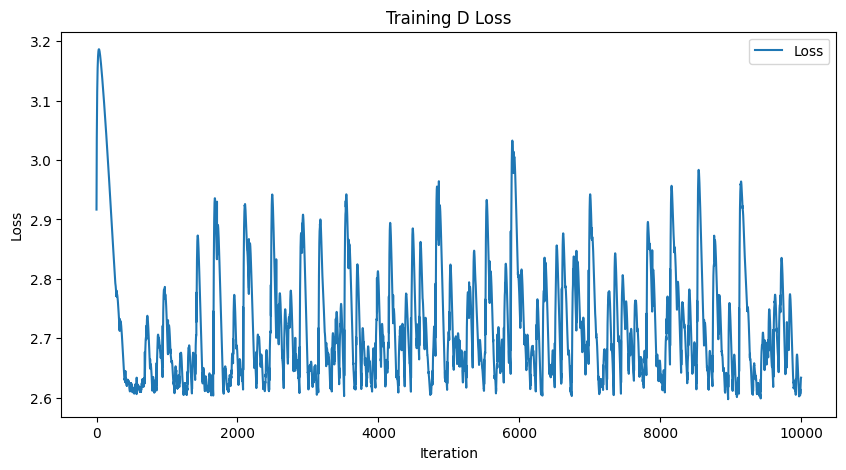

-----------------------Plotting Lyapunov-----------------------


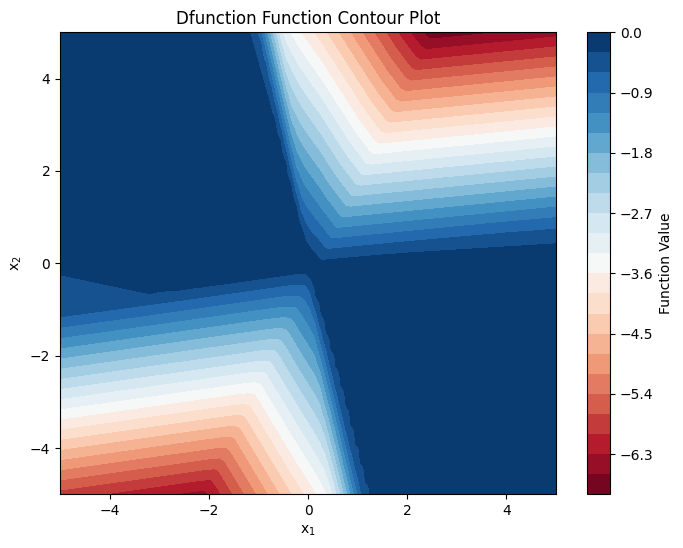

torch.sum(loss_fn(dL, DV_ext)):2.4754257202148438, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0057], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


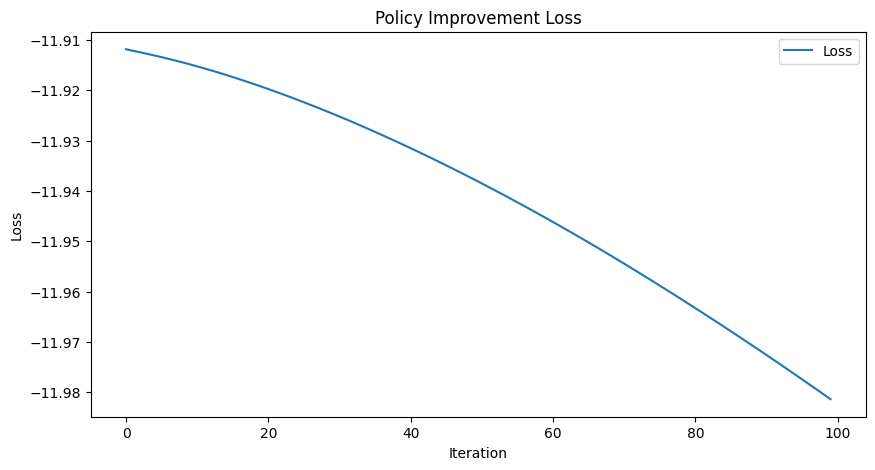

---------------------Sampling Training Data---------------------


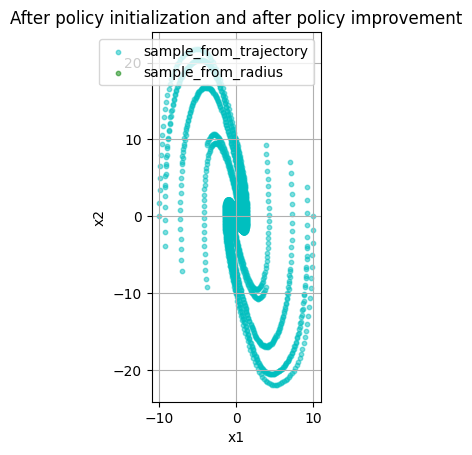

-----------------It takes 153 steps to converge.------------------


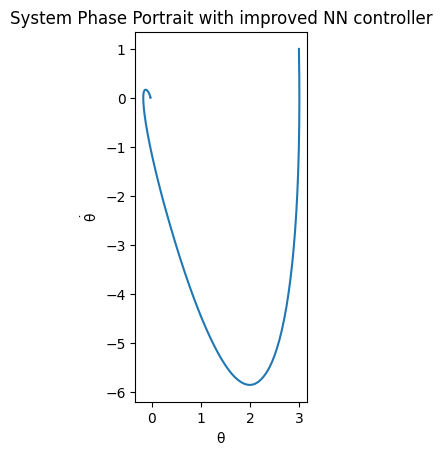

第28次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4003612995
Epoch [2000/10000], Loss: 1.2639207840
Epoch [3000/10000], Loss: 1.2240008116
Epoch [4000/10000], Loss: 1.2097352743
Epoch [5000/10000], Loss: 1.2049189806
Epoch [6000/10000], Loss: 1.2031793594
Epoch [7000/10000], Loss: 1.2021778822
Epoch [8000/10000], Loss: 1.2014477253
Epoch [9000/10000], Loss: 1.2010482550
Epoch [10000/10000], Loss: 1.2006596327


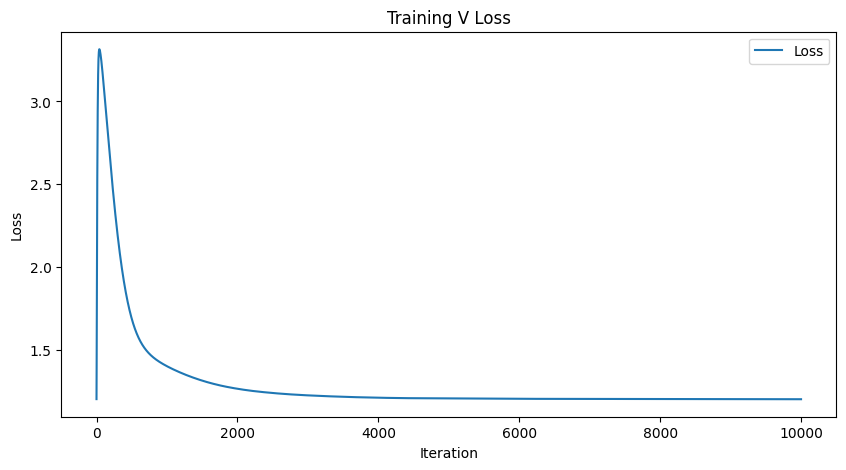

-----------------------Plotting Lyapunov-----------------------


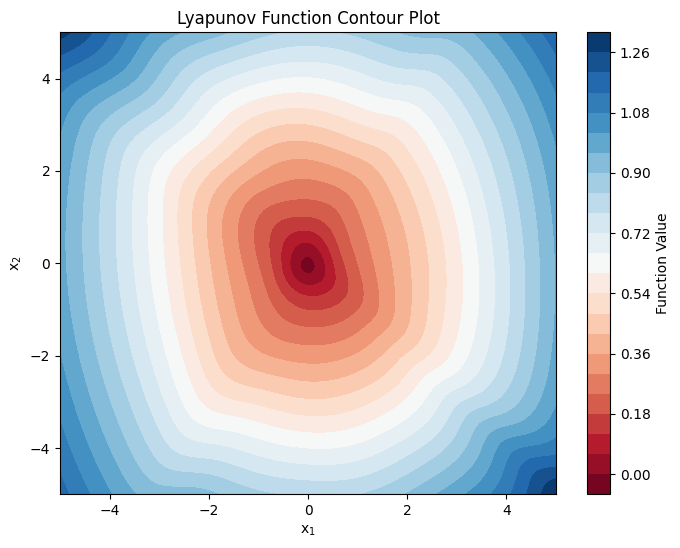

L0:tensor([-0.0170], device='cuda:0', grad_fn=<SelectBackward0>), PD:1.1340999603271484, torch.sum(F.relu(dL)):1706.794677734375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.6662001610
Epoch [2000/10000], Loss: 2.6772110462
Epoch [3000/10000], Loss: 2.6106169224
Epoch [4000/10000], Loss: 2.6417400837
Epoch [5000/10000], Loss: 2.9683587551
Epoch [6000/10000], Loss: 2.7594430447
Epoch [7000/10000], Loss: 2.5936963558
Epoch [8000/10000], Loss: 2.6075372696
Epoch [9000/10000], Loss: 2.7221837044
Epoch [10000/10000], Loss: 2.6004662514


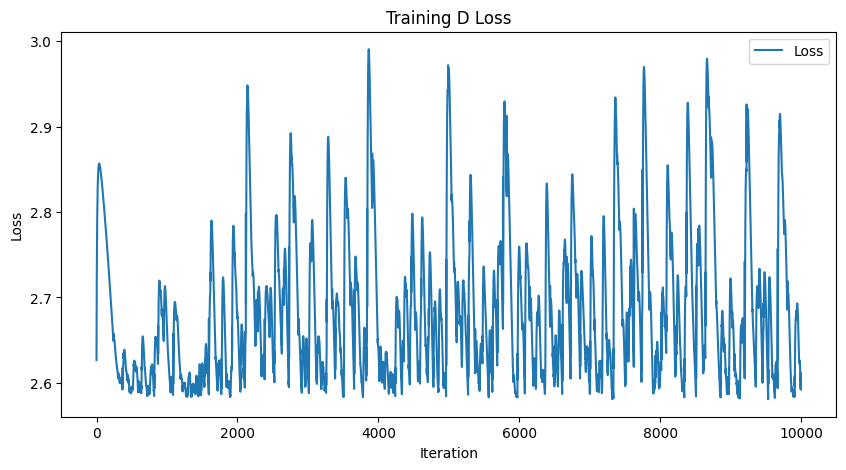

-----------------------Plotting Lyapunov-----------------------


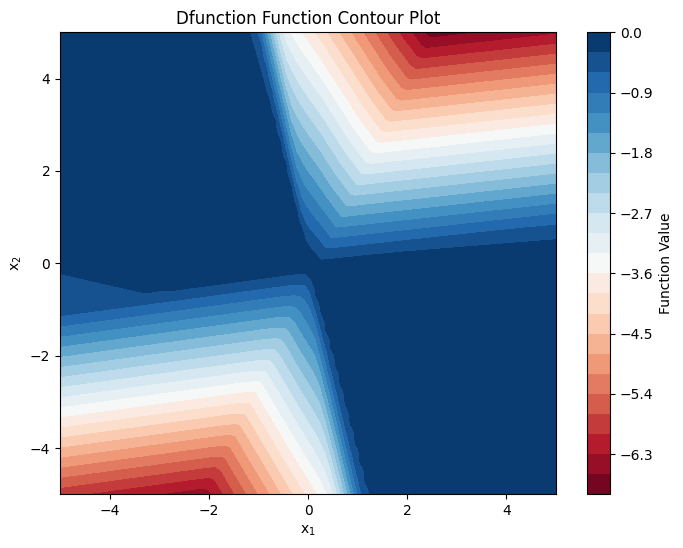

torch.sum(loss_fn(dL, DV_ext)):2.445572853088379, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0049], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


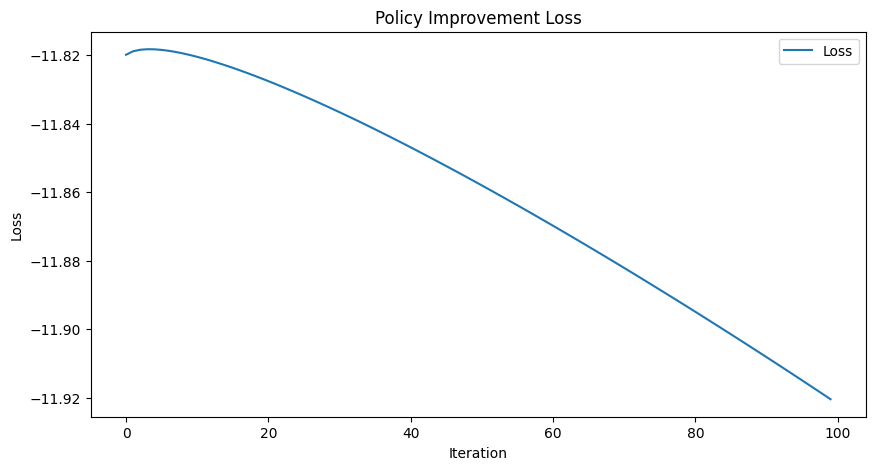

---------------------Sampling Training Data---------------------


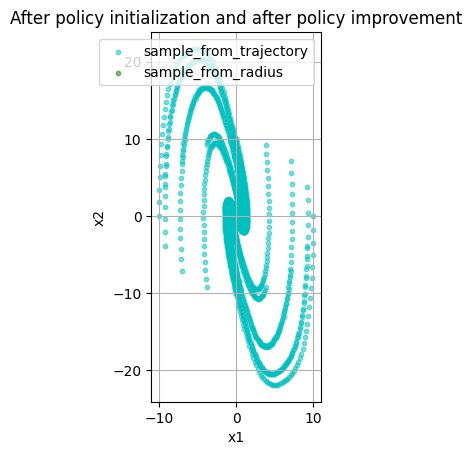

-----------------It takes 153 steps to converge.------------------


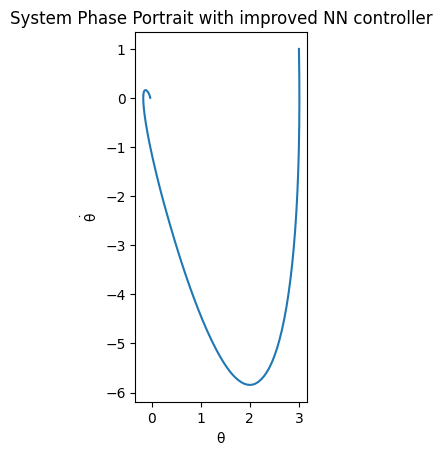

第29次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.3994164467
Epoch [2000/10000], Loss: 1.2636489868
Epoch [3000/10000], Loss: 1.2196027040
Epoch [4000/10000], Loss: 1.2045105696
Epoch [5000/10000], Loss: 1.2004714012
Epoch [6000/10000], Loss: 1.1990205050
Epoch [7000/10000], Loss: 1.1981674433
Epoch [8000/10000], Loss: 1.1975919008
Epoch [9000/10000], Loss: 1.1972471476
Epoch [10000/10000], Loss: 1.1968694925


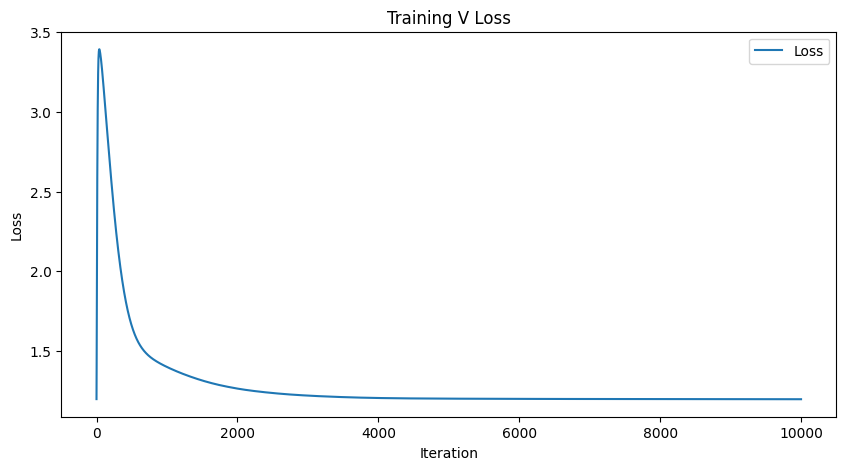

-----------------------Plotting Lyapunov-----------------------


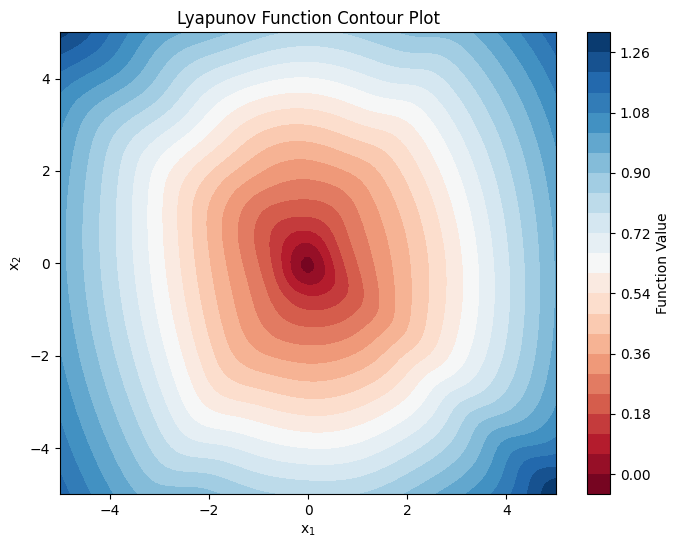

L0:tensor([-0.0164], device='cuda:0', grad_fn=<SelectBackward0>), PD:1.0627970695495605, torch.sum(F.relu(dL)):1693.24560546875
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.6730177402
Epoch [2000/10000], Loss: 2.7548062801
Epoch [3000/10000], Loss: 2.8879215717
Epoch [4000/10000], Loss: 2.7358705997
Epoch [5000/10000], Loss: 2.7893302441
Epoch [6000/10000], Loss: 2.5672562122
Epoch [7000/10000], Loss: 2.6082112789
Epoch [8000/10000], Loss: 2.5934522152
Epoch [9000/10000], Loss: 2.5740666389
Epoch [10000/10000], Loss: 2.5940387249


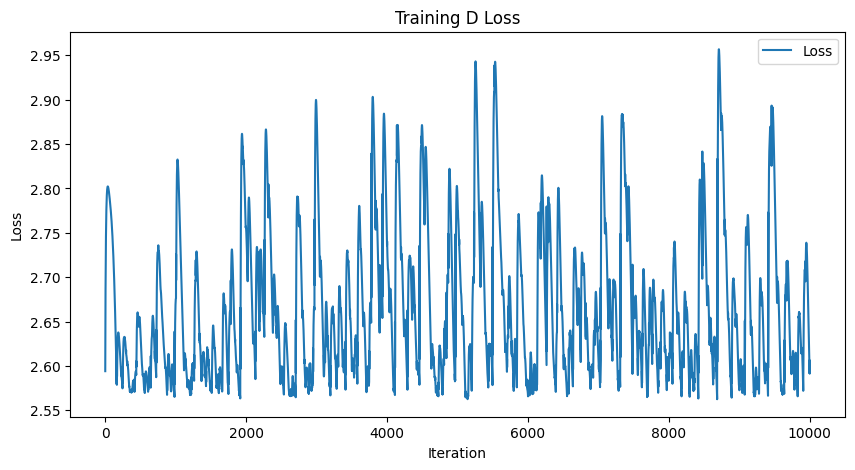

-----------------------Plotting Lyapunov-----------------------


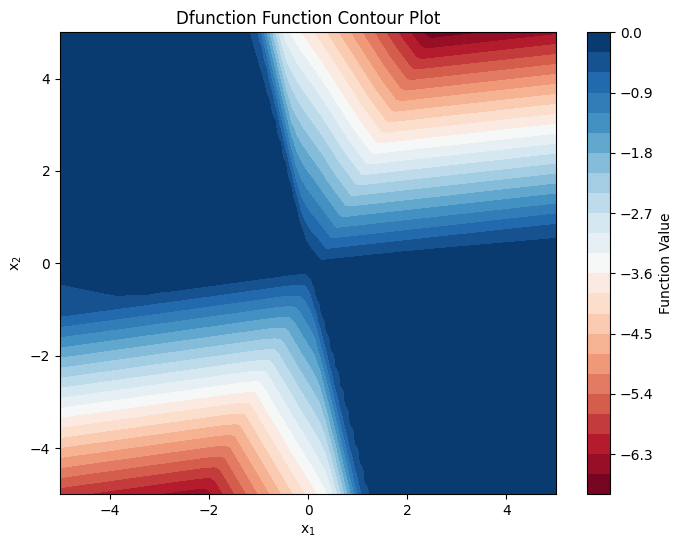

torch.sum(loss_fn(dL, DV_ext)):2.443810224533081, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0051], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


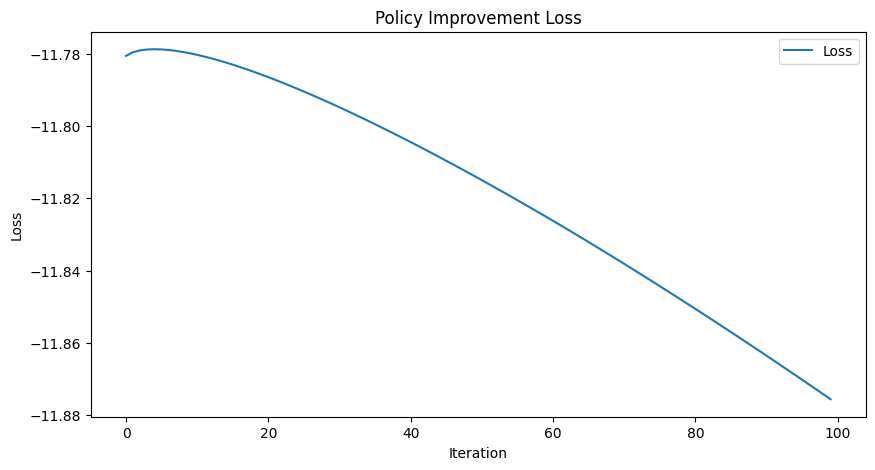

---------------------Sampling Training Data---------------------


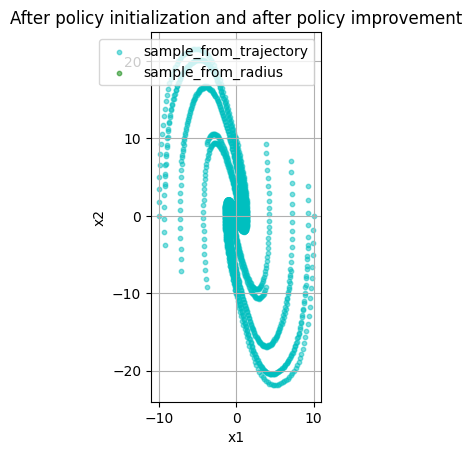

-----------------It takes 152 steps to converge.------------------


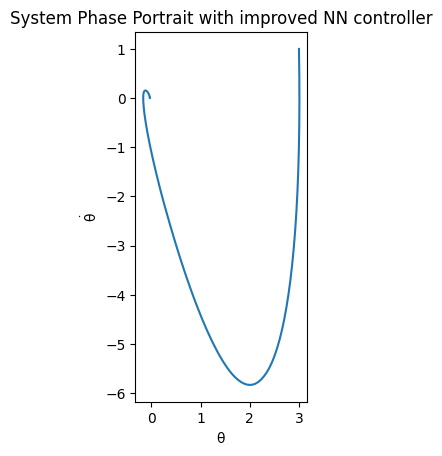

第30次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.3842508793
Epoch [2000/10000], Loss: 1.2565135956
Epoch [3000/10000], Loss: 1.2153805494
Epoch [4000/10000], Loss: 1.2010564804
Epoch [5000/10000], Loss: 1.1971338987
Epoch [6000/10000], Loss: 1.1956679821
Epoch [7000/10000], Loss: 1.1947664022
Epoch [8000/10000], Loss: 1.1941437721
Epoch [9000/10000], Loss: 1.1937615871
Epoch [10000/10000], Loss: 1.1933569908


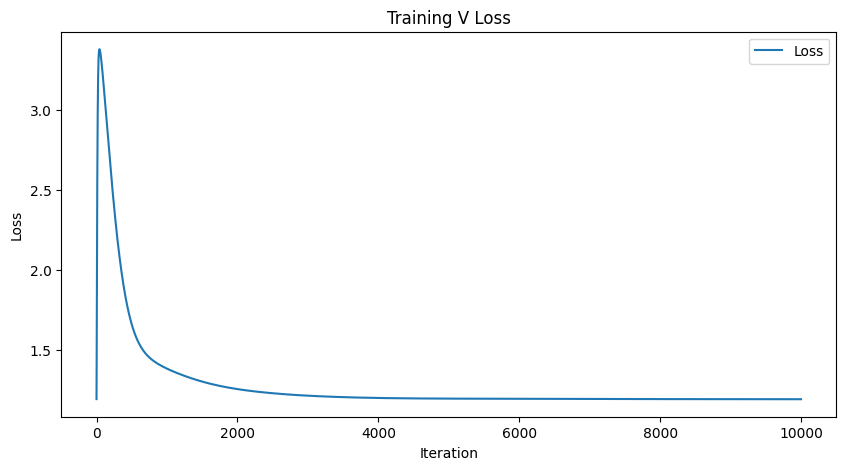

-----------------------Plotting Lyapunov-----------------------


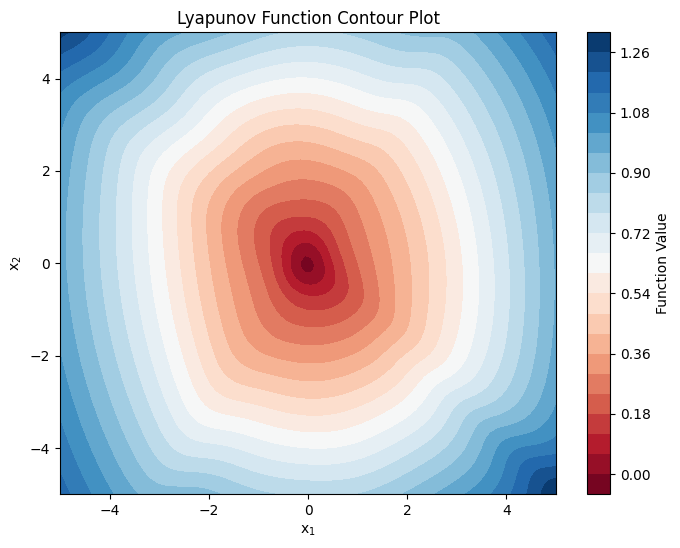

L0:tensor([-0.0158], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.9948203563690186, torch.sum(F.relu(dL)):1680.659912109375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.6215250492
Epoch [2000/10000], Loss: 2.7240278721
Epoch [3000/10000], Loss: 2.6070506573
Epoch [4000/10000], Loss: 2.5750629902
Epoch [5000/10000], Loss: 2.6245138645
Epoch [6000/10000], Loss: 2.5633578300
Epoch [7000/10000], Loss: 2.7533421516
Epoch [8000/10000], Loss: 2.6439375877
Epoch [9000/10000], Loss: 2.6110153198
Epoch [10000/10000], Loss: 2.7145199776


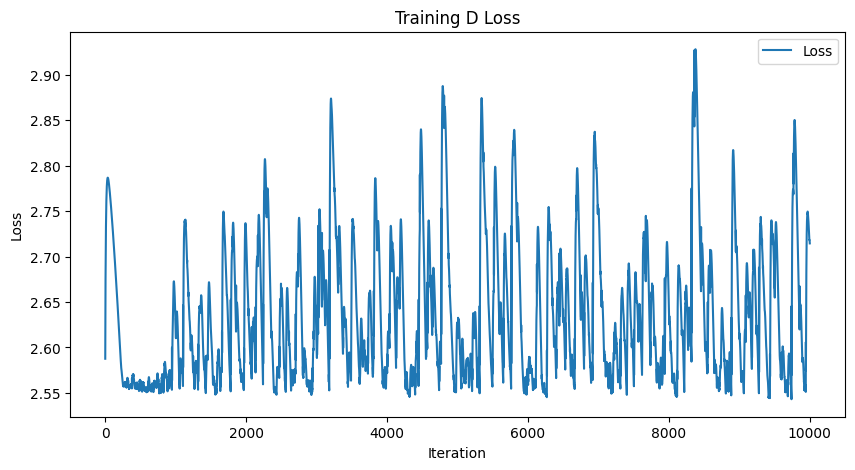

-----------------------Plotting Lyapunov-----------------------


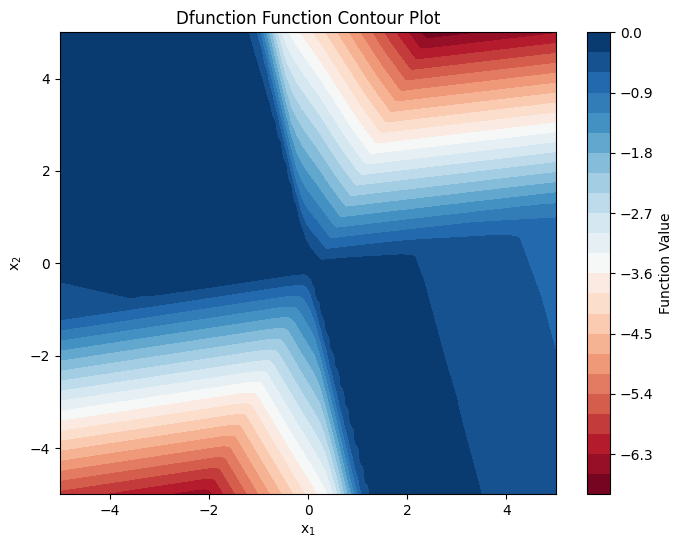

torch.sum(loss_fn(dL, DV_ext)):2.567446231842041, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0088], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


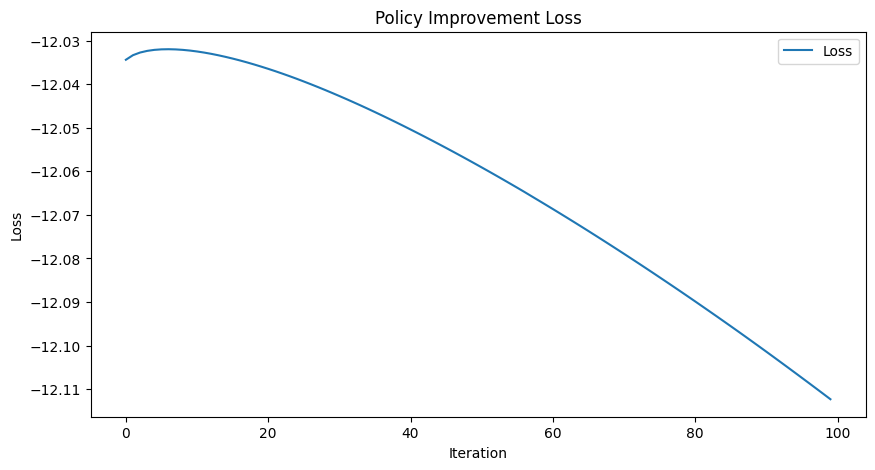

---------------------Sampling Training Data---------------------


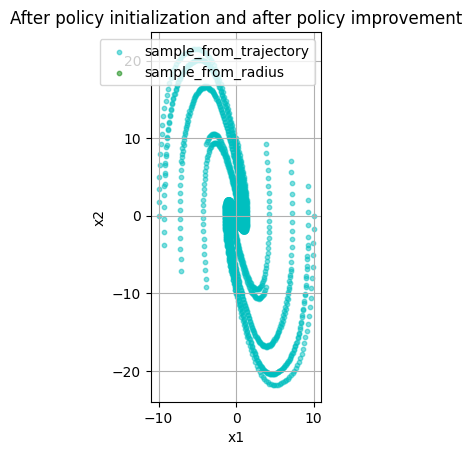

-----------------It takes 152 steps to converge.------------------


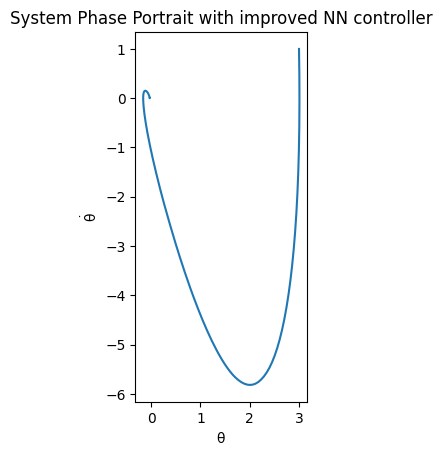

第31次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.3691543341
Epoch [2000/10000], Loss: 1.2579479218
Epoch [3000/10000], Loss: 1.2131899595
Epoch [4000/10000], Loss: 1.1977969408
Epoch [5000/10000], Loss: 1.1938488483
Epoch [6000/10000], Loss: 1.1924984455
Epoch [7000/10000], Loss: 1.1917021275
Epoch [8000/10000], Loss: 1.1912035942
Epoch [9000/10000], Loss: 1.1908545494
Epoch [10000/10000], Loss: 1.1904685497


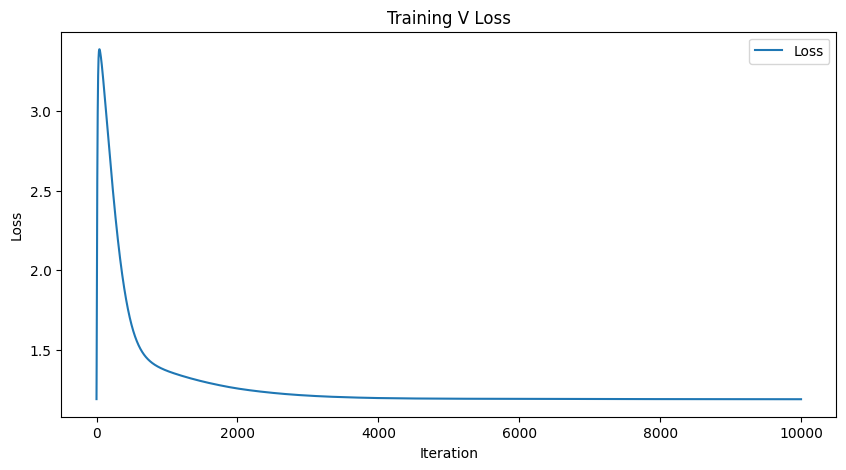

-----------------------Plotting Lyapunov-----------------------


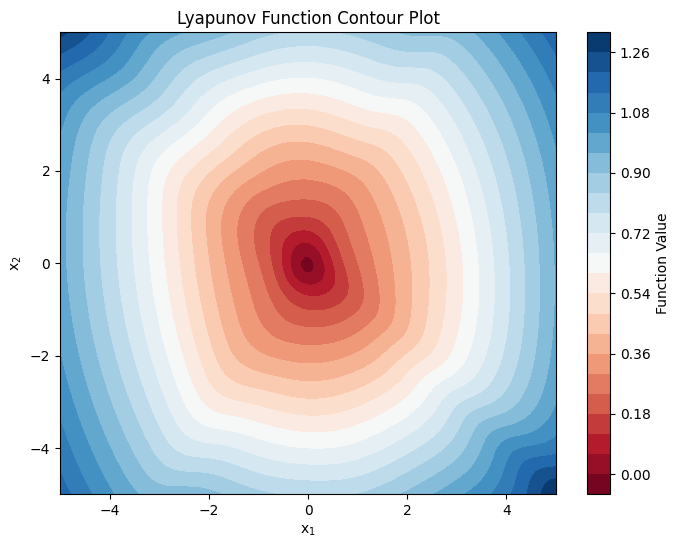

L0:tensor([-0.0152], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.9326362609863281, torch.sum(F.relu(dL)):1670.943359375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.5926861763
Epoch [2000/10000], Loss: 2.6194374561
Epoch [3000/10000], Loss: 2.6717987061
Epoch [4000/10000], Loss: 2.6732277870
Epoch [5000/10000], Loss: 2.7065191269
Epoch [6000/10000], Loss: 2.6506576538
Epoch [7000/10000], Loss: 2.6280839443
Epoch [8000/10000], Loss: 2.5592262745
Epoch [9000/10000], Loss: 2.5301072598
Epoch [10000/10000], Loss: 2.5648338795


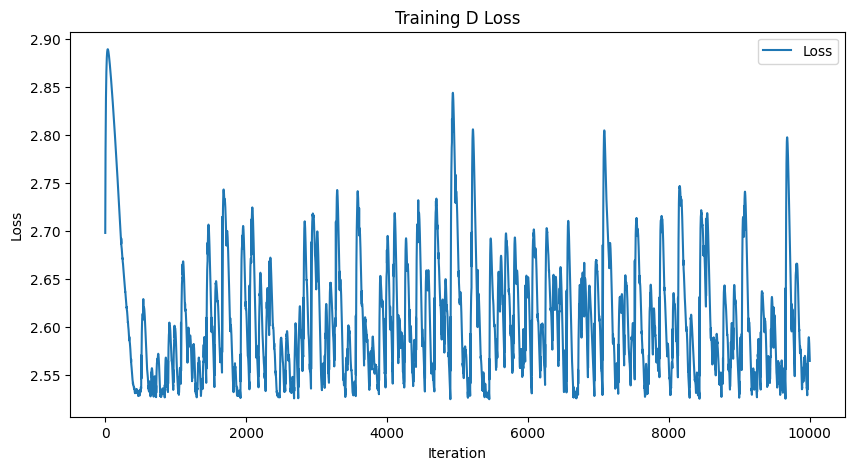

-----------------------Plotting Lyapunov-----------------------


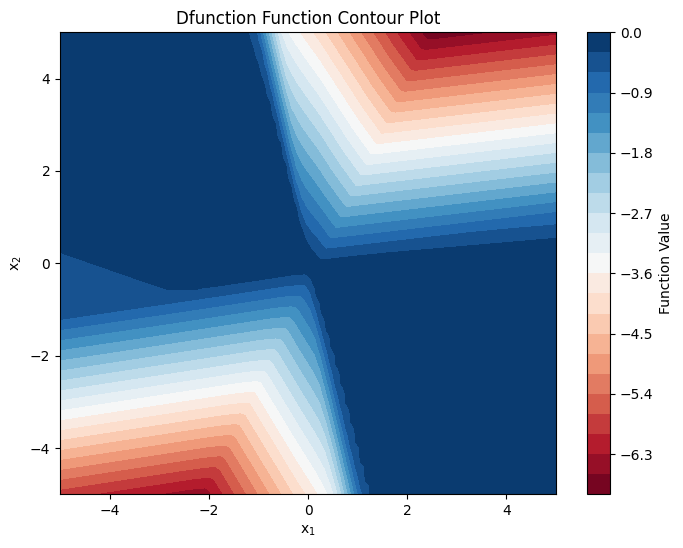

torch.sum(loss_fn(dL, DV_ext)):2.4223697185516357, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0044], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


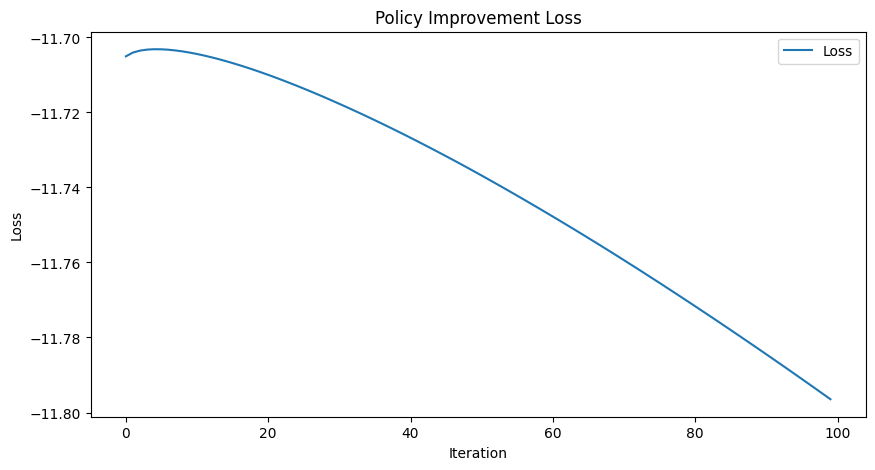

---------------------Sampling Training Data---------------------


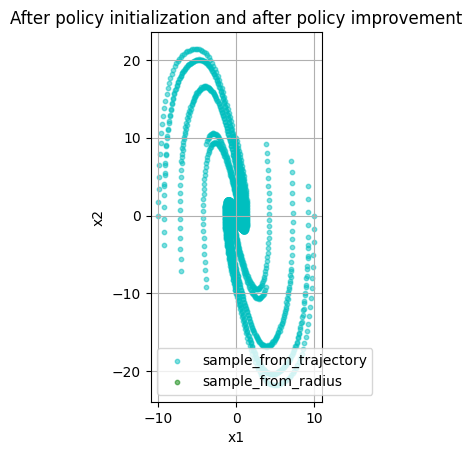

-----------------It takes 151 steps to converge.------------------


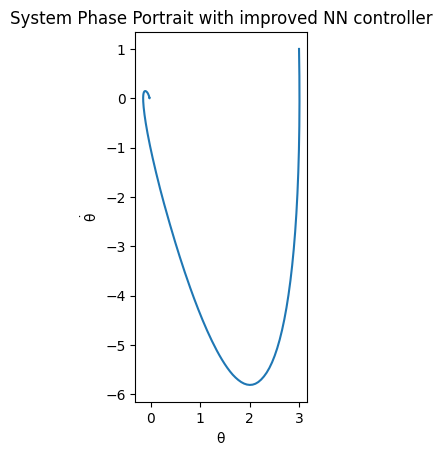

第32次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.3614549637
Epoch [2000/10000], Loss: 1.2542976141
Epoch [3000/10000], Loss: 1.2112494707
Epoch [4000/10000], Loss: 1.1964644194
Epoch [5000/10000], Loss: 1.1914716959
Epoch [6000/10000], Loss: 1.1900098324
Epoch [7000/10000], Loss: 1.1889694929
Epoch [8000/10000], Loss: 1.1881561279
Epoch [9000/10000], Loss: 1.1877057552
Epoch [10000/10000], Loss: 1.1873081923


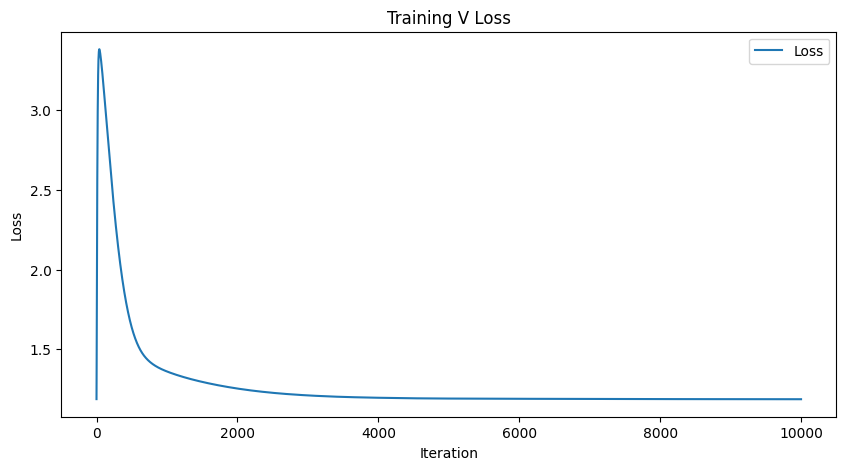

-----------------------Plotting Lyapunov-----------------------


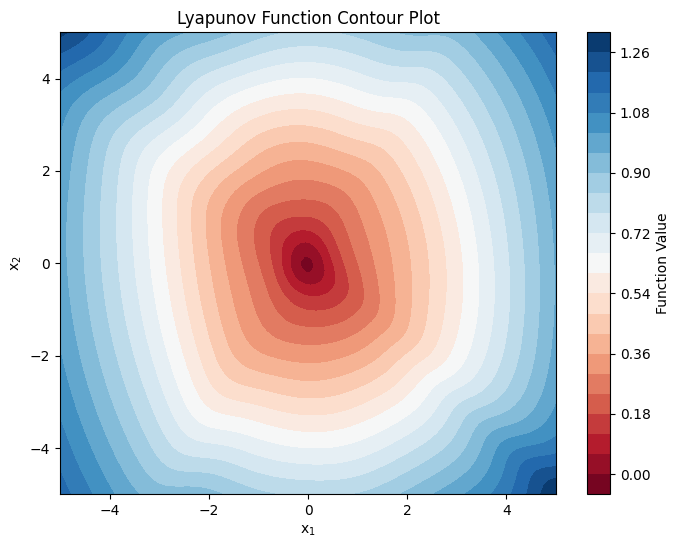

L0:tensor([-0.0145], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.8664636611938477, torch.sum(F.relu(dL)):1659.7232666015625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.5477774143
Epoch [2000/10000], Loss: 2.5739195347
Epoch [3000/10000], Loss: 2.5805671215
Epoch [4000/10000], Loss: 2.7927279472
Epoch [5000/10000], Loss: 2.6306357384
Epoch [6000/10000], Loss: 2.5233581066
Epoch [7000/10000], Loss: 2.5662021637
Epoch [8000/10000], Loss: 2.5845284462
Epoch [9000/10000], Loss: 2.5564184189
Epoch [10000/10000], Loss: 2.5723979473


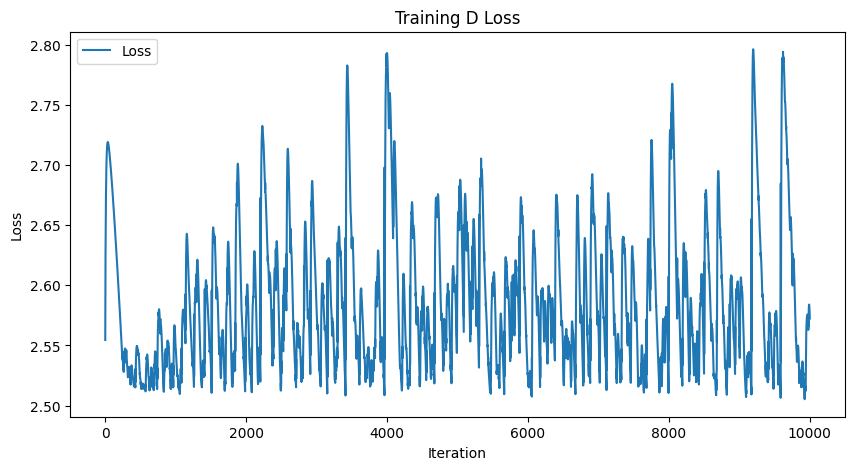

-----------------------Plotting Lyapunov-----------------------


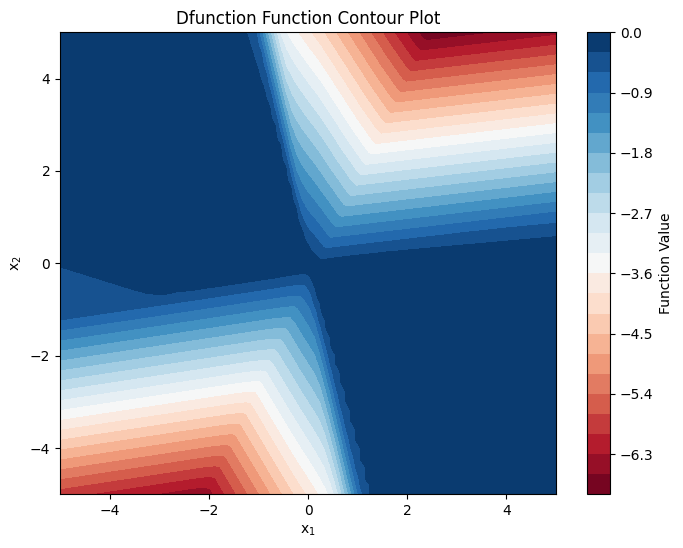

torch.sum(loss_fn(dL, DV_ext)):2.432396411895752, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0291], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


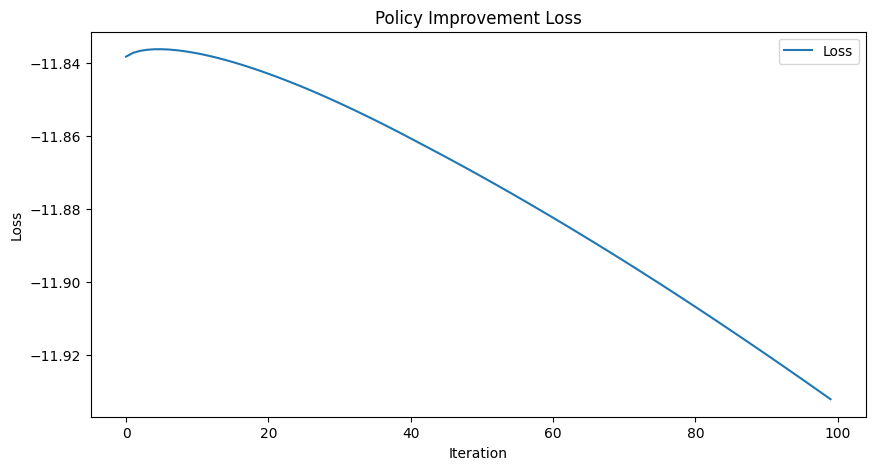

---------------------Sampling Training Data---------------------


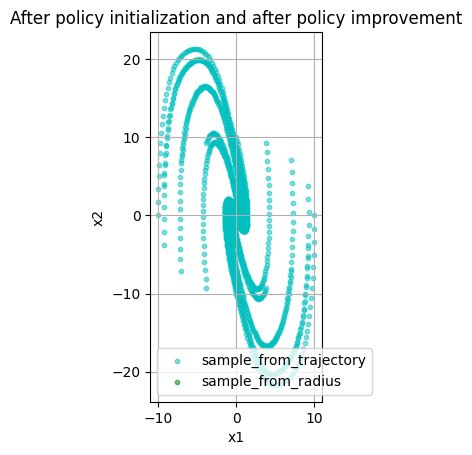

-----------------It takes 151 steps to converge.------------------


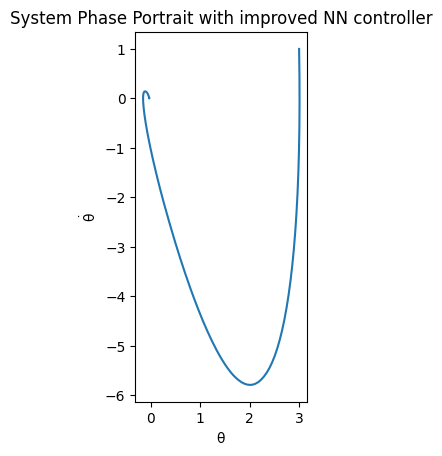

第33次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.3660849333
Epoch [2000/10000], Loss: 1.2499424219
Epoch [3000/10000], Loss: 1.2049522400
Epoch [4000/10000], Loss: 1.1907700300
Epoch [5000/10000], Loss: 1.1870106459
Epoch [6000/10000], Loss: 1.1858043671
Epoch [7000/10000], Loss: 1.1851452589
Epoch [8000/10000], Loss: 1.1847095490
Epoch [9000/10000], Loss: 1.1843605042
Epoch [10000/10000], Loss: 1.1839764118


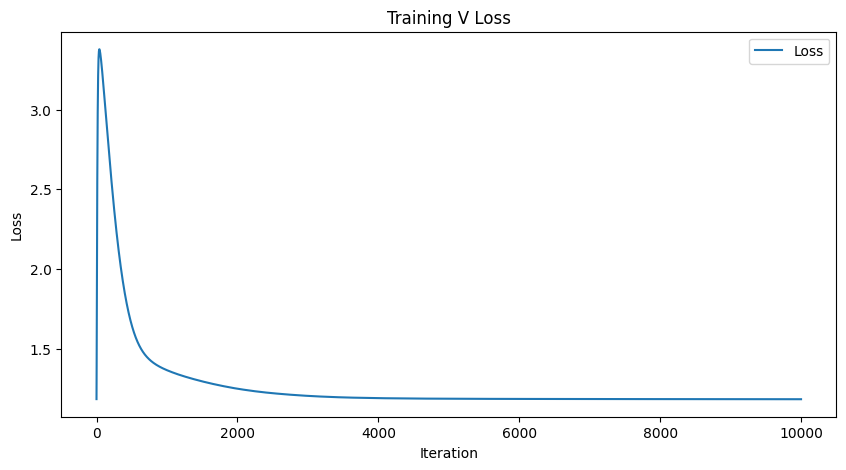

-----------------------Plotting Lyapunov-----------------------


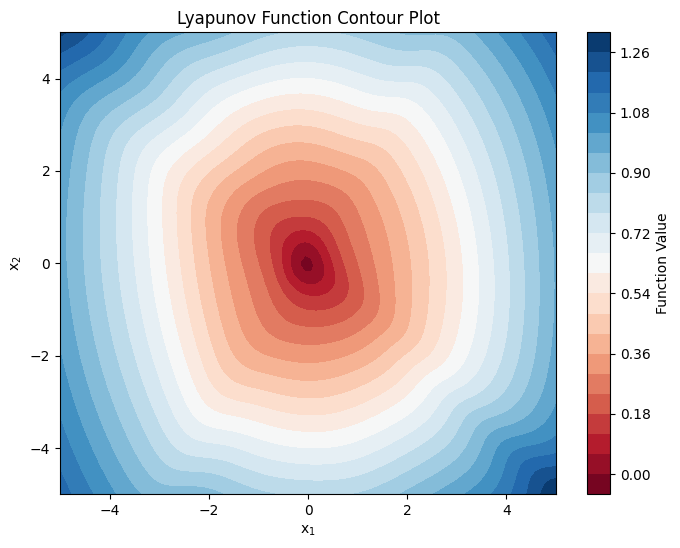

L0:tensor([-0.0139], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.8085544109344482, torch.sum(F.relu(dL)):1648.3997802734375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.5688359737
Epoch [2000/10000], Loss: 2.6297371387
Epoch [3000/10000], Loss: 2.6759018898
Epoch [4000/10000], Loss: 2.6562178135
Epoch [5000/10000], Loss: 2.5099897385
Epoch [6000/10000], Loss: 2.5054004192
Epoch [7000/10000], Loss: 2.5089263916
Epoch [8000/10000], Loss: 2.6225590706
Epoch [9000/10000], Loss: 2.5127191544
Epoch [10000/10000], Loss: 2.4964063168


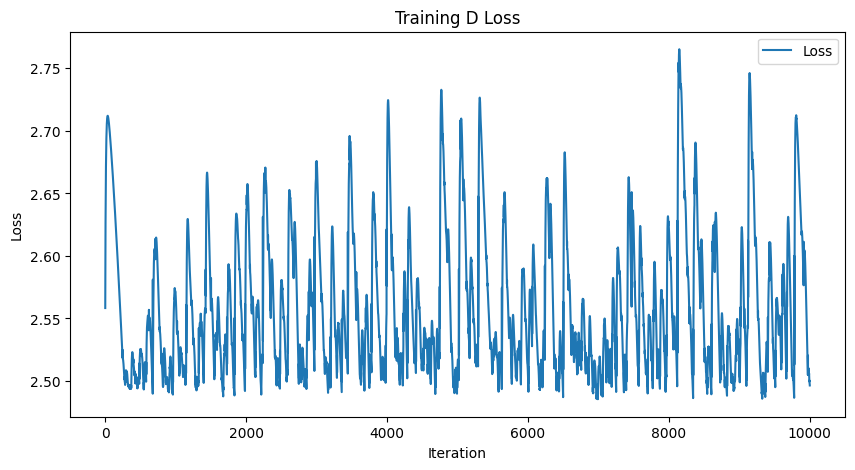

-----------------------Plotting Lyapunov-----------------------


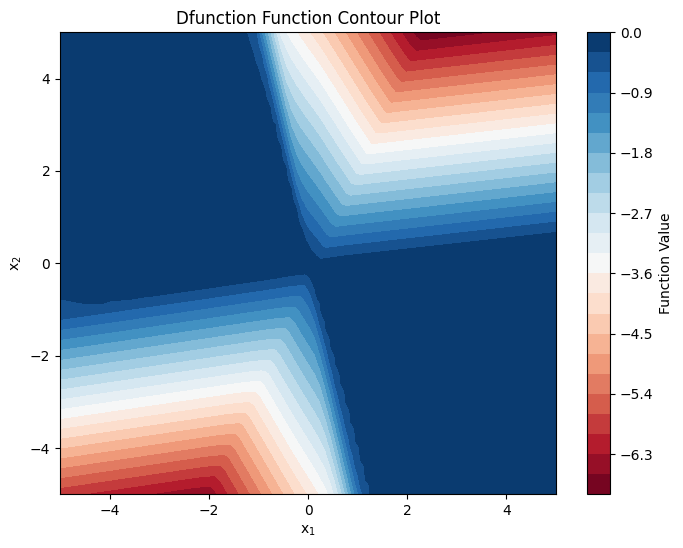

torch.sum(loss_fn(dL, DV_ext)):2.3613343238830566, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0283], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


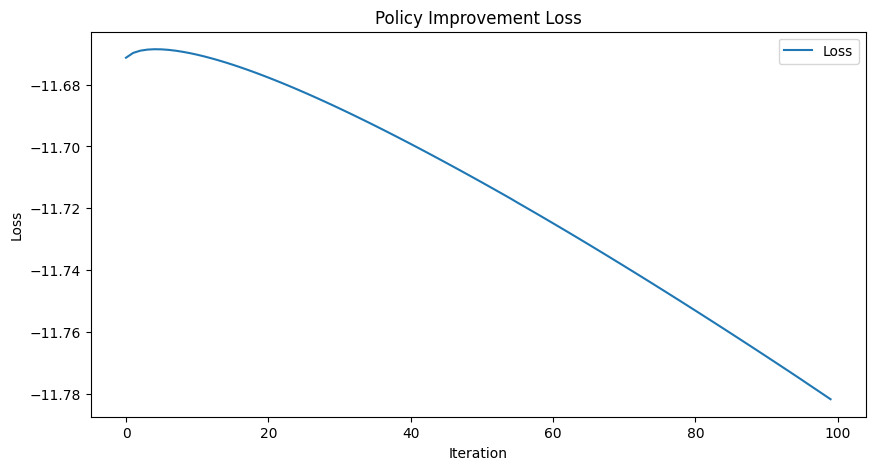

---------------------Sampling Training Data---------------------


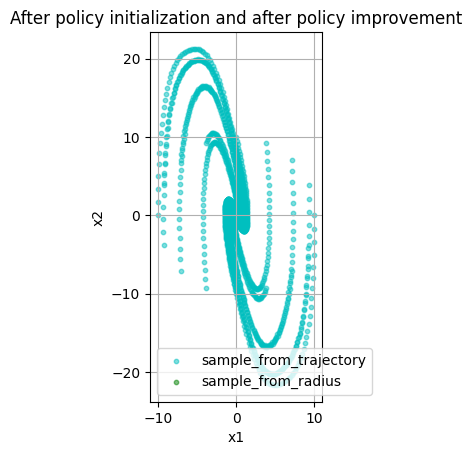

-----------------It takes 151 steps to converge.------------------


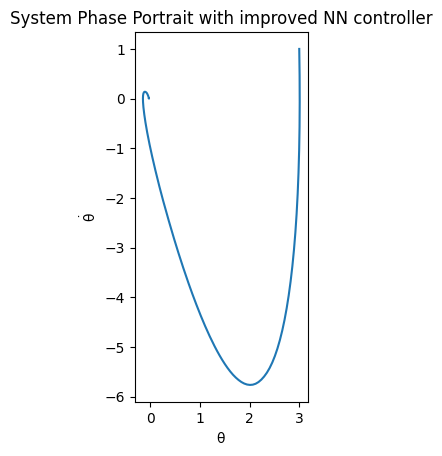

第34次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.3602712154
Epoch [2000/10000], Loss: 1.2441684008
Epoch [3000/10000], Loss: 1.2005767822
Epoch [4000/10000], Loss: 1.1868817806
Epoch [5000/10000], Loss: 1.1832084656
Epoch [6000/10000], Loss: 1.1819986105
Epoch [7000/10000], Loss: 1.1813129187
Epoch [8000/10000], Loss: 1.1808006763
Epoch [9000/10000], Loss: 1.1804109812
Epoch [10000/10000], Loss: 1.1800312996


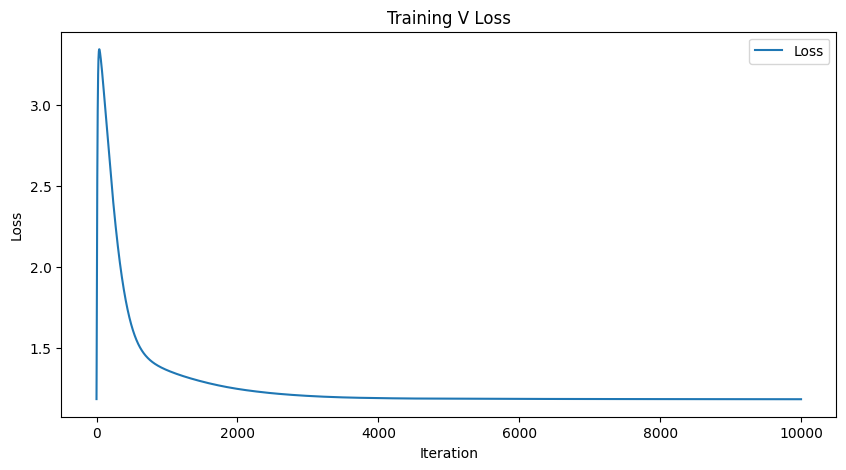

-----------------------Plotting Lyapunov-----------------------


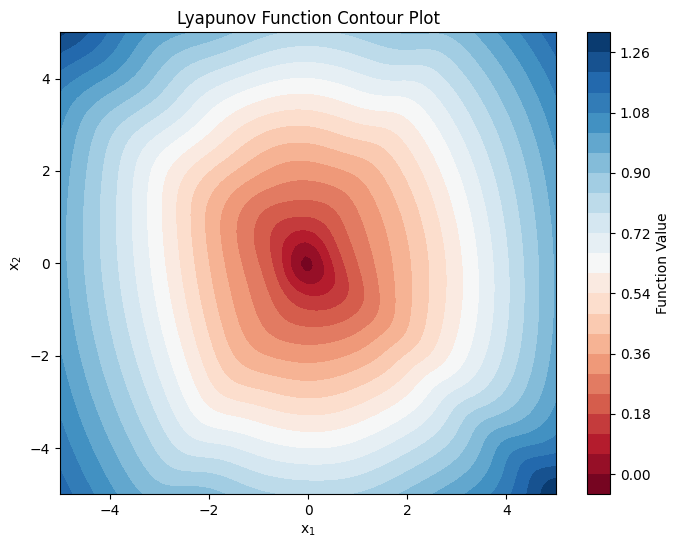

L0:tensor([-0.0133], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.7414336204528809, torch.sum(F.relu(dL)):1633.987060546875
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.4765262604
Epoch [2000/10000], Loss: 2.5141456127
Epoch [3000/10000], Loss: 2.4929764271
Epoch [4000/10000], Loss: 2.5458874702
Epoch [5000/10000], Loss: 2.5517625809
Epoch [6000/10000], Loss: 2.5064187050
Epoch [7000/10000], Loss: 2.5938754082
Epoch [8000/10000], Loss: 2.7703123093
Epoch [9000/10000], Loss: 2.5184698105
Epoch [10000/10000], Loss: 2.5852177143


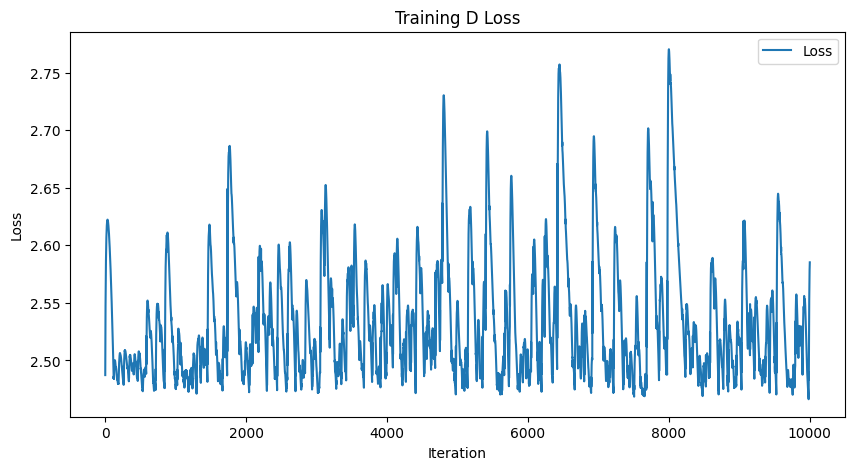

-----------------------Plotting Lyapunov-----------------------


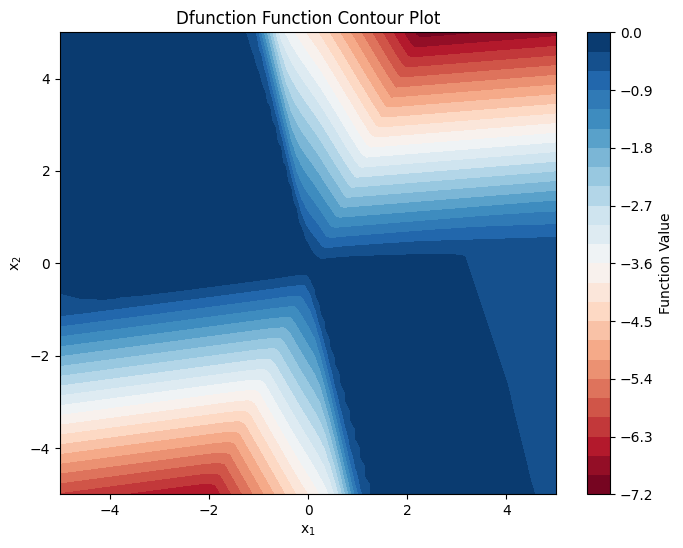

torch.sum(loss_fn(dL, DV_ext)):2.452230215072632, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0317], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


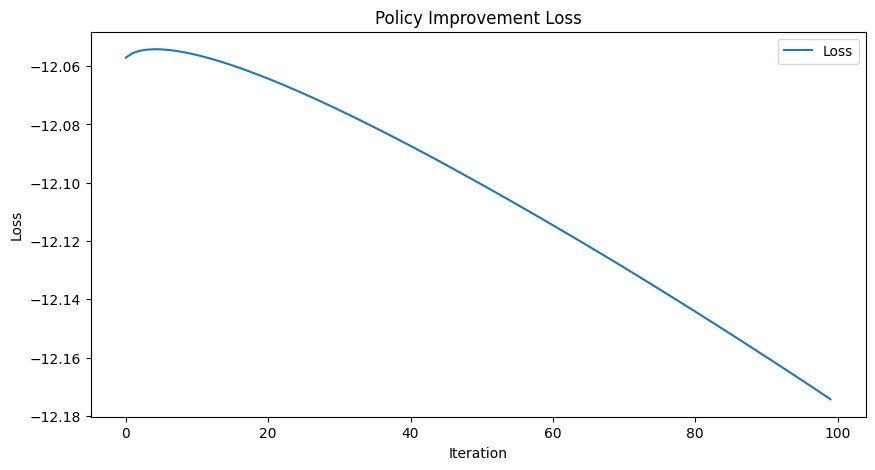

---------------------Sampling Training Data---------------------


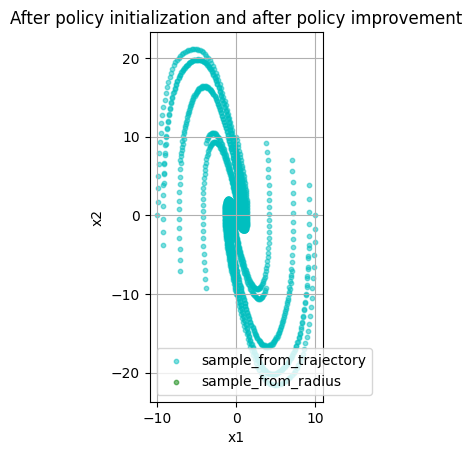

-----------------It takes 151 steps to converge.------------------


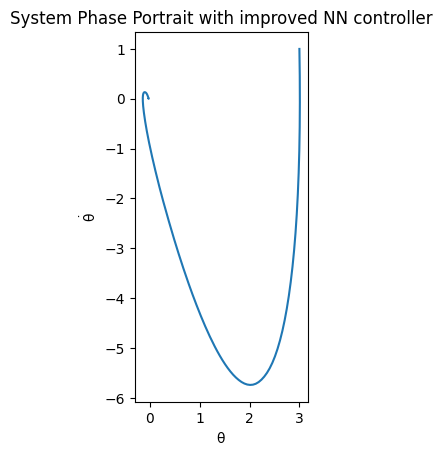

第35次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.3536957502
Epoch [2000/10000], Loss: 1.2366503477
Epoch [3000/10000], Loss: 1.1957371235
Epoch [4000/10000], Loss: 1.1829686165
Epoch [5000/10000], Loss: 1.1792000532
Epoch [6000/10000], Loss: 1.1778845787
Epoch [7000/10000], Loss: 1.1771835089
Epoch [8000/10000], Loss: 1.1766861677
Epoch [9000/10000], Loss: 1.1763142347
Epoch [10000/10000], Loss: 1.1759676933


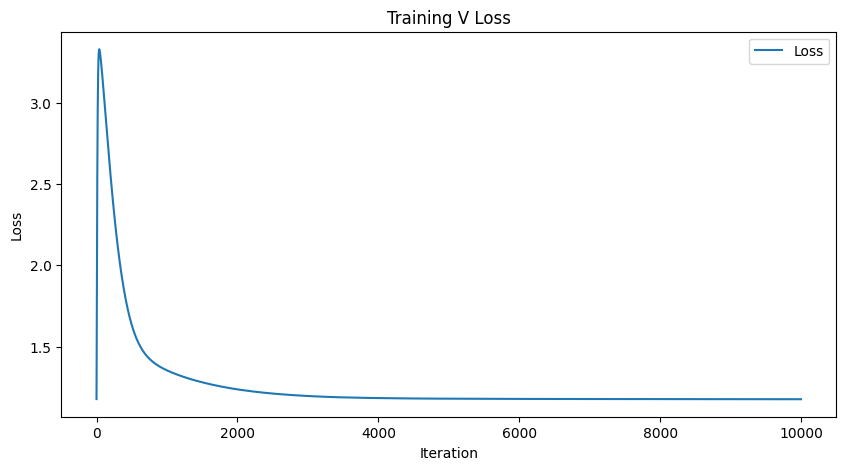

-----------------------Plotting Lyapunov-----------------------


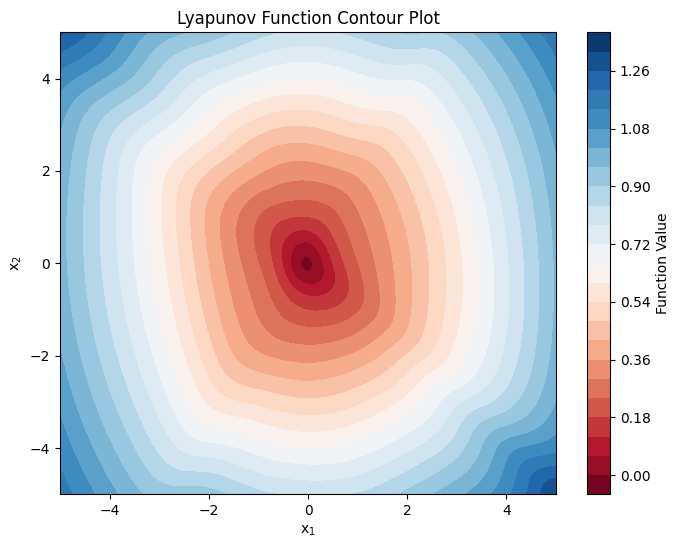

L0:tensor([-0.0124], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.6606888771057129, torch.sum(F.relu(dL)):1618.981689453125
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.4582958221
Epoch [2000/10000], Loss: 2.5560050011
Epoch [3000/10000], Loss: 2.7639224529
Epoch [4000/10000], Loss: 2.5895736217
Epoch [5000/10000], Loss: 2.4653067589
Epoch [6000/10000], Loss: 2.4932360649
Epoch [7000/10000], Loss: 2.4543271065
Epoch [8000/10000], Loss: 2.4838342667
Epoch [9000/10000], Loss: 2.5627126694
Epoch [10000/10000], Loss: 2.5287904739


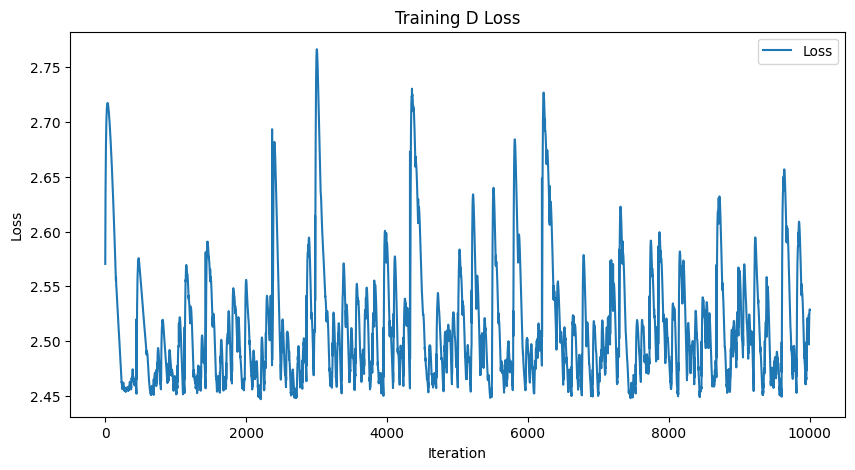

-----------------------Plotting Lyapunov-----------------------


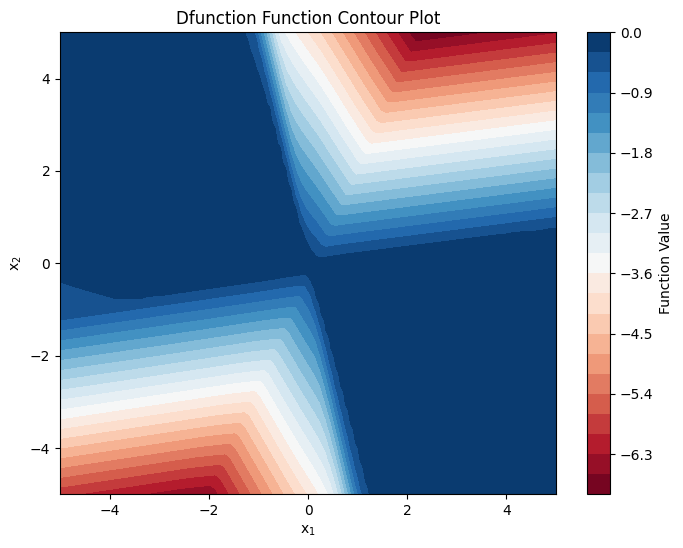

torch.sum(loss_fn(dL, DV_ext)):2.3994009494781494, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0295], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


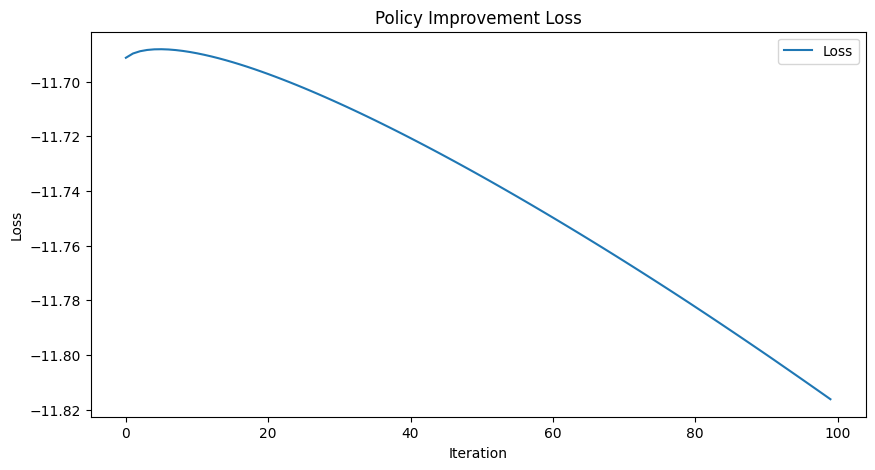

---------------------Sampling Training Data---------------------


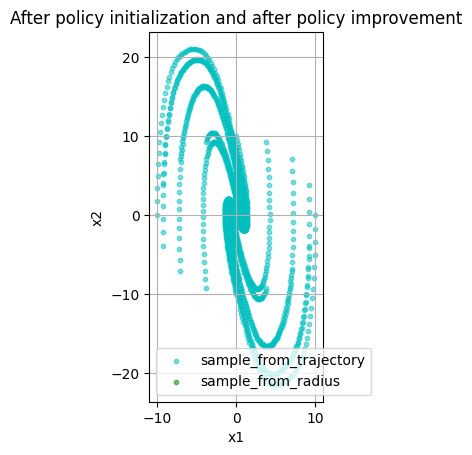

-----------------It takes 152 steps to converge.------------------


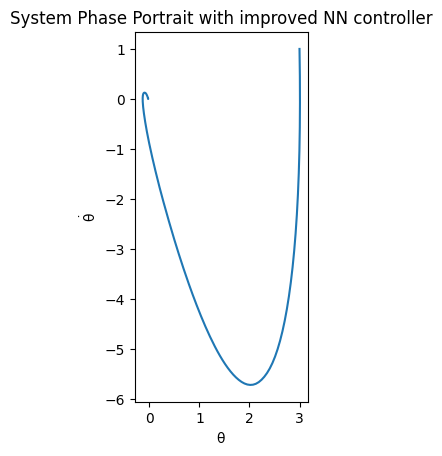

第36次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.3597853184
Epoch [2000/10000], Loss: 1.2332786322
Epoch [3000/10000], Loss: 1.1902306080
Epoch [4000/10000], Loss: 1.1782642603
Epoch [5000/10000], Loss: 1.1747770309
Epoch [6000/10000], Loss: 1.1734257936
Epoch [7000/10000], Loss: 1.1726827621
Epoch [8000/10000], Loss: 1.1721718311
Epoch [9000/10000], Loss: 1.1717891693
Epoch [10000/10000], Loss: 1.1714527607


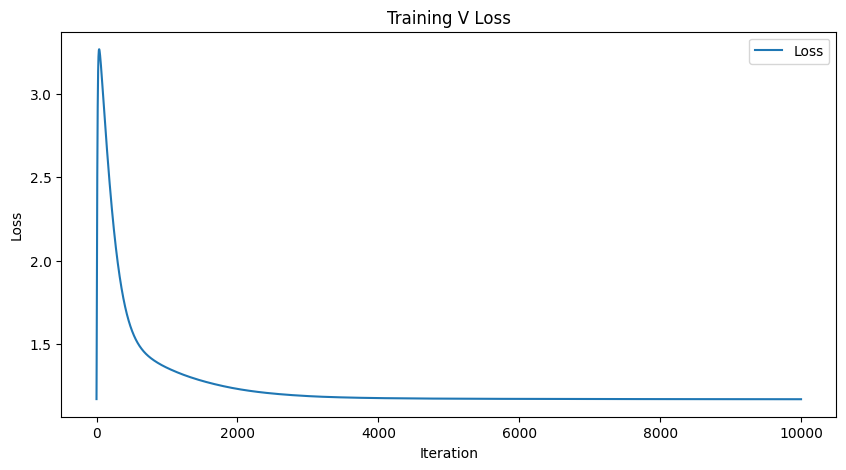

-----------------------Plotting Lyapunov-----------------------


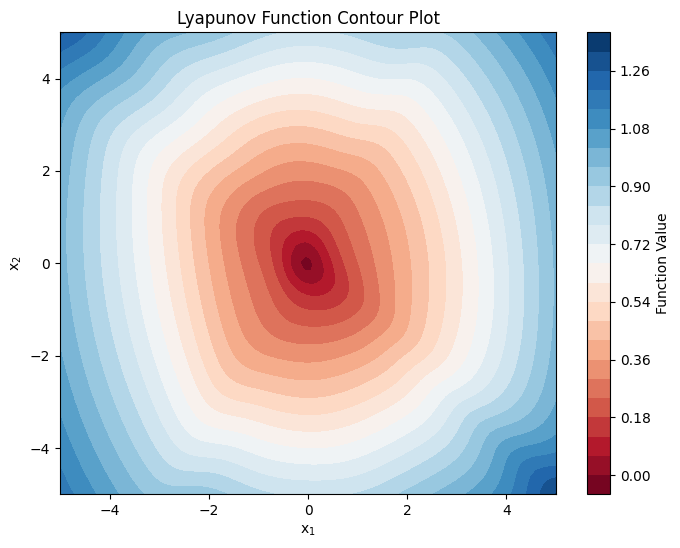

L0:tensor([-0.0117], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.5832846164703369, torch.sum(F.relu(dL)):1602.46533203125
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.4667325020
Epoch [2000/10000], Loss: 2.4407293797
Epoch [3000/10000], Loss: 2.4379706383
Epoch [4000/10000], Loss: 2.5037448406
Epoch [5000/10000], Loss: 2.5313804150
Epoch [6000/10000], Loss: 2.5382735729
Epoch [7000/10000], Loss: 2.4328446388
Epoch [8000/10000], Loss: 2.4744741917
Epoch [9000/10000], Loss: 2.5093524456
Epoch [10000/10000], Loss: 2.4421565533


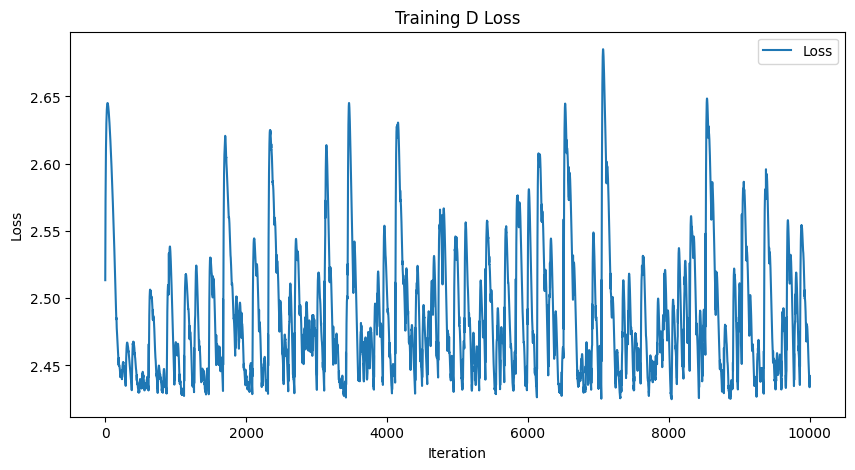

-----------------------Plotting Lyapunov-----------------------


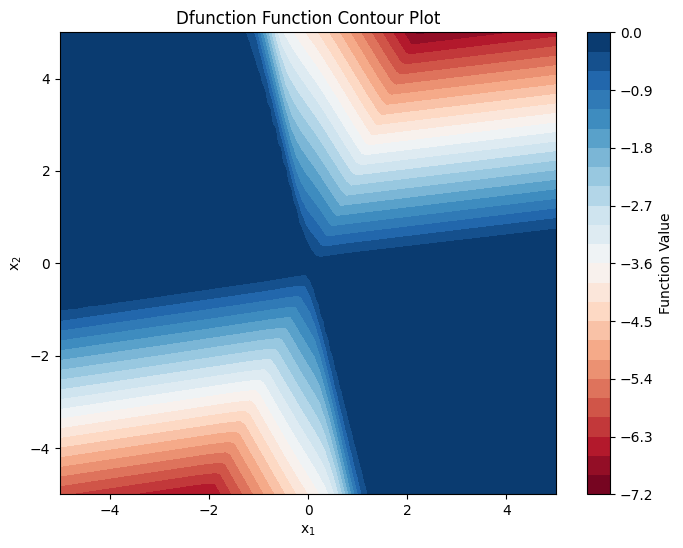

torch.sum(loss_fn(dL, DV_ext)):2.314955472946167, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0297], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


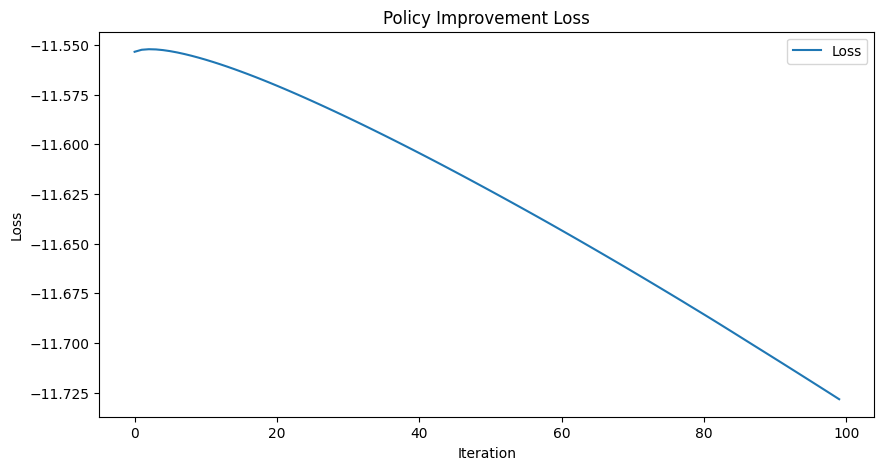

---------------------Sampling Training Data---------------------


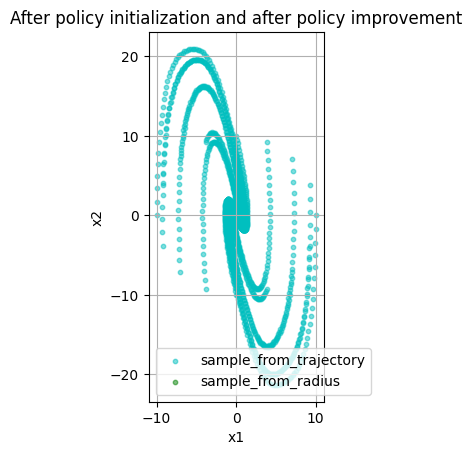

-----------------It takes 152 steps to converge.------------------


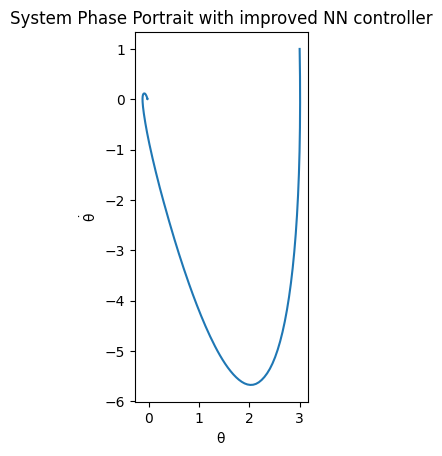

第37次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.3388388157
Epoch [2000/10000], Loss: 1.2247532606
Epoch [3000/10000], Loss: 1.1838866472
Epoch [4000/10000], Loss: 1.1717975140
Epoch [5000/10000], Loss: 1.1681962013
Epoch [6000/10000], Loss: 1.1669641733
Epoch [7000/10000], Loss: 1.1662781239
Epoch [8000/10000], Loss: 1.1658068895
Epoch [9000/10000], Loss: 1.1654306650
Epoch [10000/10000], Loss: 1.1650965214


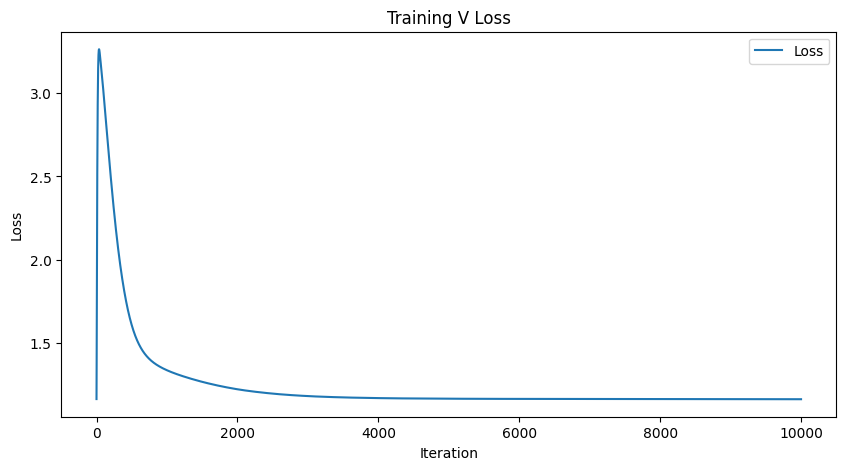

-----------------------Plotting Lyapunov-----------------------


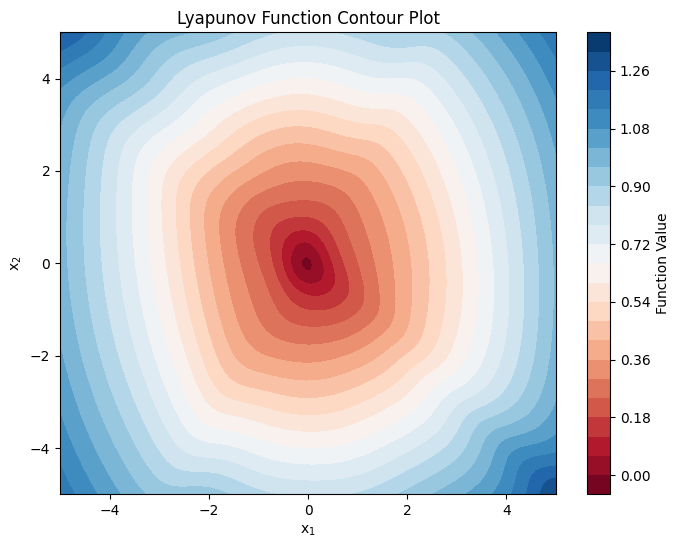

L0:tensor([-0.0107], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.47115612030029297, torch.sum(F.relu(dL)):1580.08349609375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.4366190434
Epoch [2000/10000], Loss: 2.4032256603
Epoch [3000/10000], Loss: 2.3933594227
Epoch [4000/10000], Loss: 2.5262913704
Epoch [5000/10000], Loss: 2.4241070747
Epoch [6000/10000], Loss: 2.4193906784
Epoch [7000/10000], Loss: 2.4978430271
Epoch [8000/10000], Loss: 2.5445771217
Epoch [9000/10000], Loss: 2.4297914505
Epoch [10000/10000], Loss: 2.4050607681


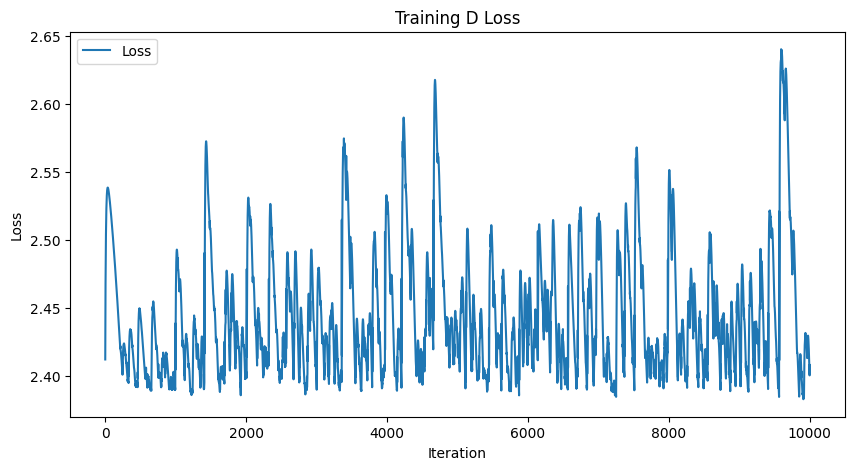

-----------------------Plotting Lyapunov-----------------------


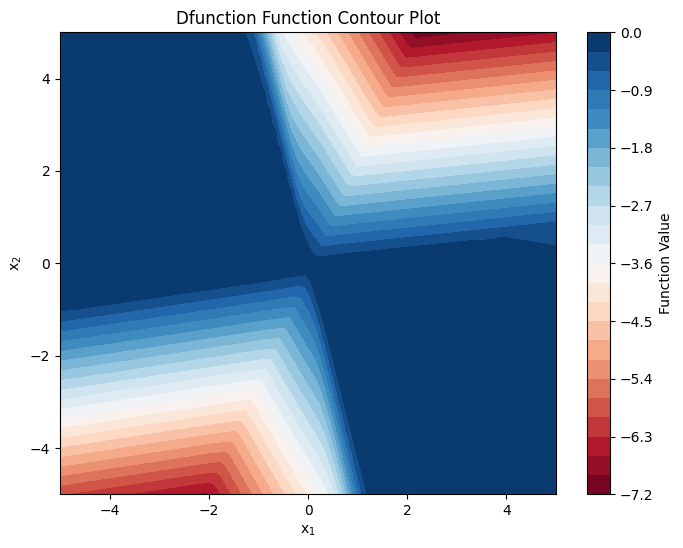

torch.sum(loss_fn(dL, DV_ext)):2.281637668609619, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0308], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


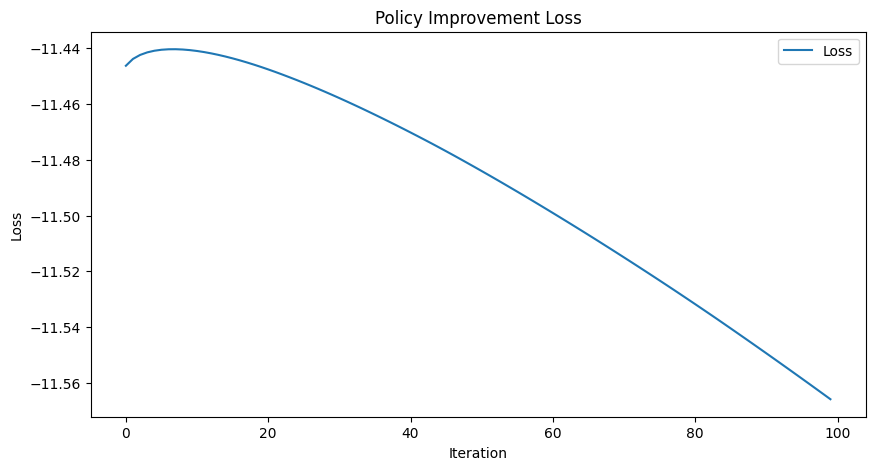

---------------------Sampling Training Data---------------------


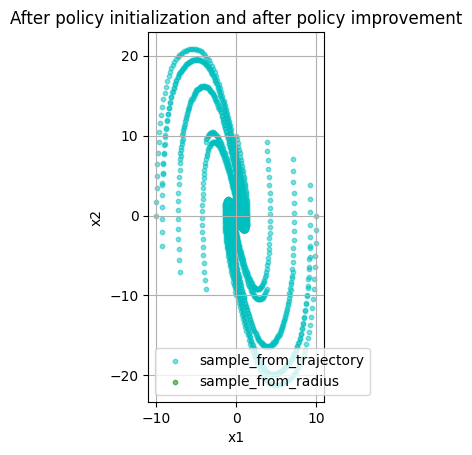

-----------------It takes 152 steps to converge.------------------


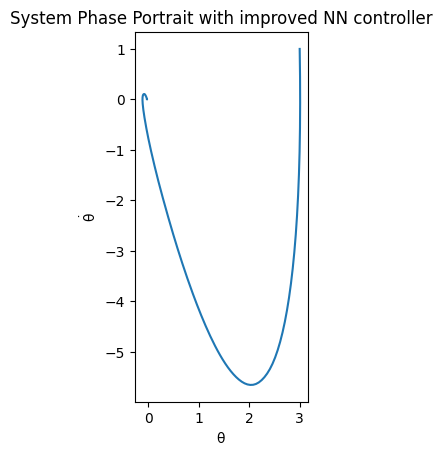

第38次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.3327813148
Epoch [2000/10000], Loss: 1.2192097902
Epoch [3000/10000], Loss: 1.1790504456
Epoch [4000/10000], Loss: 1.1669155359
Epoch [5000/10000], Loss: 1.1632854939
Epoch [6000/10000], Loss: 1.1620286703
Epoch [7000/10000], Loss: 1.1613487005
Epoch [8000/10000], Loss: 1.1608906984
Epoch [9000/10000], Loss: 1.1605103016
Epoch [10000/10000], Loss: 1.1601722240


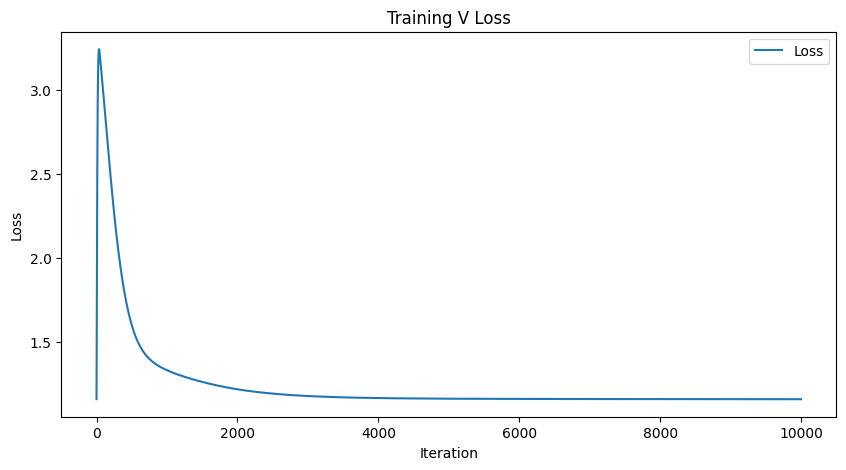

-----------------------Plotting Lyapunov-----------------------


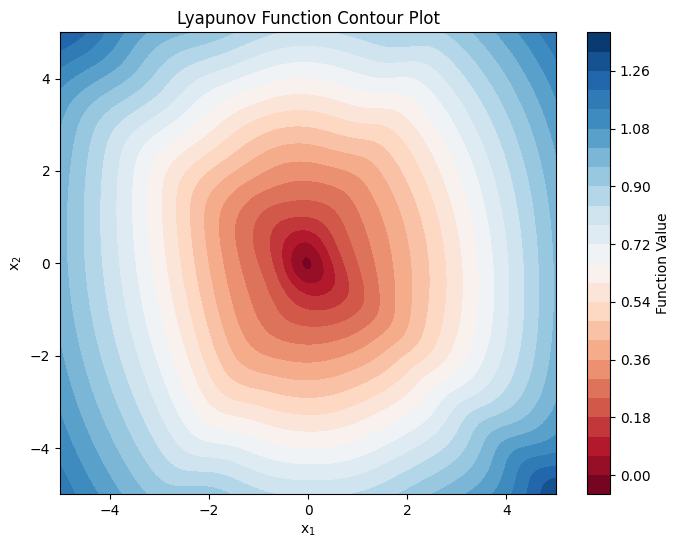

L0:tensor([-0.0100], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.3953216075897217, torch.sum(F.relu(dL)):1563.851318359375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.3672294617
Epoch [2000/10000], Loss: 2.4183254242
Epoch [3000/10000], Loss: 2.3991365433
Epoch [4000/10000], Loss: 2.4187269211
Epoch [5000/10000], Loss: 2.4037628174
Epoch [6000/10000], Loss: 2.3961181641
Epoch [7000/10000], Loss: 2.3672761917
Epoch [8000/10000], Loss: 2.4374363422
Epoch [9000/10000], Loss: 2.4358618259
Epoch [10000/10000], Loss: 2.3890566826


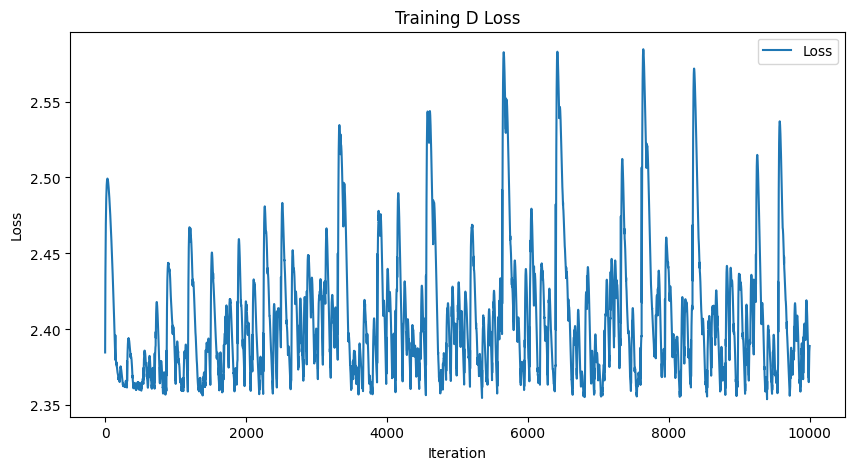

-----------------------Plotting Lyapunov-----------------------


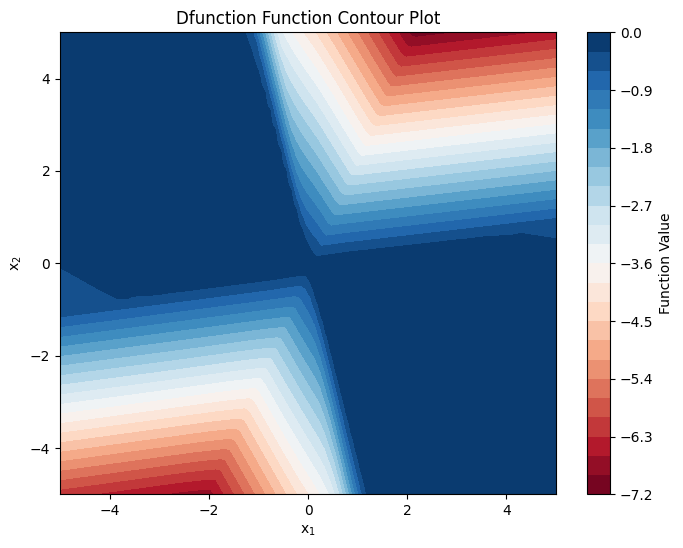

torch.sum(loss_fn(dL, DV_ext)):2.2677254676818848, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0317], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


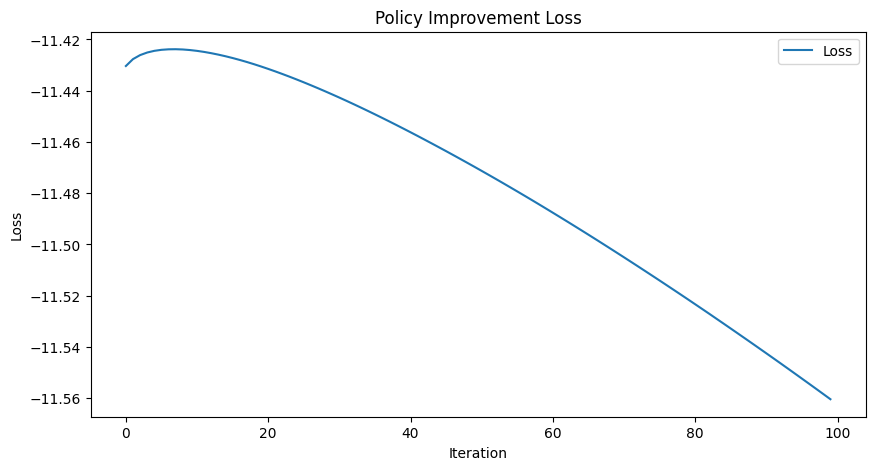

---------------------Sampling Training Data---------------------


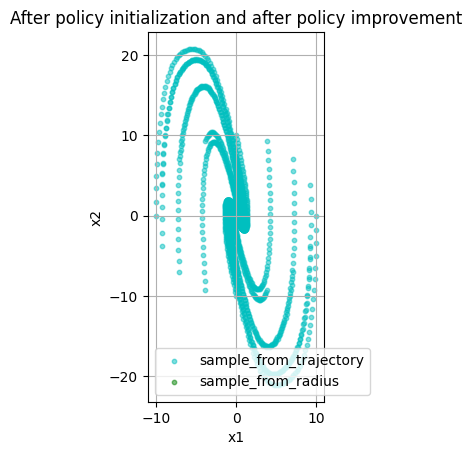

-----------------It takes 153 steps to converge.------------------


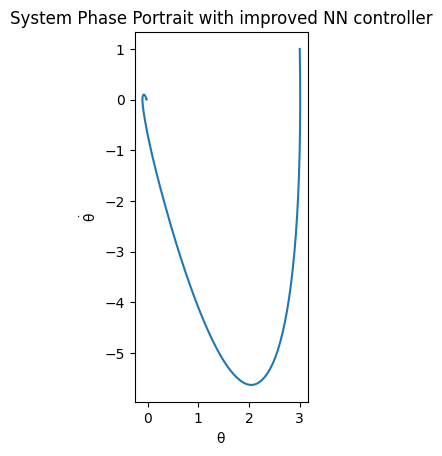

第39次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.3313436508
Epoch [2000/10000], Loss: 1.2143796682
Epoch [3000/10000], Loss: 1.1740676165
Epoch [4000/10000], Loss: 1.1620621681
Epoch [5000/10000], Loss: 1.1580026150
Epoch [6000/10000], Loss: 1.1567156315
Epoch [7000/10000], Loss: 1.1560275555
Epoch [8000/10000], Loss: 1.1555608511
Epoch [9000/10000], Loss: 1.1551661491
Epoch [10000/10000], Loss: 1.1548205614


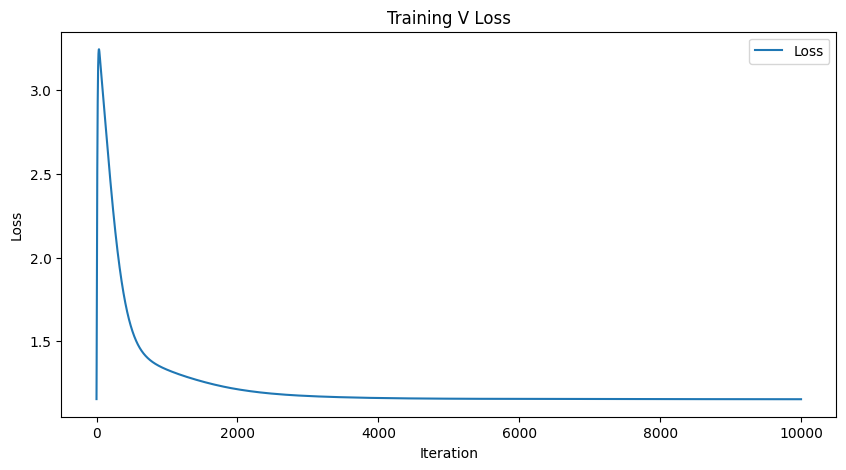

-----------------------Plotting Lyapunov-----------------------


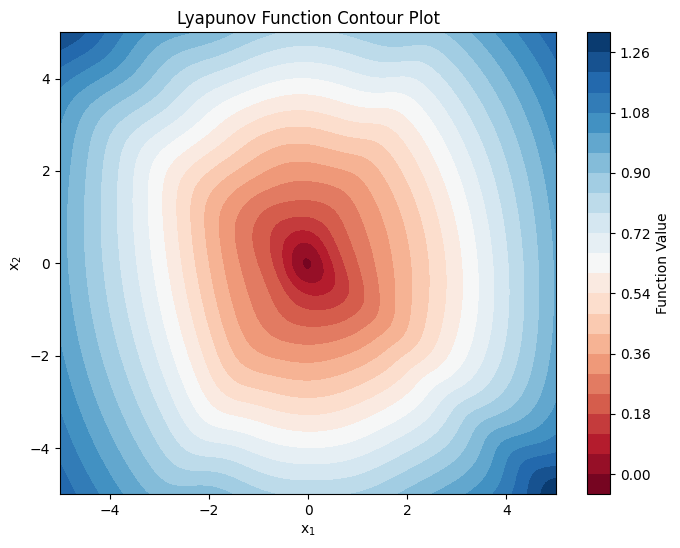

L0:tensor([-0.0090], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.30598926544189453, torch.sum(F.relu(dL)):1546.601806640625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.3318374157
Epoch [2000/10000], Loss: 2.3366115093
Epoch [3000/10000], Loss: 2.3537943363
Epoch [4000/10000], Loss: 2.3393301964
Epoch [5000/10000], Loss: 2.3701972961
Epoch [6000/10000], Loss: 2.3882820606
Epoch [7000/10000], Loss: 2.3509380817
Epoch [8000/10000], Loss: 2.3638689518
Epoch [9000/10000], Loss: 2.4196932316
Epoch [10000/10000], Loss: 2.3286581039


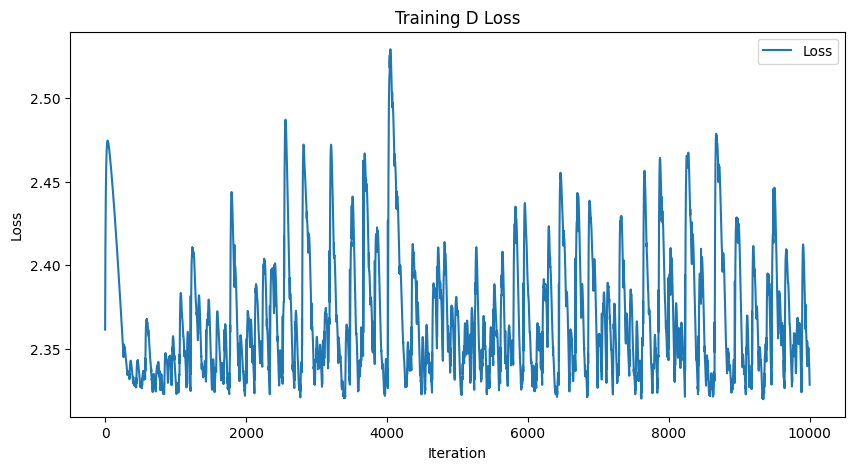

-----------------------Plotting Lyapunov-----------------------


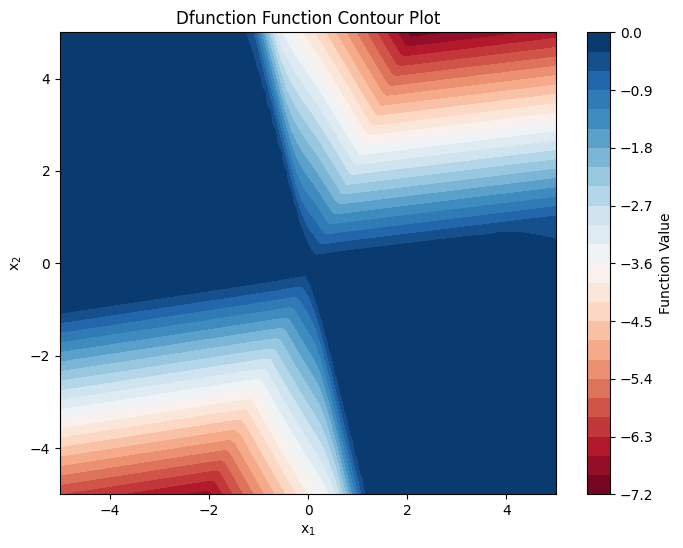

torch.sum(loss_fn(dL, DV_ext)):2.2107455730438232, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0325], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


In [ ]:
############ 只重新点击这里，前面不变

# 获取训练开始的时间戳
start_time = datetime.now()

# 创建一个空列表来存储每次迭代的 stepconverge 值
stepconverge_list = []
stepconverge_list.append(stepconverge_initial)

for i in range(40):
    print(f"第{i+1}次迭代")
    d1.learn_V_LNN(sample_data = sim_data,
                iteration = 1*10**4,
                plot_loss = True,
                plot_lyapuonv = True,
                lr = 1e-3)

    d1.learn_D_DNN(sample_data = sim_data,
                iteration = 10**4,
                plot_loss = True,
                plot_dfunction = True,
                lr = 1e-4)

    d1.policy_improvement_PPO(sample_data = sim_data,
                        iteration = 10**2,
                        plot_loss = True)


    sim_data = d1.sample_training_data(sample_trajectory_number = 16,
                                    sample_number_per_trajectory = 200,
                                    sample_radius = 10,
                                    sample_number_in_radius = 0,
                                    invariant_sample = 1,
                                    sample_plot = 1,
                                    the_controller = d1.actor.Controller,
                                    title = 'After policy initialization and after policy improvement')

    x_initial = torch.tensor([[3],[1]]).to(device)
    step_num = 4000
    sim_data_ = p1.simulate_rk4(x_initial = x_initial, 
                            step_number = step_num,
                            use_controller = 1,
                            the_controller = d1.actor.Controller)
    
    stepconverge = p1.convergence_judgment(sim_data_)
    stepconverge_list.append(stepconverge)  # 将每次迭代的 stepconverge 值添加到列表中

    p1.plot_phase_portrait(data_sim = sim_data_,
                        arrow_on = False,
                        title = 'System Phase Portrait with improved NN controller')
  
# 获取训练结束的时间戳
end_time = datetime.now()
# 计算训练时间
training_duration = end_time - start_time
training_duration_str = str(training_duration)

                                                             
# 绘制 stepconverge 值随迭代次数变化的折线图
plt.figure()
plt.plot(range(1, len(stepconverge_list) + 1), stepconverge_list, marker='o')
plt.axhline(y=stepconverge_initial, color='r', linestyle='--', label=f'stepconverge_initial = {stepconverge_initial}')
plt.xlabel('Iteration')
plt.ylabel('Step Convergence')
plt.title('Step Convergence over Iterations')
plt.grid(True)
plt.legend()  # Show legend with added line
plt.show()


# 假设 iteration 是当前的训练次数
iteration = 3  # 应该根据实际情况设置

# 保存控制器
torch.save(d1.actor.Controller, f'result/DL_Clip/controller_DL_Clip_{iteration}.pth')
torch.save(d1.lyapunov, f'result/DL_Clip/lyapunov_DL_Clip_{iteration}.pth')
torch.save(d1.dfunction, f'result/DL_Clip/dfunction_DL_Clip_{iteration}.pth')

# 保存 stepconverge_list 到文件
with open(f'result/DL_Clip/stepconverge_list_controller_DL_Clip_{iteration}.pk', 'wb') as f:
    pickle.dump(stepconverge_list, f)
    
# 将训练时间写入到一个文本文件中
with open(f'result/DL_Clip/training_duration_{iteration}.txt', 'w') as f:
    f.write(f'Training duration: {training_duration_str}')